In [1]:
from mpytools import Catalog
import utils
import glob
import numpy as np
import matplotlib.pyplot as plt



In [524]:
sweep = Catalog.read(glob.glob('/pscratch/sd/a/arocher/4MOST/sweep-vista/sweep-vista-zp/*/sweep-vista-zp-*.fits'))

In [525]:
(sweep['vista_ra'] != 0).sum()

KeyboardInterrupt: 

In [ ]:
1567239332

In [ ]:
bgt = Catalog.read('/pscratch/sd/a/arocher/4MOST/rd_4most_0.fits')

In [ ]:
import healpy as hp

ra, dec = hp.pix2ang(128, (np.arange(hp.nside2npix(128))), lonlat=True, nest=True)
mask = utils.get_4most_s8foot(ra, dec, bg_fp=False)

In [ ]:
pix = Catalog.read('/pscratch/sd/e/edmondc/antoine/Legacy_Imaging_DR10_footprint_128.fits')

In [ ]:
pix.write('/pscratch/sd/e/edmondc/antoine/Legacy_Imaging_DR10_footprint_128.fits')

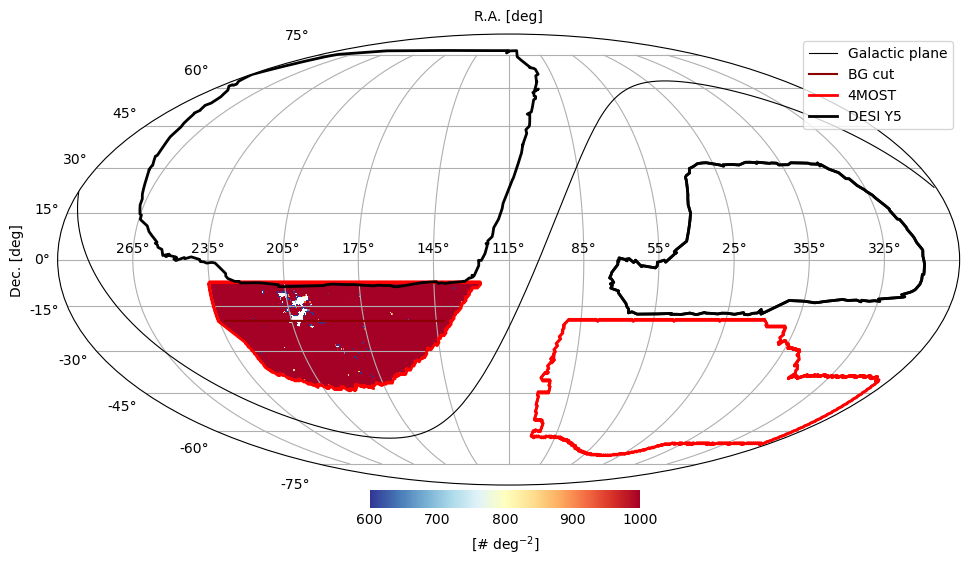

In [ ]:
hpmap = utils.create_hp_map(bgt['RA'], bgt['DEC'], nside=128, nest=True)
#hpmap_ebv = utils.create_hp_map(lrg['RA'], lrg['DEC'], weight=lrg['EBV'], nside=128)
hpmap[~pix['IS4MOST_LRG'] | ~pix['ISNGC']]=0
utils.plot_moll(hpmap, rot=115, min=600, max=1000, desi_footprint=True, fourmost_footprint=True, nest=True)
#utils.plot_moll(hpmap, hpmap_ebv, rot=115, min=0, max=.2, desi_footprint=True, fourmost_footprint=True)

In [ ]:
#bg1 = Catalog.read('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1/sweep-090m055-095m050.fits')
bg1pz = Catalog.read('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-090m055-095m050-pz.fits')

In [ ]:
Catalog.concatenate(bg[mask], bg1, intersection=True)['RA']

array([302.95451246 302.97623681 302.97942112 ...  93.85711604  93.85712346
  93.85713979])

In [ ]:
bg1[bg1pz.columns()] = bg1pz

In [ ]:
bg1['is_foots8'] = bg1.zeros()==1

array([0. 0. 0. ... 0. 0. 0.])

In [ ]:

bgt=Catalog.concatenate(bg, bg1[mask_bg], intersection=True)

In [ ]:
bgt

Catalog(csize=7943241, size=7943241, columns=['RELEASE', 'BRICKID', 'BRICKNAME', 'OBJID', 'TYPE', 'RA', 'DEC', 'RA_IVAR', 'DEC_IVAR', 'DCHISQ', 'EBV', 'FLUX_G', 'FLUX_R', 'FLUX_I', 'FLUX_Z', 'FLUX_W1', 'FLUX_W2', 'FLUX_W3', 'FLUX_W4', 'FLUX_IVAR_G', 'FLUX_IVAR_R', 'FLUX_IVAR_I', 'FLUX_IVAR_Z', 'FLUX_IVAR_W1', 'FLUX_IVAR_W2', 'FLUX_IVAR_W3', 'FLUX_IVAR_W4', 'MW_TRANSMISSION_G', 'MW_TRANSMISSION_R', 'MW_TRANSMISSION_I', 'MW_TRANSMISSION_Z', 'MW_TRANSMISSION_W1', 'MW_TRANSMISSION_W2', 'MW_TRANSMISSION_W3', 'MW_TRANSMISSION_W4', 'NOBS_G', 'NOBS_R', 'NOBS_I', 'NOBS_Z', 'NOBS_W1', 'NOBS_W2', 'NOBS_W3', 'NOBS_W4', 'RCHISQ_G', 'RCHISQ_R', 'RCHISQ_I', 'RCHISQ_Z', 'RCHISQ_W1', 'RCHISQ_W2', 'RCHISQ_W3', 'RCHISQ_W4', 'FRACFLUX_G', 'FRACFLUX_R', 'FRACFLUX_I', 'FRACFLUX_Z', 'FRACFLUX_W1', 'FRACFLUX_W2', 'FRACFLUX_W3', 'FRACFLUX_W4', 'FRACMASKED_G', 'FRACMASKED_R', 'FRACMASKED_I', 'FRACMASKED_Z', 'FRACIN_G', 'FRACIN_R', 'FRACIN_I', 'FRACIN_Z', 'ANYMASK_G', 'ANYMASK_R', 'ANYMASK_I', 'ANYMASK_Z', 'ALLM

In [ ]:
files = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1/*.fits')
files_zp = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/*.fits')

In [ ]:
glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-090m055*m050-pz.fits')


['/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-090m055-095m050-pz.fits']

In [ ]:
import pymangle 
mng    = pymangle.Mangle('/pscratch/sd/a/arocher/4MOST/mask_footprint/des.ply')
polyid = mng.polyid(bg['RA'],bg['DEC'])
keep   = (polyid!=-1)

Error reading header keyword

OSError: Error reading mangle mask /pscratch/sd/a/arocher/4MOST/mask_footprint/

In [ ]:
def get_4most_lrg_new_sel(data, shift = 0): #shift = 0.0825

    gflux = data['FLUX_G']
    gMW = data['MW_TRANSMISSION_G']
    gmag = 22.5 - 2.5*np.log10(gflux/gMW)

    rflux = data['FLUX_R']
    rMW = data['MW_TRANSMISSION_R']
    rmag = 22.5 - 2.5*np.log10(rflux/rMW)

    zflux = data['FLUX_Z']
    zMW = data['MW_TRANSMISSION_Z']
    zmag = 22.5 - 2.5*np.log10(zflux/zMW)

    w1flux = data['FLUX_W1']
    w1MW = data['MW_TRANSMISSION_W1']
    w1mag = 22.5 - 2.5*np.log10(w1flux/w1MW)

    fiberz_flux = data['FIBERFLUX_Z']
    fiberz = 22.5 - 2.5*np.log10(fiberz_flux/zMW)

    alpha_new = 1.8
    beta_new = 17.14 - shift
    gamma_new = 16.33 - 1.5*shift

    mask_tot_ls = fiberz < 21.6
    mask_tot_ls &= (zmag - w1mag) > 0.8*(rmag - zmag) - 0.6
    mask_tot_ls &= ((gmag - w1mag) > 2.9) | ((rmag - w1mag) > 1.8)  # pq 2.97 et pas 2.9
    mask_tot_ls &= (rmag - w1mag > alpha_new*(w1mag - beta_new)) & ((rmag - w1mag > w1mag - gamma_new))

    # I would remove this cut
    #mask_tot_ls &= (photz > 0) & (photz < 1.4)

    # cut according Nobs,
    mask = (data['NOBS_G'] == 0) | (data['NOBS_R'] == 0) | (data['NOBS_Z'] == 0) | (data['NOBS_W1'] == 0)
    mask_tot_ls &= ~mask
    # cut according bad photometry
    mask = (data['FLUX_IVAR_R'] < 0) | (data['FLUX_IVAR_Z'] < 0) | (data['FLUX_IVAR_W1'] < 0) | (data['FLUX_G'] < 0)
    mask_tot_ls &= ~mask

    # Additionnal cuts from the DESI LRG TS
    mask_tot_ls &= fiberz > 17.5
    mask_tot_ls &= data['GAIA_PHOT_G_MEAN_MAG'] < 18 
    mask_tot_ls &= ~(data['MASKBITS'] & 2**1 > 0)
    mask_tot_ls &= ~(data['MASKBITS'] & 2**12 > 0)
    mask_tot_ls &= ~(data['MASKBITS'] & 2**13 > 0)

    
    return mask_tot_ls

In [ ]:
mask_bg = utils.get_desi_bright_bgs_sel(bg1)

In [ ]:
mask =utils.get_4most_s8foot(bgt['RA'],bgt['DEC'])

In [ ]:
bgt['isfoots8'] = mask

In [ ]:
bgt['RELEASE', 'BRICKID', 'BRICKNAME', 'OBJID', 'TYPE', 'RA', 'DEC', 'RA_IVAR', 'DEC_IVAR', 'DCHISQ', 'EBV', 'FLUX_G', 'FLUX_R', 'FLUX_I', 'FLUX_Z', 'FLUX_W1', 'FLUX_W2', 'FLUX_W3', 'FLUX_W4', 'FLUX_IVAR_G', 
    'FLUX_IVAR_R', 'FLUX_IVAR_I', 'FLUX_IVAR_Z', 'FLUX_IVAR_W1', 'FLUX_IVAR_W2', 'FLUX_IVAR_W3', 'FLUX_IVAR_W4', 'MW_TRANSMISSION_G', 'MW_TRANSMISSION_R', 'MW_TRANSMISSION_I', 'MW_TRANSMISSION_Z', 'MW_TRANSMISSION_W1', 
    'MW_TRANSMISSION_W2', 'MW_TRANSMISSION_W3', 'MW_TRANSMISSION_W4', 'NOBS_G', 'NOBS_R', 'NOBS_I', 'NOBS_Z', 'NOBS_W1', 'NOBS_W2', 'NOBS_W3', 'NOBS_W4', 'RCHISQ_G', 'RCHISQ_R', 'RCHISQ_I', 'RCHISQ_Z', 'RCHISQ_W1', 'RCHISQ_W2', 
    'RCHISQ_W3', 'RCHISQ_W4', 'FRACFLUX_G', 'FRACFLUX_R', 'FRACFLUX_I', 'FRACFLUX_Z', 'FRACFLUX_W1', 'FRACFLUX_W2', 'FRACFLUX_W3', 'FRACFLUX_W4', 'FRACMASKED_G', 'FRACMASKED_R', 'FRACMASKED_I', 'FRACMASKED_Z', 'FRACIN_G', 'FRACIN_R', 
    'FRACIN_I', 'FRACIN_Z', 'ANYMASK_G', 'ANYMASK_R', 'ANYMASK_I', 'ANYMASK_Z', 'ALLMASK_G', 'ALLMASK_R', 'ALLMASK_I', 'ALLMASK_Z', 'WISEMASK_W1', 'WISEMASK_W2', 'PSFSIZE_G', 'PSFSIZE_R', 'PSFSIZE_I', 'PSFSIZE_Z', 'PSFDEPTH_G', 'PSFDEPTH_R',
    'PSFDEPTH_I', 'PSFDEPTH_Z', 'GALDEPTH_G', 'GALDEPTH_R', 'GALDEPTH_I', 'GALDEPTH_Z', 'PSFDEPTH_W1', 'PSFDEPTH_W2', 'WISE_COADD_ID', 'SHAPE_R', 'SHAPE_R_IVAR', 'SHAPE_E1', 'SHAPE_E1_IVAR', 'SHAPE_E2', 'SHAPE_E2_IVAR', 'FIBERFLUX_G', 'FIBERFLUX_R', 
    'FIBERFLUX_I', 'FIBERFLUX_Z', 'FIBERTOTFLUX_G', 'FIBERTOTFLUX_R', 'FIBERTOTFLUX_I', 'FIBERTOTFLUX_Z', 'REF_CAT', 'REF_ID', 'REF_EPOCH', 'GAIA_PHOT_G_MEAN_MAG', 'GAIA_PHOT_G_MEAN_FLUX_OVER_ERROR', 'GAIA_PHOT_BP_MEAN_MAG', 
    'GAIA_PHOT_BP_MEAN_FLUX_OVER_ERROR', 'GAIA_PHOT_RP_MEAN_MAG', 'GAIA_PHOT_RP_MEAN_FLUX_OVER_ERROR', 'GAIA_ASTROMETRIC_EXCESS_NOISE', 'GAIA_DUPLICATED_SOURCE', 'GAIA_PHOT_BP_RP_EXCESS_FACTOR', 'GAIA_ASTROMETRIC_SIGMA5D_MAX', 
    'GAIA_ASTROMETRIC_PARAMS_SOLVED', 'PARALLAX', 'PARALLAX_IVAR', 'PMRA', 'PMRA_IVAR', 'PMDEC', 'PMDEC_IVAR', 'MASKBITS', 'FITBITS', 'SERSIC', 'SERSIC_IVAR', 'Z_SPEC', 'SURVEY', 'Z_PHOT_MEAN', 'Z_PHOT_MEDIAN', 'Z_PHOT_STD', 
    'Z_PHOT_L68', 'Z_PHOT_U68', 'Z_PHOT_L95', 'Z_PHOT_U95', 'TRAINING', 'KFOLD', 'Z_PHOT_MEAN_I', 'Z_PHOT_MEDIAN_I', 'Z_PHOT_STD_I', 'Z_PHOT_L68_I', 'Z_PHOT_U68_I', 'Z_PHOT_L95_I', 'Z_PHOT_U95_I', 'TRAINING_I', 'KFOLD_I', 'isfoots8'].write('/pscratch/sd/a/arocher/4MOST/target_desi_bright_bgs.fits')

array(802.6751428571429)

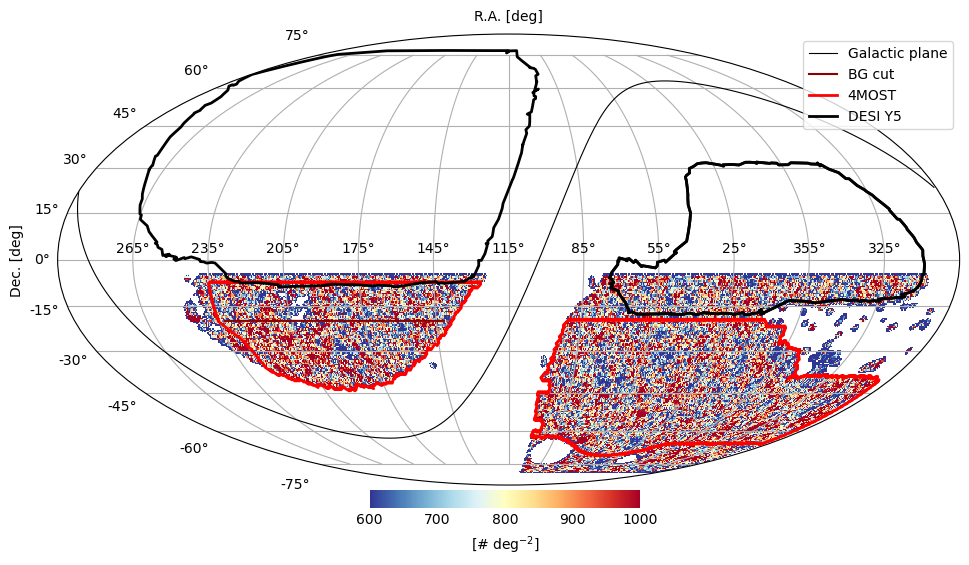

In [ ]:
hpmap = utils.create_hp_map(bgt['RA'], bgt['DEC'], nside=128)
#hpmap_ebv = utils.create_hp_map(lrg['RA'], lrg['DEC'], weight=lrg['EBV'], nside=128)

utils.plot_moll(hpmap, rot=115, min=600, max=1000, desi_footprint=True, fourmost_footprint=True)
#utils.plot_moll(hpmap, hpmap_ebv, rot=115, min=0, max=.2, desi_footprint=True, fourmost_footprint=True)

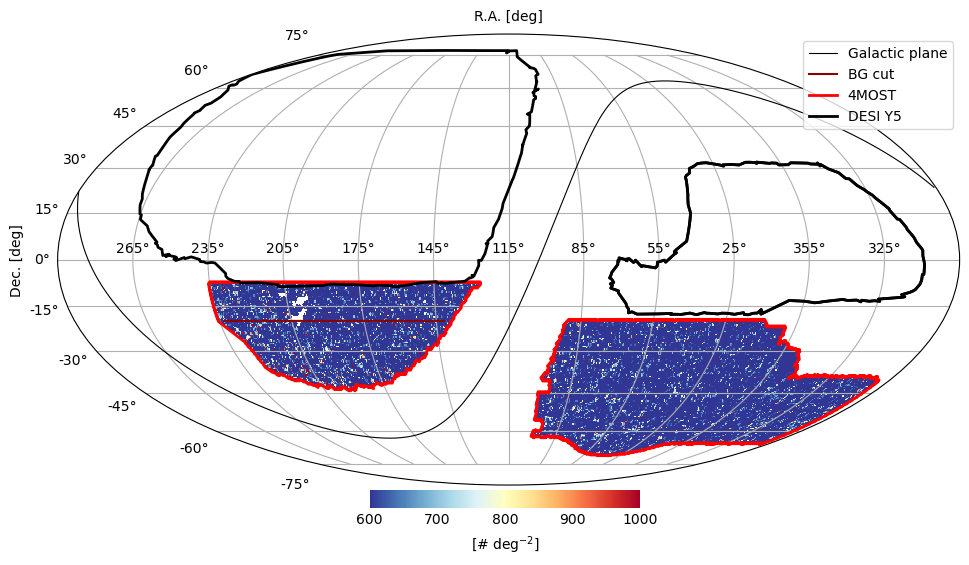

In [ ]:
hpmap = utils.create_hp_map(Catalog.concatenate(bg[mask], bg1[mask_lrg], intersection=True)['RA'], Catalog.concatenate(bg[mask], bg1[mask_lrg], intersection=True)['DEC'], nside=128)
#hpmap_ebv = utils.create_hp_map(lrg['RA'], lrg['DEC'], weight=lrg['EBV'], nside=128)

utils.plot_moll(hpmap, rot=115, min=600, max=1000, desi_footprint=True, fourmost_footprint=True)
#utils.plot_moll(hpmap, hpmap_ebv, rot=115, min=0, max=.2, desi_footprint=True, fourmost_footprint=True)

In [ ]:
files = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1/*.fits')
files_zp = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/*.fits')

In [ ]:
mag_g = 22.5-2.5*np.log10(bg['FLUX_G']/bg['MW_TRANSMISSION_G'])
mag_r = 22.5-2.5*np.log10(bg['FLUX_R']/bg['MW_TRANSMISSION_R'])
mag_z = 22.5-2.5*np.log10(bg['FLUX_Z']/bg['MW_TRANSMISSION_Z'])


/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/code/mpytools/main/lib/python3.10/site-packages/mpytools/core.py:544: RuntimeWarning: invalid value encountered in log10
  results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


In [ ]:
sel1 = (mag_r-mag_z < 0.9*(mag_g-mag_r)-0.2)


In [ ]:
sel1[bg['isfoots8']].sum()/5600, sel1[bg['isfoots8']].size/5600

(array(462.2291071428571), 828.915)

In [ ]:
(sel1 & (mag_r<20))[bg['isfoots8']].sum()/5600

array(462.2291071428571)

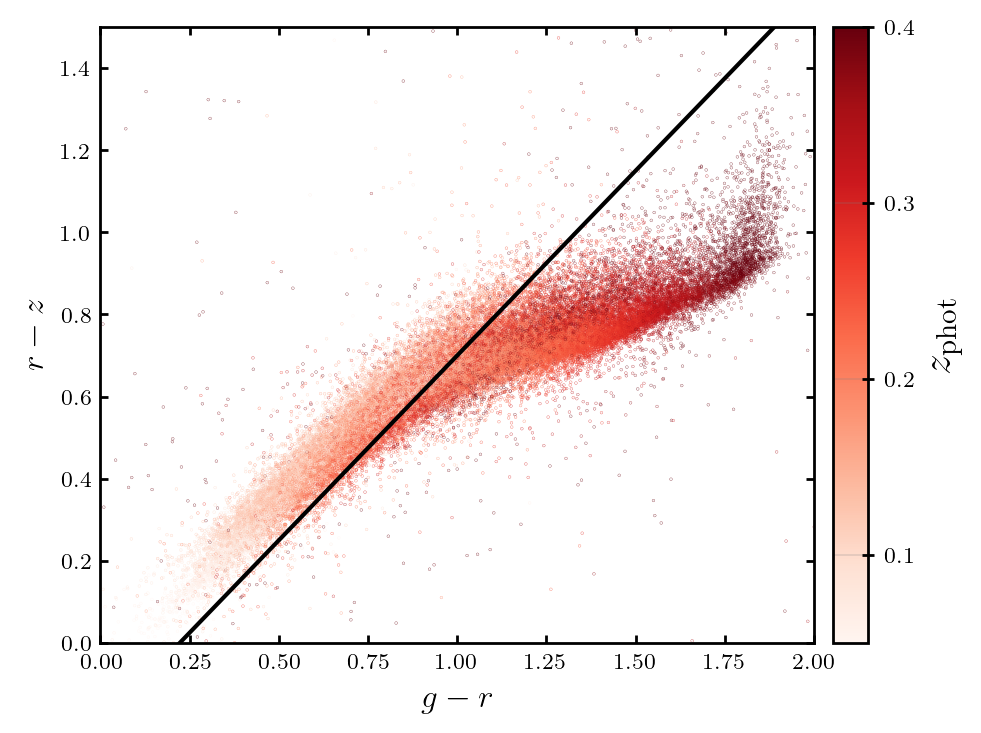

In [ ]:
plt.style.use('/global/homes/a/arocher/Code/plot_style.txt')
fig9 = plt.figure(constrained_layout=False, figsize=(4,4))
gs1 = fig9.add_gridspec(nrows=1, ncols=2, left=0.0,
                        hspace=0,
                        wspace=0.05, width_ratios=[1, .05])
f9_ax1 = fig9.add_subplot(gs1[0, 0])
tt = f9_ax1.scatter(mag_g[bg['isfoots8']][::i]-mag_r[bg['isfoots8']][::i], mag_r[bg['isfoots8']][::i]-mag_z[bg['isfoots8']][::i], cmap='Reds', vmin=0.05, vmax=0.4, c=bg['Z_PHOT_MEAN'][bg['isfoots8']][::i]
            , s=0.01)
f9_ax1.plot(np.linspace(0,2,100), 0.9*np.linspace(0,2,100)-0.2, c='k')

f9_ax1.tick_params(which='major', width=1.00, length=3, direction='in')
f9_ax1.set_yticks(np.arange(0.2, 1.5, 0.4), minor=True)
f9_ax1.set_xticks(np.arange(0, 2, 0.25), minor=True)
f9_ax1.yaxis.set_ticks_position('both')
f9_ax1.xaxis.set_ticks_position('both')

f9_ax1.set_xlabel(r'$g-r$', fontsize=12)
f9_ax1.set_ylabel(r'$r-z$', fontsize=12)
f9_ax1.set_ylim(-0,1.5)
f9_ax1.set_xlim(0,2)
f9_ax2 = fig9.add_subplot(gs1[0, 1])

cbar = fig9.colorbar(tt, cax=f9_ax2,  ticks=np.arange(0.1, .4, 0.1))
cbar.set_label(label=r'$z_\mathrm{phot}$', size=15)
f9_ax1.grid(False)
fig9.savefig('BG_color_sel.pdf', facecolor='w',  bbox_inches='tight', pad_inches=0.1)

In [ ]:
from mockfactory import Catalog
import utils
import numpy as np 
import sys
import glob 
from mpi4py import MPI
import mpytools as mpy
import time
import os 

mpicomm = MPI.COMM_WORLD
rank = mpicomm.Get_rank()

files = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1/*.fits')
files_zp = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/*.fits')
files.sort()
files_zp.sort()

#tar_bg_4most_old= Catalog(mpicomm=mpicomm)
#tar_bg_desi_bright= Catalog(mpicomm=mpicomm)
#tar_bg_4most_new215= Catalog(mpicomm=mpicomm)

for file, file_zp in zip(files, files_zp):
    ll = file.split('/')[-1]
    name_bg = '-'.join(['bg_r19', ll])
    name_lrg = '-'.join(['lrg', ll])
    
    if not os.path.exists(os.path.join('/pscratch/sd/a/arocher/4MOST/tmp/', name_lrg)):

        sweep_cat = Catalog.read(file, mpicomm=mpicomm)
        sweep_pz=Catalog.read(file_zp,  mpicomm=mpicomm)
        #mask_vista = sweep_cat['vista_ra'] != 0
        '''if mask_vista.sum() > 0:
            mag_r1 = 22.5-2.5*np.log10(sweep_cat['FLUX_R']/sweep_cat['MW_TRANSMISSION_R'])
            sel_bg = fourmost_get_bgnirsel(sweep_cat['vista_jab'][mask_vista], sweep_cat['vista_ksab'][mask_vista],sweep_cat['unwise_w1ab'][mask_vista], mag_r1[mask_vista], rmax=19.5)
            tar_bg_4most_old = Catalog.concatenate(tar_bg_4most_old, sweep_cat[sel_bg])'''

        for col in sweep_pz.columns():
            sweep_cat[col] = np.zeros(sweep_cat.size, dtype=sweep_pz[col].dtype)

        sweep_cat[sweep_pz.columns()] = sweep_pz
        sweep_cat['isfoots8'] = sweep_cat.ones() ==0

        sel_4most_new = utils.get_4most_bg_new_sel(sweep_cat, mag_r_lim=19)
        sel_4most_new_lrg = utils.get_4most_lrg_new_sel(sweep_cat, shift=0.11)

        if sel_4most_new.sum() > 0:
            mask_bg  = utils.get_4most_s8foot(sweep_cat[sel_4most_new]["RA"], sweep_cat[sel_4most_new]["DEC"], regions=['ngc', 'sgc'], if_deg=True, bg_fp=True, polygon_dir='/pscratch/sd/a/arocher/4MOST/mask_fp')
            sweep_cat[sel_4most_new]['isfoots8'] = mask_bg
            sweep_cat[sel_4most_new].write(os.path.join('/pscratch/sd/a/arocher/4MOST/tmp/', name_bg))

        sweep_cat['isfoots8'] = sweep_cat.ones() ==0
        if sel_4most_new_lrg.sum() > 0:
            mask_lrg  = utils.get_4most_s8foot(sweep_cat[sel_4most_new_lrg]["RA"], sweep_cat[sel_4most_new_lrg]["DEC"], regions=['ngc', 'sgc'], if_deg=True, bg_fp=False, polygon_dir='/pscratch/sd/a/arocher/4MOST/mask_fp')
            sweep_cat[sel_4most_new_lrg]['isfoots8'] = mask_lrg
            sweep_cat[sel_4most_new_lrg].write(os.path.join('/pscratch/sd/a/arocher/4MOST/tmp/', name_lrg))
    print(ll)
        #tar_bg_4most_new215 = Catalog.concatenate(tar_bg_4most_new215, sweep_cat[sel_4most_new215])
        #tar_bg_desi_bright = Catalog.concatenate(tar_bg_desi_bright, sweep_cat[sel_4most_new])
    

    


sweep-000m005-005p000.fits
sweep-000m010-005m005.fits
sweep-000m015-005m010.fits
sweep-000m020-005m015.fits
sweep-000m025-005m020.fits
sweep-000m030-005m025.fits
sweep-000m035-005m030.fits
sweep-000m040-005m035.fits
sweep-000m045-005m040.fits
sweep-000m050-005m045.fits
sweep-000m055-005m050.fits
sweep-000m060-005m055.fits
sweep-000m065-005m060.fits
sweep-000m070-005m065.fits
sweep-000m075-005m070.fits
sweep-000m080-005m075.fits
sweep-000m085-005m080.fits
sweep-000m090-005m085.fits
sweep-000p000-005p005.fits
sweep-000p005-005p010.fits
sweep-000p010-005p015.fits
sweep-000p015-005p020.fits
sweep-000p020-005p025.fits
sweep-000p025-005p030.fits
sweep-000p030-005p035.fits
sweep-005m005-010p000.fits
sweep-005m010-010m005.fits
sweep-005m015-010m010.fits
sweep-005m020-010m015.fits
sweep-005m025-010m020.fits
sweep-005m030-010m025.fits
sweep-005m035-010m030.fits
sweep-005m040-010m035.fits
sweep-005m045-010m040.fits
sweep-005m050-010m045.fits
sweep-005m055-010m050.fits
sweep-005m060-010m055.fits
s

/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/code/mpytools/main/lib/python3.10/site-packages/mpytools/core.py:542: RuntimeWarning: divide by zero encountered in log10
  results = super().__array_ufunc__(ufunc, method, *args, **kwargs)
/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/code/mpytools/main/lib/python3.10/site-packages/mpytools/core.py:542: RuntimeWarning: invalid value encountered in subtract
  results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


sweep-025m005-030p000.fits
sweep-025m010-030m005.fits
sweep-025m015-030m010.fits
sweep-025m020-030m015.fits
sweep-025m025-030m020.fits
sweep-025m030-030m025.fits
sweep-025m035-030m030.fits
sweep-025m040-030m035.fits
sweep-025m045-030m040.fits
sweep-025m050-030m045.fits
sweep-025m055-030m050.fits
sweep-025m060-030m055.fits
sweep-025m065-030m060.fits
sweep-025m070-030m065.fits
sweep-025m075-030m070.fits
sweep-025m080-030m075.fits
sweep-025m085-030m080.fits
sweep-025m090-030m085.fits
sweep-025p000-030p005.fits
sweep-025p005-030p010.fits
sweep-025p010-030p015.fits
sweep-025p015-030p020.fits
sweep-025p020-030p025.fits
sweep-025p025-030p030.fits
sweep-025p030-030p035.fits
sweep-030m005-035p000.fits
sweep-030m010-035m005.fits
sweep-030m015-035m010.fits
sweep-030m020-035m015.fits
sweep-030m025-035m020.fits
sweep-030m030-035m025.fits
sweep-030m035-035m030.fits
sweep-030m040-035m035.fits
sweep-030m045-035m040.fits
sweep-030m050-035m045.fits
sweep-030m055-035m050.fits
sweep-030m060-035m055.fits
s

/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/code/mpytools/main/lib/python3.10/site-packages/mpytools/core.py:542: RuntimeWarning: invalid value encountered in log10
  results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


sweep-050p005-055p010.fits
sweep-050p010-055p015.fits
sweep-050p020-055p025.fits
sweep-055m005-060p000.fits
sweep-055m010-060m005.fits
sweep-055m015-060m010.fits
sweep-055m020-060m015.fits
sweep-055m025-060m020.fits
sweep-055m030-060m025.fits
sweep-055m035-060m030.fits
sweep-055m040-060m035.fits
sweep-055m045-060m040.fits
sweep-055m050-060m045.fits
sweep-055m055-060m050.fits
sweep-055m060-060m055.fits
sweep-055m065-060m060.fits
sweep-055m070-060m065.fits
sweep-055m075-060m070.fits
sweep-055m080-060m075.fits
sweep-055m085-060m080.fits
sweep-055m090-060m085.fits
sweep-055p000-060p005.fits
sweep-055p005-060p010.fits
sweep-055p010-060p015.fits
sweep-055p015-060p020.fits
sweep-055p020-060p025.fits
sweep-060m005-065p000.fits
sweep-060m010-065m005.fits
sweep-060m015-065m010.fits
sweep-060m020-065m015.fits
sweep-060m025-065m020.fits
sweep-060m030-065m025.fits
sweep-060m035-065m030.fits
sweep-060m040-065m035.fits
sweep-060m045-065m040.fits
sweep-060m050-065m045.fits
sweep-060m055-065m050.fits
s

Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']


sweep-075m070-080m065.fits
sweep-075m075-080m070.fits
sweep-075m080-080m075.fits
sweep-075m085-080m080.fits
sweep-075m090-080m085.fits
sweep-075p000-080p005.fits
sweep-075p005-080p010.fits
sweep-080m005-085p000.fits
sweep-080m010-085m005.fits
sweep-080m015-085m010.fits
sweep-080m020-085m015.fits
sweep-080m025-085m020.fits
sweep-080m030-085m025.fits
sweep-080m035-085m030.fits
sweep-080m040-085m035.fits
sweep-080m045-085m040.fits
sweep-080m050-085m045.fits
sweep-080m055-085m050.fits
sweep-080m060-085m055.fits
sweep-080m065-085m060.fits
sweep-080m070-085m065.fits


Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']


sweep-080m075-085m070.fits
sweep-080m080-085m075.fits
sweep-080m085-085m080.fits
sweep-080m090-085m085.fits
sweep-080p000-085p005.fits
sweep-085m010-090m005.fits
sweep-085m015-090m010.fits
sweep-085m020-090m015.fits
sweep-085m025-090m020.fits
sweep-085m030-090m025.fits
sweep-085m035-090m030.fits
sweep-085m040-090m035.fits
sweep-085m045-090m040.fits
sweep-085m050-090m045.fits
sweep-085m055-090m050.fits
sweep-085m060-090m055.fits
sweep-085m065-090m060.fits
sweep-085m070-090m065.fits


Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']


KeyboardInterrupt: 

In [ ]:
lrg = Catalog.read('/pscratch/sd/a/arocher/4MOST/target_lrg_4most_v2.fits')


In [ ]:
lrg.ones(dtype=bool)

array([ True  True  True ...  True  True  True])

In [ ]:
files = glob.glob('/pscratch/sd/a/arocher/4MOST/target_lrg_4most_new_*.fits')
files.sort()
len(files)

2

In [ ]:
lrg = Catalog.read('/pscratch/sd/a/arocher/4MOST/target_lrg_4most_v2.fits')
bg = Catalog.read('/pscratch/sd/a/arocher/4MOST/target_bg_mag_r19_4most_v2.fits')
lrg_v1 = Catalog.read(glob.glob('/pscratch/sd/a/arocher/4MOST/target_lrg_4most_new_*.fits'))
bg_v1 = Catalog.read(glob.glob('/pscratch/sd/a/arocher/4MOST/target_bg_mag_r19_4most_new_*.fits'))


In [ ]:
glob.glob('/pscratch/sd/a/arocher/4MOST/target_bg*_4most_new_*.fits')

['/pscratch/sd/a/arocher/4MOST/target_bg_mag_r19_4most_new_sgc.fits',
 '/pscratch/sd/a/arocher/4MOST/target_bg_4most_new_ngc_mag_r21.5.fits',
 '/pscratch/sd/a/arocher/4MOST/target_bg_4most_new_sgc_mag_r21.5.fits',
 '/pscratch/sd/a/arocher/4MOST/target_bg_mag_r19_4most_new_ngc.fits']

In [ ]:
lrg_v1['ID'] = np.int64(lrg_v1['RELEASE']*1e11 + lrg_v1['BRICKID']*1e5 + lrg_v1['OBJID'])
bg_v1['ID'] = np.int64(bg_v1['RELEASE']*1e11 + bg_v1['BRICKID']*1e5 + bg_v1['OBJID'])
np.in1d(bg_v1['ID'][bg_v1['isfoots8']], lrg_v1['ID'][lrg_v1['isfoots8']]).sum()

67019

In [ ]:
mask = np.in1d(bg['ID'][bg['isfoots8']], lrg['ID'][lrg['isfoots8']])

In [ ]:
mask.sum()

67180

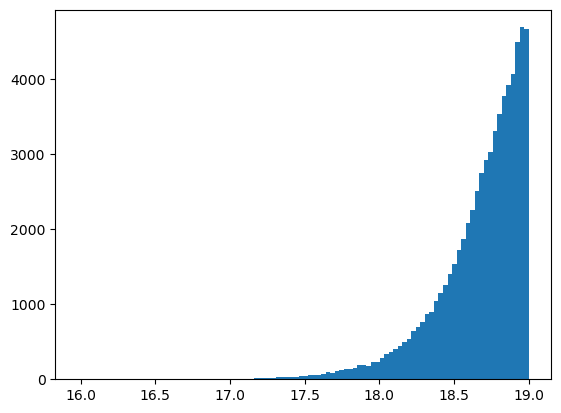

In [ ]:
plt.hist(mag_r[bg['isfoots8']][mask], bins=100)
plt.show()

In [ ]:
mag_r = 22.5-2.5*np.log10(bg['FLUX_R']/bg['MW_TRANSMISSION_R'])
mag_z = 22.5-2.5*np.log10(bg['FLUX_Z']/bg['MW_TRANSMISSION_Z'])    
mag_g = 22.5-2.5*np.log10(bg['FLUX_G']/bg['MW_TRANSMISSION_G'])

In [ ]:
67180/lrg['isfoots8'].sum(), 67180/bg['isfoots8'].sum()

(array(0.02418096780022302), array(0.04924996077890888))

In [ ]:
lrg_v1['ID'] = np.int64(lrg_v1['RELEASE']*1e11 + lrg_v1['BRICKID']*1e5 + lrg_v1['OBJID'])

In [ ]:
np.unique(lrg['ID']).size, lrg.size

(8228439, 8228439)

In [ ]:
tt1.write('/pscratch/sd/a/arocher/4MOST/target_lrg_4most_v2.fits')

In [ ]:
tt1

In [ ]:
mask_bg = utils.get_4most_s8foot(bg['RA'], bg['DEC'], bg_fp=True)

In [ ]:
lrg = Catalog.read('/pscratch/sd/a/arocher/4MOST/target_lrg_4most_v2.fits')

In [ ]:
lrg

Catalog(csize=7972891, size=7972891, columns=['RELEASE', 'BRICKID', 'BRICKNAME', 'OBJID', 'TYPE', 'RA', 'DEC', 'RA_IVAR', 'DEC_IVAR', 'DCHISQ', 'EBV', 'FLUX_G', 'FLUX_R', 'FLUX_I', 'FLUX_Z', 'FLUX_W1', 'FLUX_W2', 'FLUX_W3', 'FLUX_W4', 'FLUX_IVAR_G', 'FLUX_IVAR_R', 'FLUX_IVAR_I', 'FLUX_IVAR_Z', 'FLUX_IVAR_W1', 'FLUX_IVAR_W2', 'FLUX_IVAR_W3', 'FLUX_IVAR_W4', 'MW_TRANSMISSION_G', 'MW_TRANSMISSION_R', 'MW_TRANSMISSION_I', 'MW_TRANSMISSION_Z', 'MW_TRANSMISSION_W1', 'MW_TRANSMISSION_W2', 'MW_TRANSMISSION_W3', 'MW_TRANSMISSION_W4', 'NOBS_G', 'NOBS_R', 'NOBS_I', 'NOBS_Z', 'NOBS_W1', 'NOBS_W2', 'NOBS_W3', 'NOBS_W4', 'RCHISQ_G', 'RCHISQ_R', 'RCHISQ_I', 'RCHISQ_Z', 'RCHISQ_W1', 'RCHISQ_W2', 'RCHISQ_W3', 'RCHISQ_W4', 'FRACFLUX_G', 'FRACFLUX_R', 'FRACFLUX_I', 'FRACFLUX_Z', 'FRACFLUX_W1', 'FRACFLUX_W2', 'FRACFLUX_W3', 'FRACFLUX_W4', 'FRACMASKED_G', 'FRACMASKED_R', 'FRACMASKED_I', 'FRACMASKED_Z', 'FRACIN_G', 'FRACIN_R', 'FRACIN_I', 'FRACIN_Z', 'ANYMASK_G', 'ANYMASK_R', 'ANYMASK_I', 'ANYMASK_Z', 'ALLM

In [ ]:
lrg = Catalog.read(glob.glob('/pscratch/sd/a/arocher/4MOST/target_desi_bright_bgs.fits'))

In [ ]:
lrg

Catalog(csize=7930765, size=7930765, columns=['RELEASE', 'BRICKID', 'BRICKNAME', 'OBJID', 'TYPE', 'RA', 'DEC', 'RA_IVAR', 'DEC_IVAR', 'DCHISQ', 'EBV', 'FLUX_G', 'FLUX_R', 'FLUX_I', 'FLUX_Z', 'FLUX_W1', 'FLUX_W2', 'FLUX_W3', 'FLUX_W4', 'FLUX_IVAR_G', 'FLUX_IVAR_R', 'FLUX_IVAR_I', 'FLUX_IVAR_Z', 'FLUX_IVAR_W1', 'FLUX_IVAR_W2', 'FLUX_IVAR_W3', 'FLUX_IVAR_W4', 'MW_TRANSMISSION_G', 'MW_TRANSMISSION_R', 'MW_TRANSMISSION_I', 'MW_TRANSMISSION_Z', 'MW_TRANSMISSION_W1', 'MW_TRANSMISSION_W2', 'MW_TRANSMISSION_W3', 'MW_TRANSMISSION_W4', 'NOBS_G', 'NOBS_R', 'NOBS_I', 'NOBS_Z', 'NOBS_W1', 'NOBS_W2', 'NOBS_W3', 'NOBS_W4', 'RCHISQ_G', 'RCHISQ_R', 'RCHISQ_I', 'RCHISQ_Z', 'RCHISQ_W1', 'RCHISQ_W2', 'RCHISQ_W3', 'RCHISQ_W4', 'FRACFLUX_G', 'FRACFLUX_R', 'FRACFLUX_I', 'FRACFLUX_Z', 'FRACFLUX_W1', 'FRACFLUX_W2', 'FRACFLUX_W3', 'FRACFLUX_W4', 'FRACMASKED_G', 'FRACMASKED_R', 'FRACMASKED_I', 'FRACMASKED_Z', 'FRACIN_G', 'FRACIN_R', 'FRACIN_I', 'FRACIN_Z', 'ANYMASK_G', 'ANYMASK_R', 'ANYMASK_I', 'ANYMASK_Z', 'ALLM

In [ ]:
mask = utils.get_4most_s8foot(lrg['RA'], lrg['DEC'], bg_fp=True)


lrg['isfoots8'] = mask

sel = ~(lrg['MASKBITS'] & 2**1 > 0) 
sel &= ~(lrg['MASKBITS'] & 2**12 > 0)
sel &= ~(lrg['MASKBITS'] & 2**13 > 0)

lrg = lrg[sel]

In [ ]:
sel.sum(), lrg.size

(array(7930765), 7930765)

In [ ]:
lrg.write('/pscratch/sd/a/arocher/4MOST/target_desi_bright_bgs.fits')

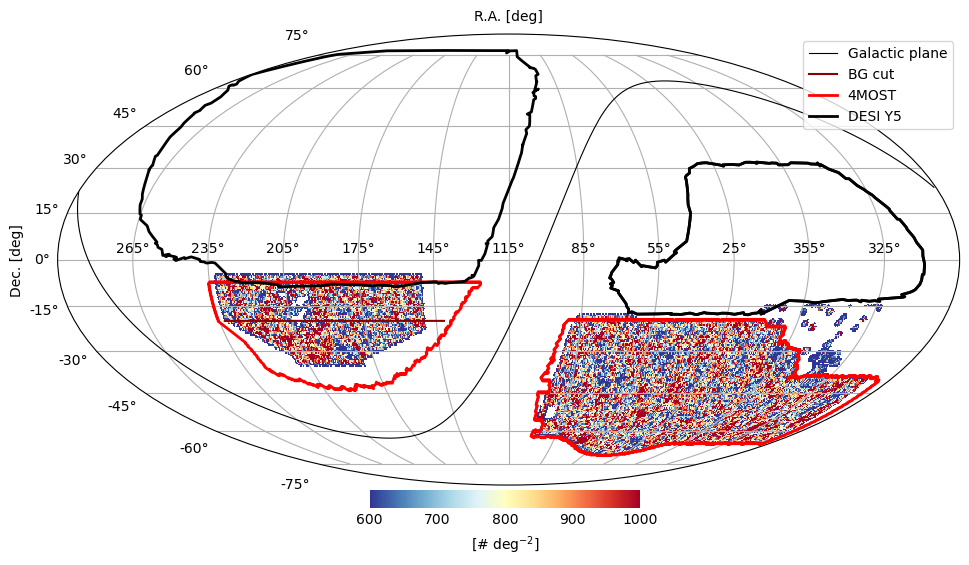

In [ ]:
hpmap = utils.create_hp_map(lrg['RA'][lrg['isfoots8']], lrg['DEC'][lrg['isfoots8']], nside=128)
#hpmap_ebv = utils.create_hp_map(lrg['RA'], lrg['DEC'], weight=lrg['EBV'], nside=128)

utils.plot_moll(hpmap, rot=115, min=600, max=1000, desi_footprint=True, fourmost_footprint=True)
#utils.plot_moll(hpmap, hpmap_ebv, rot=115, min=0, max=.2, desi_footprint=True, fourmost_footprint=True)

In [ ]:
lrg['isfoots8'].sum()/6929.915823148822

array(400.9021279478732)

In [ ]:
def get_desi_bright_bgs_sel(cat, mag_r_lim=19.5):
    
    not_in_gaia = cat['REF_CAT'] == '  '
    raw_mag_r = 22.5-2.5*np.log10(cat['FLUX_R'])
    mag_r = 22.5-2.5*np.log10(cat['FLUX_R']/cat['MW_TRANSMISSION_R'])

    mag_z = 22.5-2.5*np.log10(cat['FLUX_Z']/cat['MW_TRANSMISSION_Z'])
    sel = ((cat['GAIA_PHOT_G_MEAN_MAG'] - raw_mag_r) > 0.6) & ~not_in_gaia
    sel |= not_in_gaia

    #maskbit arround bright stars
    sel = ~(cat['MASKBITS'] & 2**1 > 0) 
    sel &= ~(cat['MASKBITS'] & 2**12 > 0)
    sel &= ~(cat['MASKBITS'] & 2**13 > 0)
        #fiber mag cut
    fib_mag_r = 22.5-2.5*np.log10(cat['FIBERFLUX_R']/cat['MW_TRANSMISSION_R'])
    mask = mag_r < 17.8
    mask &= fib_mag_r < (22.9 + (mag_r - 17.8))
    mask1 = (mag_r > 17.8) & (mag_r < 20)
    mask1 &= fib_mag_r < 22.9
    sel &= (mask|mask1)

    # cut spurious objects
    mag_g = 22.5-2.5*np.log10(cat['FLUX_G']/cat['MW_TRANSMISSION_G'])
    mask = (mag_g-mag_r < -1) | (mag_g-mag_r > 4)
    mask |= (mag_r-mag_z < -1) | (mag_r-mag_z > 4)
    sel &= ~mask

    # cut according Nobs
    mask = (cat['NOBS_G'] == 0) | (cat['NOBS_R'] == 0) | (cat['NOBS_Z'] == 0)
    sel &= ~mask

    # fibertot mag cut
    fibtot_mag_r = 22.5-2.5*np.log10(cat['FIBERTOTFLUX_R']/cat['MW_TRANSMISSION_R'])
    mask = (mag_r > 12) & (fibtot_mag_r < 15) 
    sel &= ~mask

    sel &= mag_r < mag_r_lim
    return sel	

In [ ]:
file = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1/sweep-090m055-095m050.fits')
file_zp = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-090m055-095m050.fits')


sweep_cat = Catalog.read(file)
sweep_pz=Catalog.read(file_zp)
#mask_vista = sweep_cat['vista_ra'] != 0
'''if mask_vista.sum() > 0:
    mag_r1 = 22.5-2.5*np.log10(sweep_cat['FLUX_R']/sweep_cat['MW_TRANSMISSION_R'])
    sel_bg = fourmost_get_bgnirsel(sweep_cat['vista_jab'][mask_vista], sweep_cat['vista_ksab'][mask_vista],sweep_cat['unwise_w1ab'][mask_vista], mag_r1[mask_vista], rmax=19.5)
    tar_bg_4most_old = Catalog.concatenate(tar_bg_4most_old, sweep_cat[sel_bg])'''

for col in sweep_pz.columns():
    sweep_cat[col] = np.zeros(sweep_cat.size, dtype=sweep_pz[col].dtype)

sweep_cat[sweep_pz.columns()] = sweep_pz
sweep_cat['isfoots8'] = sweep_cat.ones(dtype=bool)

sel_4most_new = get_desi_bright_bgs_sel(sweep_cat, mag_r_lim=19.5)

In [ ]:
sweep_cat[sel_4most_new]

Catalog(csize=12476, size=12476, columns=['RELEASE', 'BRICKID', 'BRICKNAME', 'OBJID', 'TYPE', 'RA', 'DEC', 'RA_IVAR', 'DEC_IVAR', 'DCHISQ', 'EBV', 'FLUX_G', 'FLUX_R', 'FLUX_I', 'FLUX_Z', 'FLUX_W1', 'FLUX_W2', 'FLUX_W3', 'FLUX_W4', 'FLUX_IVAR_G', 'FLUX_IVAR_R', 'FLUX_IVAR_I', 'FLUX_IVAR_Z', 'FLUX_IVAR_W1', 'FLUX_IVAR_W2', 'FLUX_IVAR_W3', 'FLUX_IVAR_W4', 'MW_TRANSMISSION_G', 'MW_TRANSMISSION_R', 'MW_TRANSMISSION_I', 'MW_TRANSMISSION_Z', 'MW_TRANSMISSION_W1', 'MW_TRANSMISSION_W2', 'MW_TRANSMISSION_W3', 'MW_TRANSMISSION_W4', 'NOBS_G', 'NOBS_R', 'NOBS_I', 'NOBS_Z', 'NOBS_W1', 'NOBS_W2', 'NOBS_W3', 'NOBS_W4', 'RCHISQ_G', 'RCHISQ_R', 'RCHISQ_I', 'RCHISQ_Z', 'RCHISQ_W1', 'RCHISQ_W2', 'RCHISQ_W3', 'RCHISQ_W4', 'FRACFLUX_G', 'FRACFLUX_R', 'FRACFLUX_I', 'FRACFLUX_Z', 'FRACFLUX_W1', 'FRACFLUX_W2', 'FRACFLUX_W3', 'FRACFLUX_W4', 'FRACMASKED_G', 'FRACMASKED_R', 'FRACMASKED_I', 'FRACMASKED_Z', 'FRACIN_G', 'FRACIN_R', 'FRACIN_I', 'FRACIN_Z', 'ANYMASK_G', 'ANYMASK_R', 'ANYMASK_I', 'ANYMASK_Z', 'ALLMASK_

In [ ]:
mask = get_desi_bright_bgs_sel(tt)

/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/code/mpytools/main/lib/python3.10/site-packages/mpytools/core.py:544: RuntimeWarning: divide by zero encountered in log10
  results = super().__array_ufunc__(ufunc, method, *args, **kwargs)
/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/code/mpytools/main/lib/python3.10/site-packages/mpytools/core.py:544: RuntimeWarning: invalid value encountered in log10
  results = super().__array_ufunc__(ufunc, method, *args, **kwargs)
/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/code/mpytools/main/lib/python3.10/site-packages/mpytools/core.py:544: RuntimeWarning: invalid value encountered in subtract
  results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


In [ ]:
lrg['isfoots8']

array([False False False ...  True  True  True])

In [ ]:
tt['isfoots8'] = tt.ones(dtype=bool)

In [ ]:
tt1['isfoots8']

KeyError: 'Column isfoots8 does not exist'

In [ ]:
tt1

Catalog(csize=12476, size=12476, columns=['RELEASE', 'BRICKID', 'BRICKNAME', 'OBJID', 'TYPE', 'RA', 'DEC', 'RA_IVAR', 'DEC_IVAR', 'DCHISQ', 'EBV', 'FLUX_G', 'FLUX_R', 'FLUX_I', 'FLUX_Z', 'FLUX_W1', 'FLUX_W2', 'FLUX_W3', 'FLUX_W4', 'FLUX_IVAR_G', 'FLUX_IVAR_R', 'FLUX_IVAR_I', 'FLUX_IVAR_Z', 'FLUX_IVAR_W1', 'FLUX_IVAR_W2', 'FLUX_IVAR_W3', 'FLUX_IVAR_W4', 'MW_TRANSMISSION_G', 'MW_TRANSMISSION_R', 'MW_TRANSMISSION_I', 'MW_TRANSMISSION_Z', 'MW_TRANSMISSION_W1', 'MW_TRANSMISSION_W2', 'MW_TRANSMISSION_W3', 'MW_TRANSMISSION_W4', 'NOBS_G', 'NOBS_R', 'NOBS_I', 'NOBS_Z', 'NOBS_W1', 'NOBS_W2', 'NOBS_W3', 'NOBS_W4', 'RCHISQ_G', 'RCHISQ_R', 'RCHISQ_I', 'RCHISQ_Z', 'RCHISQ_W1', 'RCHISQ_W2', 'RCHISQ_W3', 'RCHISQ_W4', 'FRACFLUX_G', 'FRACFLUX_R', 'FRACFLUX_I', 'FRACFLUX_Z', 'FRACFLUX_W1', 'FRACFLUX_W2', 'FRACFLUX_W3', 'FRACFLUX_W4', 'FRACMASKED_G', 'FRACMASKED_R', 'FRACMASKED_I', 'FRACMASKED_Z', 'FRACIN_G', 'FRACIN_R', 'FRACIN_I', 'FRACIN_Z', 'ANYMASK_G', 'ANYMASK_R', 'ANYMASK_I', 'ANYMASK_Z', 'ALLMASK_

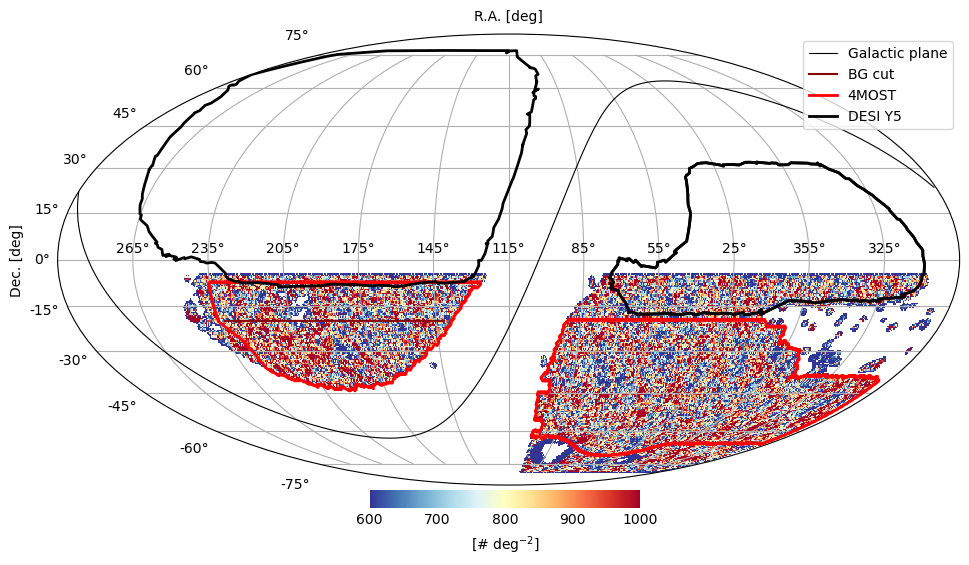

In [ ]:
#tt1 = Catalog.concatenate(lrg, sweep_cat[sel_4most_new], intersection=True)

hpmap = utils.create_hp_map(tt1['RA'], tt1['DEC'], nside=128)
#hpmap_ebv = utils.create_hp_map(lrg['RA'], lrg['DEC'], weight=lrg['EBV'], nside=128)

utils.plot_moll(hpmap, rot=115, min=600, max=1000, desi_footprint=True, fourmost_footprint=True)
#utils.plot_moll(hpmap, hpmap_ebv, rot=115, min=0, max=.2, desi_footprint=True, fourmost_footprint=True)

In [ ]:
tt1.write('/pscratch/sd/a/arocher/4MOST/target_desi_bright_bgs.fits')

ValueError: could not broadcast input array from shape (7972891,) into shape (7985367,)

In [ ]:
pix_area = 41253/hpmap.size

In [ ]:
bg['RA'][mask_bg& (bg['RA']>270)].min()

array(299.21666789665477)

In [ ]:
a,b = np.histogram(bg['EBV'], bins= 10, range=(0,0.2))

In [ ]:
a

array([ 762687, 1508778,  974332,  599409,  356173,  191467,  113879,
         73900,   46860,   29979])

In [ ]:
0.5*(b[-2]+b[1:])

array([0.04987278, 0.1480252 , 0.24617763, 0.34433007, 0.44248247,
       0.54063493, 0.6387873 , 0.7369398 , 0.8350922 , 0.9332446 ,
       1.0313971 , 1.1295495 , 1.2277019 , 1.3258543 , 1.4240067 ,
       1.5221592 , 1.6203116 , 1.718464  , 1.8166165 , 1.9147689 ,
       2.0129213 , 2.111074  , 2.2092261 , 2.3073788 , 2.405531  ],
      dtype=float32)

In [ ]:
mask_ebv = (bg['EBV'] <b[-1]) & (bg['EBV'] >b[-2])

In [ ]:
tt = Catalog.read(glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1/*.fits')[:360])

In [ ]:
import glob 
import os

files = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1/*.fits')
files_zp = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/*.fits')
files.sort()
files_zp.sort()
nb_file = int(len(files)/8)+1
ii=6
jj = 0
start = time.time()

for file, file_zp in zip(files[nb_file*ii:nb_file*ii+nb_file], files_zp[nb_file*ii:nb_file*ii+nb_file]):
    if os.path.exists(f'/pscratch/sd/a/arocher/4MOST/tmp/target_lrg_v2_{jj}_{ii}.fits'):
        pass
    else:
        sweep_cat = Catalog.read(file)
        sweep_pz=Catalog.read(file_zp)
        #mask_vista = sweep_cat['vista_ra'] != 0
        '''if mask_vista.sum() > 0:
            mag_r1 = 22.5-2.5*np.log10(sweep_cat['FLUX_R']/sweep_cat['MW_TRANSMISSION_R'])
            sel_bg = fourmost_get_bgnirsel(sweep_cat['vista_jab'][mask_vista], sweep_cat['vista_ksab'][mask_vista],sweep_cat['unwise_w1ab'][mask_vista], mag_r1[mask_vista], rmax=19.5)
            tar_bg_4most_old = Catalog.concatenate(tar_bg_4most_old, sweep_cat[sel_bg])'''

        for col in sweep_pz.columns():
            sweep_cat[col] = np.zeros(sweep_cat.size, dtype=sweep_pz[col].dtype)

        sweep_cat[sweep_pz.columns()] = sweep_pz
        sweep_cat['isfoots8'] = sweep_cat.ones() == 0

        sel_4most_new = utils.get_4most_bg_new_sel(sweep_cat, mag_r_lim=19)
        sel_4most_new_lrg = utils.get_4most_lrg_new_sel(sweep_cat, shift=0.11)

        if sel_4most_new.sum() > 0:
            mask_bg  = utils.get_4most_s8foot(sweep_cat[sel_4most_new]["RA"], sweep_cat[sel_4most_new]["DEC"], regions=['ngc', 'sgc'], if_deg=True, bg_fp=True, polygon_dir='/pscratch/sd/a/arocher/4MOST/mask_fp')
            sweep_cat[sel_4most_new]['isfoots8'] = mask_bg
            sweep_cat[sel_4most_new].write(f'/pscratch/sd/a/arocher/4MOST/tmp/target_bg_mag_r19_v2_{jj}_{ii}.fits')

        if sel_4most_new_lrg.sum() > 0:
            mask_lrg  = utils.get_4most_s8foot(sweep_cat[sel_4most_new_lrg]["RA"], sweep_cat[sel_4most_new_lrg]["DEC"], regions=['ngc', 'sgc'], if_deg=True, bg_fp=False, polygon_dir='/pscratch/sd/a/arocher/4MOST/mask_fp')
            sweep_cat[sel_4most_new_lrg]['isfoots8'] = mask_lrg
            sweep_cat[sel_4most_new_lrg].write(f'/pscratch/sd/a/arocher/4MOST/tmp/target_lrg_v2_{jj}_{ii}.fits')


        
    print(jj)
    jj += 1

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179


In [ ]:
1+1

2

In [ ]:
import glob 
import os

files = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1/*.fits')
files_zp = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/*.fits')
files.sort()
files_zp.sort()
nb_file = int(len(files)/8)+1

jj = 0
start = time.time()
for ii in range(8):
    for file, file_zp in zip(files[nb_file*ii:nb_file*ii+nb_file], files_zp[nb_file*ii:nb_file*ii+nb_file]):
        if os.path.exists(f'/pscratch/sd/a/arocher/4MOST/tmp/target_lrg_v2_{jj}_{ii}.fits'):
            pass
        else:
            sweep_cat = Catalog.read(file)
            sweep_pz=Catalog.read(file_zp)
            #mask_vista = sweep_cat['vista_ra'] != 0
            '''if mask_vista.sum() > 0:
                mag_r1 = 22.5-2.5*np.log10(sweep_cat['FLUX_R']/sweep_cat['MW_TRANSMISSION_R'])
                sel_bg = fourmost_get_bgnirsel(sweep_cat['vista_jab'][mask_vista], sweep_cat['vista_ksab'][mask_vista],sweep_cat['unwise_w1ab'][mask_vista], mag_r1[mask_vista], rmax=19.5)
                tar_bg_4most_old = Catalog.concatenate(tar_bg_4most_old, sweep_cat[sel_bg])'''

            for col in sweep_pz.columns():
                sweep_cat[col] = np.zeros(sweep_cat.size, dtype=sweep_pz[col].dtype)

            sweep_cat[sweep_pz.columns()] = sweep_pz
            sweep_cat['isfoots8'] = sweep_cat.ones()

            sel_4most_new = utils.get_4most_bg_new_sel(sweep_cat, mag_r_lim=19)
            sel_4most_new_lrg = utils.get_4most_lrg_new_sel(sweep_cat, shift=0.11)

            if sel_4most_new.sum() > 0:
                mask_bg  = utils.get_4most_s8foot(sweep_cat[sel_4most_new]["RA"], sweep_cat[sel_4most_new]["DEC"], regions=['ngc', 'sgc'], if_deg=True, bg_fp=True, polygon_dir='/pscratch/sd/a/arocher/4MOST/mask_fp')
                sweep_cat[sel_4most_new]['isfoots8'] = mask_bg
                tar_bg_4most_new = Catalog.concatenate(tar_bg_4most_new, sweep_cat[sel_4most_new])

            if sel_4most_new_lrg.sum() > 0:
                mask_lrg  = utils.get_4most_s8foot(sweep_cat[sel_4most_new_lrg]["RA"], sweep_cat[sel_4most_new_lrg]["DEC"], regions=['ngc', 'sgc'], if_deg=True, bg_fp=False, polygon_dir='/pscratch/sd/a/arocher/4MOST/mask_fp')
                sweep_cat[sel_4most_new_lrg]['isfoots8'] = mask_lrg
                tar_lrg_4most_new = Catalog.concatenate(tar_lrg_4most_new, sweep_cat[sel_4most_new_lrg])

            #tar_bg_4most_new215 = Catalog.concatenate(tar_bg_4most_new215, sweep_cat[sel_4most_new215])
            #tar_bg_desi_bright = Catalog.concatenate(tar_bg_desi_bright, sweep_cat[sel_4most_new])
            tar_bg_4most_new.write(f'/pscratch/sd/a/arocher/4MOST/tmp/target_bg_mag_r19_v2_{jj}_{ii}.fits')
            tar_lrg_4most_new.write(f'/pscratch/sd/a/arocher/4MOST/tmp/target_lrg_v2_{jj}_{ii}.fits')
        print(ii, jj)
        jj += 1
        

KeyboardInterrupt: 

In [ ]:
os.path.exists(f'/pscratch/sd/a/arocher/4MOST/tmp/target_lrg_v2_{jj}_{ii}.fits')

True

In [ ]:
tar_bg_4most_new.write(f'/pscratch/sd/a/arocher/4MOST/tmp/target_bg_mag_r19_v2_{jj}_{ii}.fits')
tar_lrg_4most_new.write(f'/pscratch/sd/a/arocher/4MOST/tmp/target_lrg_v2_{jj}_{ii}.fits')

In [ ]:
files_zp[nb_file*ii:nb_file*ii+nb_file]

['/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-075m040-080m035-pz.fits',
 '/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-075m045-080m040-pz.fits',
 '/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-075m050-080m045-pz.fits',
 '/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-075m055-080m050-pz.fits',
 '/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-075m060-080m055-pz.fits',
 '/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-075m065-080m060-pz.fits',
 '/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-075m070-080m065-pz.fits',
 '/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-075m075-080m070-pz.fits',
 '/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-075m080-080m075-pz.fits',
 '/global/cfs/cdirs/cosmo/data/legacysurvey/dr

In [ ]:
import time 

start = time.time()
tar_bg_4most_new = Catalog()
tar_lrg_4most_new = Catalog()
sweep_cat = Catalog.read('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1/sweep-075m070-080m065.fits')
sweep_pz=Catalog.read('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/sweep-075m070-080m065-pz.fits')
#mask_vista = sweep_cat['vista_ra'] != 0
'''if mask_vista.sum() > 0:
    mag_r1 = 22.5-2.5*np.log10(sweep_cat['FLUX_R']/sweep_cat['MW_TRANSMISSION_R'])
    sel_bg = fourmost_get_bgnirsel(sweep_cat['vista_jab'][mask_vista], sweep_cat['vista_ksab'][mask_vista],sweep_cat['unwise_w1ab'][mask_vista], mag_r1[mask_vista], rmax=19.5)
    tar_bg_4most_old = Catalog.concatenate(tar_bg_4most_old, sweep_cat[sel_bg])'''

for col in sweep_pz.columns():
    sweep_cat[col] = np.zeros(sweep_cat.size, dtype=sweep_pz[col].dtype)
print('time1', time.time()-start, flush=True)
sweep_cat[sweep_pz.columns()] = sweep_pz
print('time2', time.time()-start, flush=True)
sel_4most_new = utils.get_4most_bg_new_sel(sweep_cat, mag_r_lim=19)
sel_4most_new_lrg = utils.get_4most_lrg_new_sel(sweep_cat, shift=0.11)
print('time3', time.time()-start, flush=True)
#sel_4most_new215 = get_modifed_desi_bgs_sel(sweep_cat, mag_r_lim=21.5)
#sel_desi_bright_bg = get_desi_bright_bgs_sel(sweep_cat)
sweep_cat['isfoots8'] = sweep_cat.ones()
mask_lrg  = utils.get_4most_s8foot(sweep_cat[sel_4most_new_lrg]["RA"], sweep_cat[sel_4most_new_lrg]["DEC"], regions=['ngc', 'sgc'], if_deg=True, bg_fp=False, polygon_dir='/pscratch/sd/a/arocher/4MOST/mask_fp')
print('time3', time.time()-start, flush=True)
mask_bg  = utils.get_4most_s8foot(sweep_cat[sel_4most_new]["RA"], sweep_cat[sel_4most_new]["DEC"], regions=['ngc', 'sgc'], if_deg=True, bg_fp=True, polygon_dir='/pscratch/sd/a/arocher/4MOST/mask_fp')
print('time4', time.time()-start, flush=True)
sweep_cat[sel_4most_new_lrg]['isfoots8'] = mask_lrg
sweep_cat[sel_4most_new]['isfoots8'] = mask_bg
print('time5', time.time()-start, flush=True)
tar_bg_4most_new = Catalog.concatenate(tar_bg_4most_new, sweep_cat[sel_4most_new])
tar_lrg_4most_new = Catalog.concatenate(tar_lrg_4most_new, sweep_cat[sel_4most_new_lrg])

#tar_bg_4most_new215 = Catalog.concatenate(tar_bg_4most_new215, sweep_cat[sel_4most_new215])
#tar_bg_desi_bright = Catalog.concatenate(tar_bg_desi_bright, sweep_cat[sel_4most_new])
print('time6', time.time()-start, flush=True)

time1 3.804565668106079
time2 3.805774688720703


/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/code/mpytools/main/lib/python3.10/site-packages/mpytools/core.py:542: RuntimeWarning: divide by zero encountered in log10
  results = super().__array_ufunc__(ufunc, method, *args, **kwargs)
/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/code/mpytools/main/lib/python3.10/site-packages/mpytools/core.py:542: RuntimeWarning: invalid value encountered in log10
  results = super().__array_ufunc__(ufunc, method, *args, **kwargs)
/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/code/mpytools/main/lib/python3.10/site-packages/mpytools/core.py:542: RuntimeWarning: invalid value encountered in subtract
  results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


time3 20.146568059921265
time3 20.21231985092163
time4 20.257858514785767
time5 20.260634422302246
time6 20.263509035110474


In [ ]:
files = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1/*.fits')
files_zp = glob.glob('/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/south/sweep/10.1-photo-z/*.fits')
files.sort()
files_zp.sort()
nb_file = int(len(files)/8)+1

In [ ]:
len(glob.glob('/pscratch/sd/a/arocher/4MOST/tmp/*lrg*'))

505

In [ ]:
sel_4most_new_lrg.sum(), sel_4most_new.sum()

(array(9660), array(4934))

In [ ]:
sweep_cat = Catalog.read(file, mpicomm=mpicomm)
    sweep_pz=Catalog.read(file_zp,  mpicomm=mpicomm)
    #mask_vista = sweep_cat['vista_ra'] != 0
    '''if mask_vista.sum() > 0:
        mag_r1 = 22.5-2.5*np.log10(sweep_cat['FLUX_R']/sweep_cat['MW_TRANSMISSION_R'])
        sel_bg = fourmost_get_bgnirsel(sweep_cat['vista_jab'][mask_vista], sweep_cat['vista_ksab'][mask_vista],sweep_cat['unwise_w1ab'][mask_vista], mag_r1[mask_vista], rmax=19.5)
        tar_bg_4most_old = Catalog.concatenate(tar_bg_4most_old, sweep_cat[sel_bg])'''

    for col in sweep_pz.columns():
        sweep_cat[col] = np.zeros(sweep_cat.size, dtype=sweep_pz[col].dtype)

    sweep_cat[sweep_pz.columns()] = sweep_pz
    sweep_cat['isfoots8'] = sweep_cat.ones()
    
    sel_4most_new = utils.get_4most_bg_new_sel(sweep_cat, mag_r_lim=19)
    sel_4most_new_lrg = utils.get_4most_lrg_new_sel(sweep_cat, shift=0.11)
    
    if sel_4most_new.sum() > 0:
        mask_bg  = utils.get_4most_s8foot(sweep_cat[sel_4most_new]["RA"], sweep_cat[sel_4most_new]["DEC"], regions=['ngc', 'sgc'], if_deg=True, bg_fp=True, polygon_dir='/pscratch/sd/a/arocher/4MOST/mask_fp')
        sweep_cat[sel_4most_new]['isfoots8'] = mask_bg
        tar_bg_4most_new = Catalog.concatenate(tar_bg_4most_new, sweep_cat[sel_4most_new])

    if sel_4most_new_lrg.sum() > 0:
        mask_lrg  = utils.get_4most_s8foot(sweep_cat[sel_4most_new_lrg]["RA"], sweep_cat[sel_4most_new_lrg]["DEC"], regions=['ngc', 'sgc'], if_deg=True, bg_fp=False, polygon_dir='/pscratch/sd/a/arocher/4MOST/mask_fp')
        sweep_cat[sel_4most_new_lrg]['isfoots8'] = mask_lrg
        tar_lrg_4most_new = Catalog.concatenate(tar_lrg_4most_new, tar_lrg_4most_new[sel_4most_new_lrg])

CPU times: user 1.38 s, sys: 3.63 s, total: 5.01 s
Wall time: 5.03 s


In [ ]:
def get_4most_lrg_new_sel(data, shift = 0.17): #shift = 0.0825

    gflux = data['FLUX_G']
    gMW = data['MW_TRANSMISSION_G']
    gmag = 22.5 - 2.5*np.log10(gflux/gMW)

    rflux = data['FLUX_R']
    rMW = data['MW_TRANSMISSION_R']
    rmag = 22.5 - 2.5*np.log10(rflux/rMW)

    zflux = data['FLUX_Z']
    zMW = data['MW_TRANSMISSION_Z']
    zmag = 22.5 - 2.5*np.log10(zflux/zMW)

    w1flux = data['FLUX_W1']
    w1MW = data['MW_TRANSMISSION_W1']
    w1mag = 22.5 - 2.5*np.log10(w1flux/w1MW)

    fiberz_flux = data['FIBERFLUX_Z']
    fiberz = 22.5 - 2.5*np.log10(fiberz_flux/zMW)

    alpha_new = 1.8
    beta_new = 17.14 - shift
    gamma_new = 16.33 - 1.5*shift

    mask_tot_ls = fiberz < 21.6
    mask_tot_ls &= (zmag - w1mag) > 0.8*(rmag - zmag) - 0.6
    mask_tot_ls &= ((gmag - w1mag) > 2.9) | ((rmag - w1mag) > 1.8)  # pq 2.97 et pas 2.9
    mask_tot_ls &= (rmag - w1mag > alpha_new*(w1mag - beta_new)) & ((rmag - w1mag > w1mag - gamma_new))

    # I would remove this cut
    #mask_tot_ls &= (photz > 0) & (photz < 1.4)

    # cut according Nobs,
    mask = (data['NOBS_G'] == 0) | (data['NOBS_R'] == 0) | (data['NOBS_Z'] == 0) | (data['NOBS_W1'] == 0)
    mask_tot_ls &= ~mask
    # cut according bad photometry
    mask = (data['FLUX_IVAR_R'] < 0) | (data['FLUX_IVAR_Z'] < 0) | (data['FLUX_IVAR_W1'] < 0) | (data['FLUX_G'] < 0)
    mask_tot_ls &= ~mask

    # Additionnal cuts from the DESI LRG TS
    mask_tot_ls &= fiberz > 17.5
    mask_tot_ls &= data['GAIA_PHOT_G_MEAN_MAG'] < 18 
    mask_tot_ls &= ~(data['MASKBITS'] & 2**1 > 0)
    mask_tot_ls &= ~(data['MASKBITS'] & 2**12 > 0)
    mask_tot_ls &= ~(data['MASKBITS'] & 2**13 > 0)
    
    # Additionnal cut on stars with parallax or pmra or pmdec !=0 and snr >3
    snr_par = np.abs(data['PARALLAX']*np.sqrt(data['PARALLAX_IVAR']))
    snr_pmra = np.abs(data['PMRA']*np.sqrt(data['PMRA_IVAR']))
    snr_pmdec = np.abs(data['PMDEC']*np.sqrt(data['PMDEC_IVAR']))
    mask = data['PARALLAX'] != 0
    mask &= (snr_pmra > 3) | (snr_pmra > 3) | (snr_pmdec > 3) 
    mask_tot_ls &= ~mask
    
    return mask_tot_ls
    
get_4most_lrg_new_sel(sweep_cat)

array([False False False ... False False False])

# LRG 

In [ ]:
target_4m_lrg = Catalog.read([f'/pscratch/sd/a/arocher/4MOST/target_lrg_4most_new_{reg}.fits' for reg in ['ngc', 'sgc']])


In [ ]:
mask = (target_4m_lrg['NOBS_G'] == 0) | (target_4m_lrg['NOBS_R'] == 0) | (target_4m_lrg['NOBS_Z'] == 0) | (target_4m_lrg['NOBS_W1'] == 0)
mask_tot_ls = ~mask
# cut according bad photometry
mask = (target_4m_lrg['FLUX_IVAR_R'] < 0) | (target_4m_lrg['FLUX_IVAR_Z'] < 0) | (target_4m_lrg['FLUX_IVAR_W1'] < 0) | (target_4m_lrg['FLUX_G'] < 0)
mask_tot_ls &= ~mask
mask_tot_ls &= ~(target_4m_lrg['MASKBITS'] & 2**13 > 0)

In [ ]:
mask_tot_ls.size-mask_tot_ls.sum()

array(28429)

In [ ]:
target_4m_lrg= target_4m_lrg[mask_tot_ls]

In [ ]:
snr_par = np.abs(target_4m_lrg['PARALLAX']*np.sqrt(target_4m_lrg['PARALLAX_IVAR']))
snr_pmra = np.abs(target_4m_lrg['PMRA']*np.sqrt(target_4m_lrg['PMRA_IVAR']))
snr_pmdec = np.abs(target_4m_lrg['PMDEC']*np.sqrt(target_4m_lrg['PMDEC_IVAR']))
mm = target_4m_lrg['PARALLAX'] != 0
mm &= (snr_pmra > 3) | (snr_pmra > 3) | (snr_pmdec > 3) 

In [ ]:
mm.sum()

array(389)

In [ ]:
mag_z = 22.5-2.5*np.log10(target_4m_lrg['FLUX_Z']/target_4m_lrg['MW_TRANSMISSION_Z'])

In [ ]:
(mag_z > 21 ).sum()/target_4m_lrg.size

array(0.019887994318508528)

In [ ]:
plt.hist(mag_r, bins=100)
plt.show()

NameError: name 'mag_r' is not defined

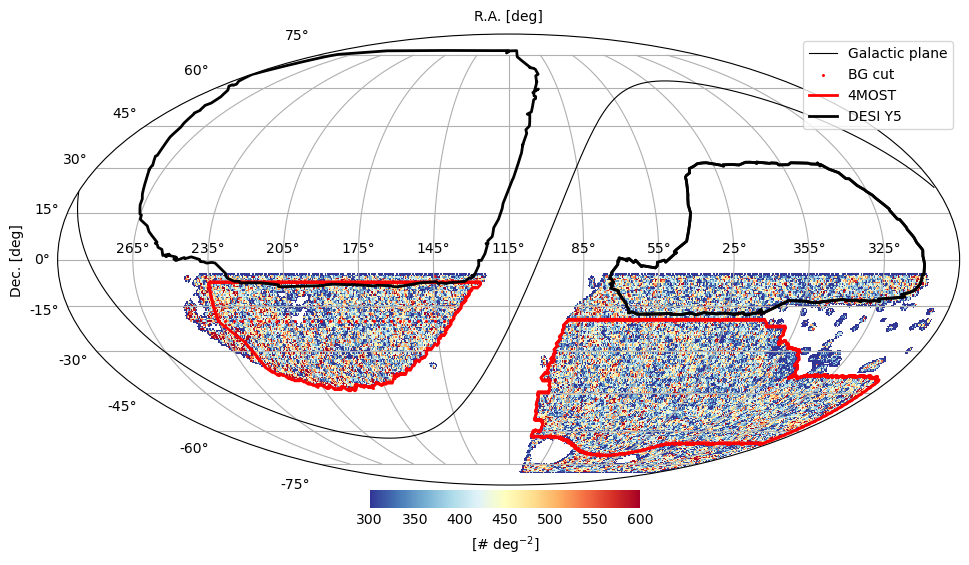

/global/u1/a/arocher/Code/postdoc/4MOST/utils.py:615: RuntimeWarning: invalid value encountered in divide
  m = hp.ma(hmap) if whmap is None else hp.ma(whmap/hmap)


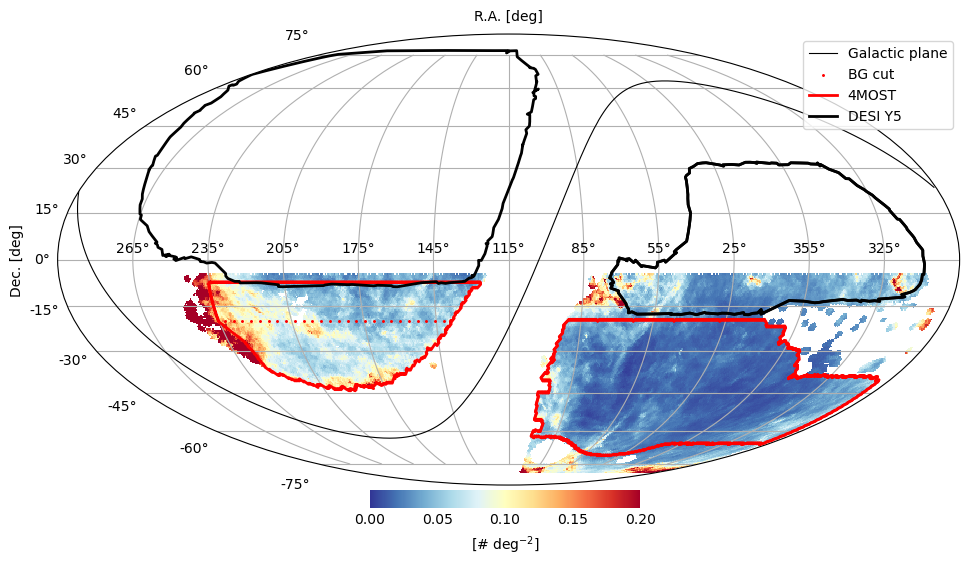

In [ ]:
# plot Sky map
hpmap = utils.create_hp_map(target_4m_lrg['RA'], target_4m_lrg['DEC'], nside=128)
hpmap_ebv = utils.create_hp_map(target_4m_lrg['RA'], target_4m_lrg['DEC'], weight=target_4m_lrg['EBV'], nside=128)

utils.plot_moll(hpmap, rot=115, min=300, max=600, desi_footprint=True, fourmost_footprint=True)
utils.plot_moll(hpmap, hpmap_ebv, rot=115, min=0, max=0.2, desi_footprint=True, fourmost_footprint=True, label='EBV')

In [ ]:
#Select point inside the footprint
mask_s8fp = utils.get_4most_s8foot(target_4m_lrg['RA'], target_4m_lrg['DEC'])

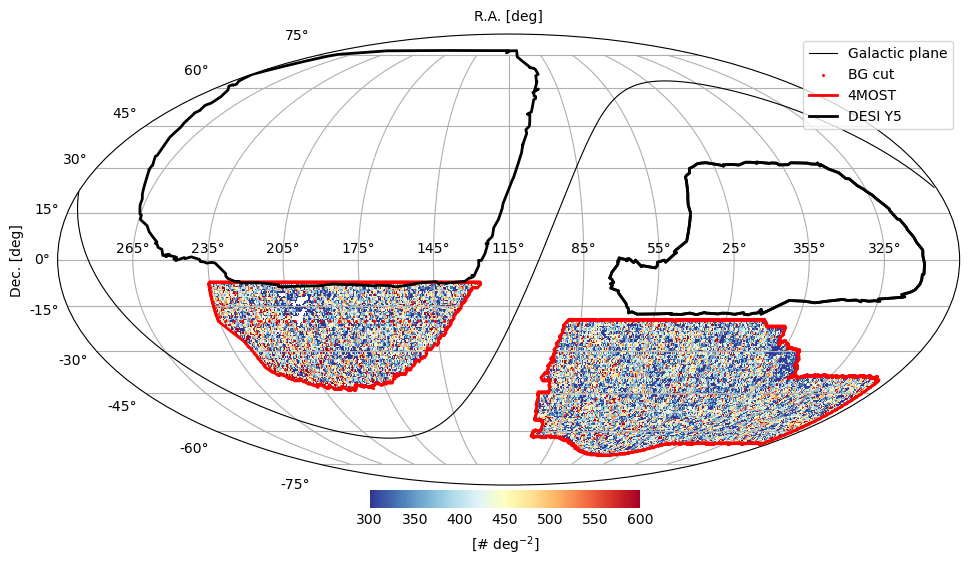

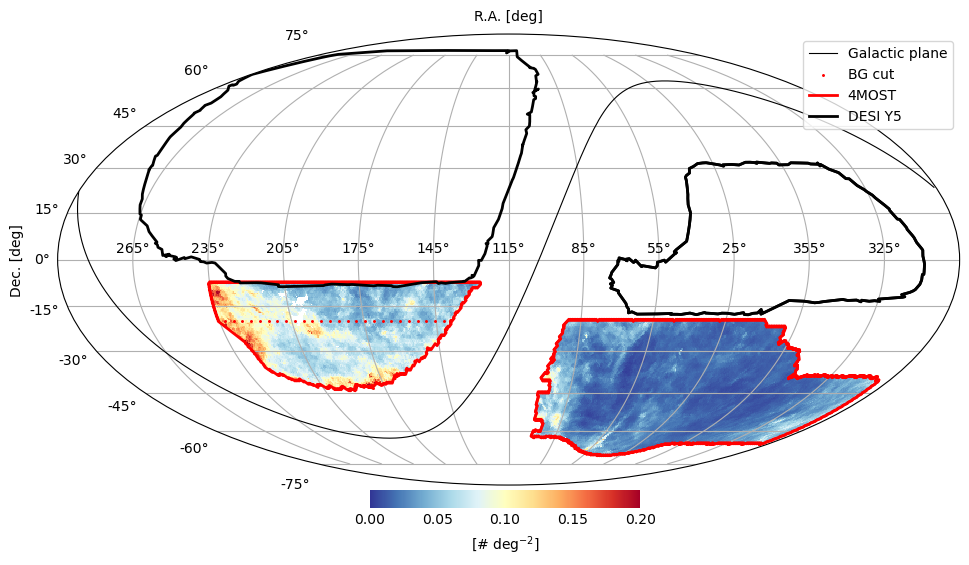

In [ ]:
hpmap = utils.create_hp_map(target_4m_lrg['RA'][mask_s8fp], target_4m_lrg['DEC'][mask_s8fp], nside=128)
hpmap_ebv = utils.create_hp_map(target_4m_lrg['RA'][mask_s8fp], target_4m_lrg['DEC'][mask_s8fp], weight=target_4m_lrg['EBV'][mask_s8fp], nside=128)
utils.plot_moll(hpmap, rot=115, min=300, max=600, desi_footprint=True, fourmost_footprint=True)
utils.plot_moll(hpmap, hpmap_ebv, rot=115, min=0, max=0.2, desi_footprint=True, fourmost_footprint=True, label='EBV')

In [ ]:
utils.get_4most_skyaera()

Area ngc: 2657.977796853583
Area sgc: 4271.938026295238
Total area: 6929.915823148822


In [ ]:
from cosmoprimo.fiducial import DESI
cosmo = DESI()

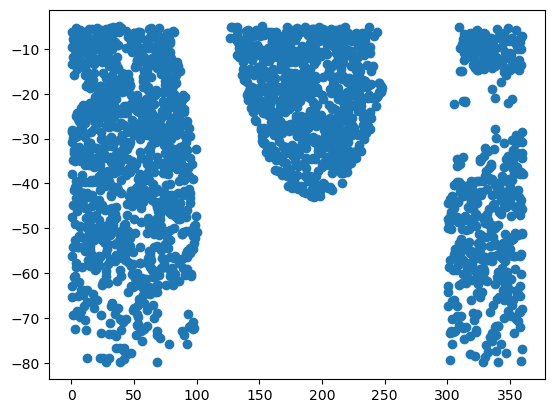

In [ ]:
plt.scatter(target_4m_bg['RA'][::1000], target_4m_bg['DEC'][::1000])

# BG 

In [ ]:
target_4m_bg = Catalog.read([f'/pscratch/sd/a/arocher/4MOST/target_bg_mag_r19_4most_new_{reg}.fits' for reg in ['ngc', 'sgc']])
mag_r = 22.5-2.5*np.log10(target_4m_bg['FLUX_R']/target_4m_bg['MW_TRANSMISSION_R'])
mag_z = 22.5-2.5*np.log10(target_4m_bg['FLUX_Z']/target_4m_bg['MW_TRANSMISSION_Z'])    
mag_g = 22.5-2.5*np.log10(target_4m_bg['FLUX_G']/target_4m_bg['MW_TRANSMISSION_G'])


array([0. 0. 0. ... 0. 0. 0.])

In [ ]:
snr_par = np.abs(target_4m_bg['PARALLAX']*np.sqrt(target_4m_bg['PARALLAX_IVAR']))
snr_pmra = np.abs(target_4m_bg['PMRA']*np.sqrt(target_4m_bg['PMRA_IVAR']))
snr_pmdec = np.abs(target_4m_bg['PMDEC']*np.sqrt(target_4m_bg['PMDEC_IVAR']))
mm = target_4m_bg['PARALLAX'] != 0
mm &= (snr_pmra > 3) | (snr_pmra > 3) | (snr_pmdec > 3) 

In [ ]:
mm.sum()/mm.size

array(0.007048110215042287)

In [ ]:
(target_4m_bg['TYPE'] == 'PSF').sum()/(target_4m_bg['TYPE'] == 'PSF').size

array(0.01872451789457506)

In [ ]:
(np.abs(target_4m_bg['PARALLAX'] [target_4m_bg['PARALLAX'] != 0][mm]) < 1e-2).sum()

array(147)

In [ ]:
mm = (snr_pmra > 3) | (snr_pmra > 3) | (snr_pmdec > 3) 

(array([   7.,    5.,    9.,    8.,    6.,   11.,   12.,   15.,   11.,
          18.,   14.,   10.,   22.,   18.,   20.,   18.,   13.,   18.,
          13.,   18.,   16.,   21.,   21.,   16.,   18.,   29.,   25.,
          35.,   37.,   42.,   42.,   37.,   46.,   65.,   51.,   81.,
          88.,   79.,  104.,  147.,  132.,  156.,  181.,  220.,  279.,
         348.,  406.,  506.,  722.,  501.,  909., 1618., 1653., 1392.,
        1097.,  745.,  572.,  469.,  343.,  262.,  234.,  211.,  174.,
         106.,  128.,  104.,   93.,   75.,   76.,   71.,   55.,   49.,
          40.,   34.,   36.,   36.,   35.,   30.,   30.,   27.,   30.,
          27.,   14.,   18.,   19.,   25.,   16.,   19.,   22.,   11.,
          12.,    9.,   16.,   14.,   10.,   12.,    9.,    7.,   16.,
           7.]),
 array([-20000., -19600., -19200., -18800., -18400., -18000., -17600.,
        -17200., -16800., -16400., -16000., -15600., -15200., -14800.,
        -14400., -14000., -13600., -13200., -12800., -12400.

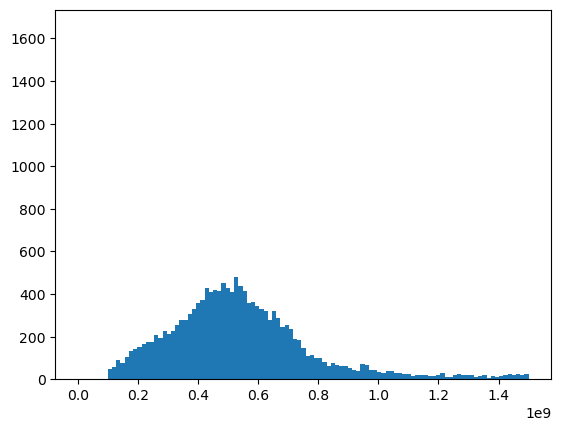

In [ ]:
plt.hist(1/(target_4m_bg['PARALLAX'][target_4m_bg['PARALLAX'] != 0][mm]*1e-3), bins=100, range=(-20000,20000))


In [ ]:
1/target_4m_bg['PARALLAX'] [target_4m_bg['PARALLAX'] != 0][mm]

array([-64.49624     3.1636958  12.248154  ...   1.7871637   1.4816406
   2.9615238])

In [ ]:
target_4m_bg[mm], target_4m_bg[target_4m_bg['PARALLAX'] != 0].size, mag_r.size, mm.size

(Catalog(csize=24595, size=24595, columns=['RELEASE', 'BRICKID', 'BRICKNAME', 'OBJID', 'TYPE', 'RA', 'DEC', 'RA_IVAR', 'DEC_IVAR', 'DCHISQ', 'EBV', 'FLUX_G', 'FLUX_R', 'FLUX_I', 'FLUX_Z', 'FLUX_W1', 'FLUX_W2', 'FLUX_W3', 'FLUX_W4', 'FLUX_IVAR_G', 'FLUX_IVAR_R', 'FLUX_IVAR_I', 'FLUX_IVAR_Z', 'FLUX_IVAR_W1', 'FLUX_IVAR_W2', 'FLUX_IVAR_W3', 'FLUX_IVAR_W4', 'MW_TRANSMISSION_G', 'MW_TRANSMISSION_R', 'MW_TRANSMISSION_I', 'MW_TRANSMISSION_Z', 'MW_TRANSMISSION_W1', 'MW_TRANSMISSION_W2', 'MW_TRANSMISSION_W3', 'MW_TRANSMISSION_W4', 'NOBS_G', 'NOBS_R', 'NOBS_I', 'NOBS_Z', 'NOBS_W1', 'NOBS_W2', 'NOBS_W3', 'NOBS_W4', 'RCHISQ_G', 'RCHISQ_R', 'RCHISQ_I', 'RCHISQ_Z', 'RCHISQ_W1', 'RCHISQ_W2', 'RCHISQ_W3', 'RCHISQ_W4', 'FRACFLUX_G', 'FRACFLUX_R', 'FRACFLUX_I', 'FRACFLUX_Z', 'FRACFLUX_W1', 'FRACFLUX_W2', 'FRACFLUX_W3', 'FRACFLUX_W4', 'FRACMASKED_G', 'FRACMASKED_R', 'FRACMASKED_I', 'FRACMASKED_Z', 'FRACIN_G', 'FRACIN_R', 'FRACIN_I', 'FRACIN_Z', 'ANYMASK_G', 'ANYMASK_R', 'ANYMASK_I', 'ANYMASK_Z', 'ALLMASK

(array([  0.,   2.,  12.,  13.,  11.,  16.,  36.,  59.,  78.,  85.,  95.,
        146., 177., 163., 226., 178., 204., 247., 243., 285., 315., 363.,
        489., 477., 585., 621., 600., 662., 666., 671., 696., 685., 714.,
        710., 693., 622., 731., 633., 602., 577., 531., 554., 483., 499.,
        436., 407., 415., 412., 336., 337., 347., 274., 285., 248., 199.,
        182., 159., 139., 140., 111., 101.,  93.,  90.,  88.,  73.,  79.,
         59.,  46.,  56.,  79.,  70.,  49.,  39.,  37.,  35.,  45.,  41.,
         45.,  34.,  29.,  27.,  24.,  20.,  13.,  20.,  22.,  17.,  15.,
         18.,  13.,  20.,  20.,   9.,  12.,  18.,  21.,  19.,  18.,  11.,
         19.]),
 array([0.        , 0.005     , 0.01      , 0.015     , 0.02      ,
        0.025     , 0.03      , 0.035     , 0.04      , 0.045     ,
        0.05      , 0.055     , 0.06      , 0.065     , 0.07      ,
        0.075     , 0.08      , 0.085     , 0.09      , 0.095     ,
        0.1       , 0.105     , 0.11      , 0.

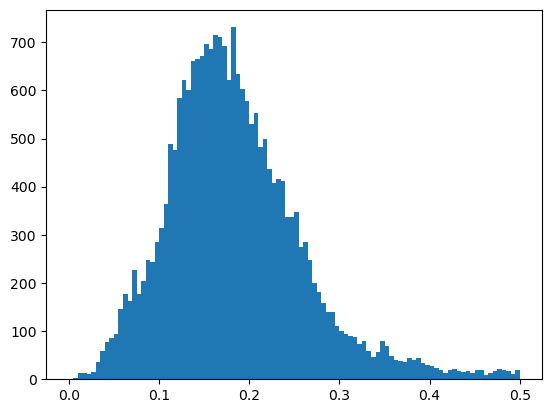

In [ ]:
plt.hist(target_4m_bg[target_4m_bg['PARALLAX'] != 0][mm]['Z_PHOT_MEAN'], bins=100, range=(0,0.5))

(array([  172.,   166.,   186.,   178.,   242.,   180.,   196.,   230.,
          215.,   241.,   245.,   261.,   286.,   266.,   317.,   315.,
          382.,   562.,   900.,  1617.,  2806.,  4671.,  7074.,  9156.,
        10866., 10941.,  9393.,  7147.,  4746.,  2794.,  1577.,   795.,
          427.,   257.,   189.,   159.,   166.,   142.,   125.,    92.,
          106.,    90.,   101.,    90.,    73.,    78.,    79.,    74.,
           67.,    57.]),
 array([-10.        ,  -9.60000038,  -9.19999981,  -8.80000019,
         -8.39999962,  -8.        ,  -7.5999999 ,  -7.19999981,
         -6.80000019,  -6.4000001 ,  -6.        ,  -5.5999999 ,
         -5.19999981,  -4.80000019,  -4.4000001 ,  -4.        ,
         -3.5999999 ,  -3.20000005,  -2.79999995,  -2.4000001 ,
         -2.        ,  -1.60000002,  -1.20000005,  -0.80000001,
         -0.40000001,   0.        ,   0.40000001,   0.80000001,
          1.20000005,   1.60000002,   2.        ,   2.4000001 ,
          2.79999995,   3.2000

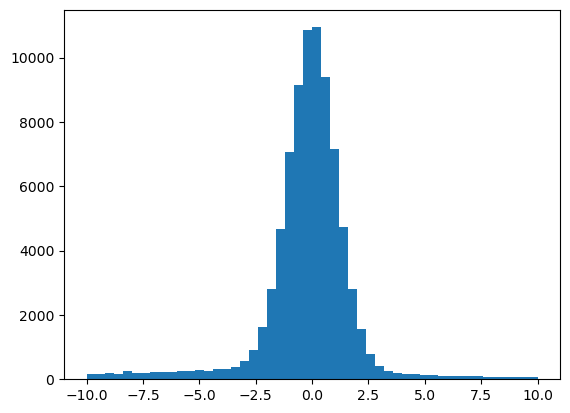

In [ ]:
plt.hist(snr_pmra, bins=50, range=(-10,10))

In [ ]:
mask_par = (np.abs(target_4m_bg['PARALLAX'][target_4m_bg['PARALLAX'] != 0]*np.sqrt(target_4m_bg['PARALLAX_IVAR'][target_4m_bg['PARALLAX'] != 0])) > 3)

In [ ]:
(target_4m_bg[~mask_par]['TYPE'] == 'PSF').sum()/(~mask_par).sum()

array(0.027398067405137873)

In [ ]:
target_4m_bg.ones()

array([1. 1. 1. ... 1. 1. 1.])

In [ ]:
mask = (mag_r < 15.5) | ((mag_g-mag_r<0.1) & (mag_g-mag_r>2.2)) | ((mag_r-mag_z<-0.1) & (mag_r-mag_z>1.1))

In [ ]:
target_4m_bg['PARALLAX_IVAR'][mag_g < 16.5]

array([ 0.       0.       0.      ...  0.      65.80811 28.24339])

In [ ]:
(target_4m_bg[mag_g < 16.5]['TYPE'] == 'PSF').sum(), (target_4m_bg[mag_g < 16.5]['TYPE'] == 'PSF').size

(array(2345), 2949)

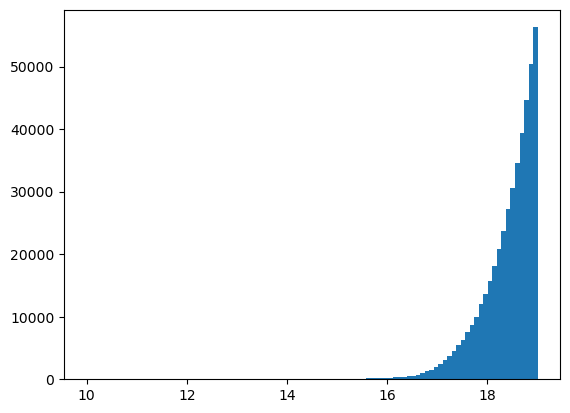

In [ ]:
plt.hist(mag_g, bins=100, range=(10,19))
plt.show()

In [ ]:
(target_4m_bg['TYPE'] =='PSF').sum(), (target_4m_bg['TYPE'][mask] =='PSF').sum()/(target_4m_bg['TYPE'][mask] =='PSF').size

(array(43859), array(0.7273580478648521))

In [ ]:
counts, bins = np.histogram(mag_r, bins=25, range=(15,19))
counts_psf, bins_psf = np.histogram(mag_r[target_4m_bg['TYPE'] !='PSF'], bins=25,range=(15.5,19))

counts_m, bins_m = np.histogram(mag_r[~mask], bins=25,range=(15,19))
counts_m_psf, bins_m_psf = np.histogram(mag_r[~mask & (target_4m_bg['TYPE'] !='PSF')], bins=25, range=(15.5,19))


/tmp/ipykernel_654070/3534588829.py:2: RuntimeWarning: invalid value encountered in divide
  plt.errorbar((bins_m[1:]+bins_m[:-1])*0.5, counts_m_psf/counts, np.sqrt(counts_m-counts_m_psf)/counts_m)


<ErrorbarContainer object of 3 artists>

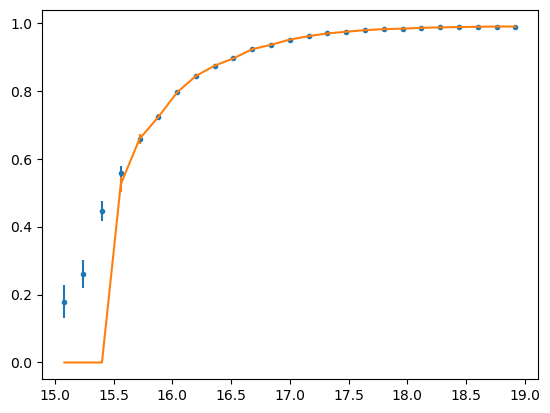

In [ ]:
plt.errorbar((bins[1:]+bins[:-1])*0.5, counts_psf/counts, np.sqrt(counts-counts_psf)/counts, fmt='.')
plt.errorbar((bins_m[1:]+bins_m[:-1])*0.5, counts_m_psf/counts, np.sqrt(counts_m-counts_m_psf)/counts_m)


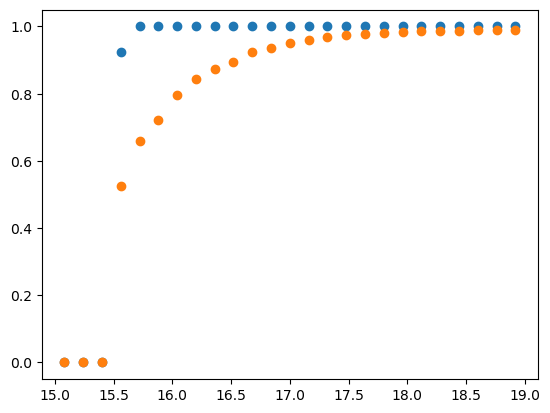

In [ ]:
plt.scatter((bins[1:]+bins[:-1])*0.5, counts_m/counts)
plt.scatter((bins_m[1:]+bins_m[:-1])*0.5, counts_m_psf/counts)



In [ ]:
bgs_desi = Catalog.read('/global/cfs/cdirs/desi/survey/catalogs/edr_prepfor_public/LSScats/full/BGS_BRIGHT_full.dat.fits')
mask = bgs_desi['COADD_FIBERSTATUS'] == 999999
mask |= bgs_desi['ZWARN'] !=0
bgs_desi = bgs_desi[~mask]
mag_r = 22.5-2.5*np.log10(bgs_desi['FLUX_R']/bgs_desi['MW_TRANSMISSION_R'])
mag_z = 22.5-2.5*np.log10(bgs_desi['FLUX_Z']/bgs_desi['MW_TRANSMISSION_Z'])    
mag_g = 22.5-2.5*np.log10(bgs_desi['FLUX_G']/bgs_desi['MW_TRANSMISSION_G'])
sel4most = mag_r-mag_z < (0.9*(mag_g-mag_r)-0.2)
sel4most &= mag_r < 19

In [ ]:
bgs_desi_sel4most = bgs_desi[sel4most]
mag_r = 22.5-2.5*np.log10(bgs_desi_sel4most['FLUX_R']/bgs_desi_sel4most['MW_TRANSMISSION_R'])
mag_z = 22.5-2.5*np.log10(bgs_desi_sel4most['FLUX_Z']/bgs_desi_sel4most['MW_TRANSMISSION_Z'])    
mag_g = 22.5-2.5*np.log10(bgs_desi_sel4most['FLUX_G']/bgs_desi_sel4most['MW_TRANSMISSION_G'])

In [ ]:
mask = (mag_r < 15.5) | ((mag_g-mag_r<0.1) & (mag_g-mag_r>2.2)) | ((mag_r-mag_z<-0.1) & (mag_r-mag_z>1.1))

In [ ]:
mask.sum()/bgs_desi_sel4most.size

array(0.00509513932726125)

In [ ]:
(bgs_desi_sel4most['SPECTYPE'] =='GALAXY').sum()/bgs_desi_sel4most.size

array(0.9819866534403463)

In [ ]:
counts, bins = np.histogram(mag_r, bins=15, range=(15.5,19))
counts_psf, bins_psf = np.histogram(mag_r[bgs_desi_sel4most['SPECTYPE'] =='GALAXY'], bins=15,range=(15.5,19))

counts_m, bins_m = np.histogram(mag_r[~mask], bins=15,range=(15.5,19))
counts_m_psf, bins_m_psf = np.histogram(mag_r[~mask & (bgs_desi_sel4most['SPECTYPE'] =='GALAXY')], bins=15, range=(15.5,19))


<ErrorbarContainer object of 3 artists>

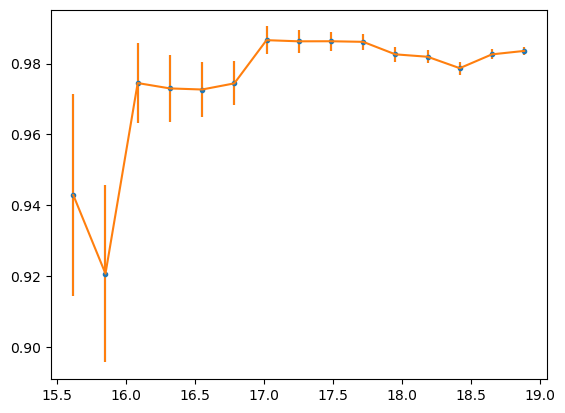

In [ ]:
plt.errorbar((bins[1:]+bins[:-1])*0.5, counts_psf/counts, np.sqrt(counts-counts_psf)/counts, fmt='.')
plt.errorbar((bins_m[1:]+bins_m[:-1])*0.5, counts_m_psf/counts_m, np.sqrt(counts_m-counts_m_psf)/counts_m)


In [ ]:
plt.plot()

array([-282, -303,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0])

In [ ]:
mag_psfg = -2.5*(np.log10(5/np.sqrt(target_4m_bg['PSFDEPTH_R']))-9)

In [ ]:
target_4m_bg = Catalog.read([f'/pscratch/sd/a/arocher/4MOST/target_bg_mag_r19_4most_new_{reg}.fits' for reg in ['ngc', 'sgc']])


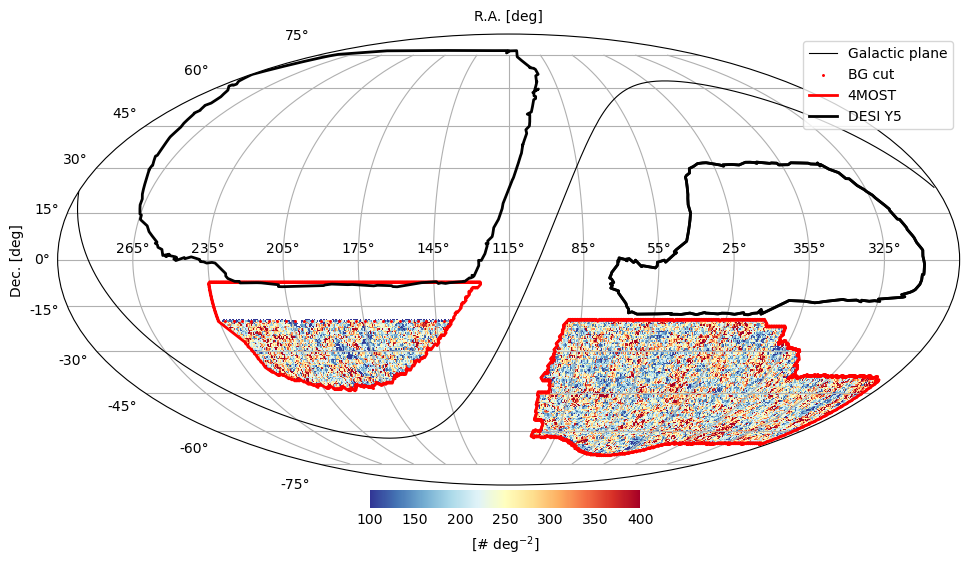

In [ ]:
hpmap = utils.create_hp_map(target_4m_bg['RA'][target_4m_bg['isfoots8']], target_4m_bg['DEC'][target_4m_bg['isfoots8']], nside=128)
#hpmap_ebv = utils.create_hp_map(target_4m_bg['RA'], target_4m_bg['DEC'], weight=mag_psfg, nside=128)

utils.plot_moll(hpmap, rot=115, min=100, max=400, desi_footprint=True, fourmost_footprint=True)
#utils.plot_moll(hpmap, hpmap_ebv, rot=115, min=23.5, max=26, desi_footprint=True, fourmost_footprint=True)

In [ ]:
#Select point inside the footprint

mask_s8fp = utils.get_4most_s8foot(target_4m_bg['RA'], target_4m_bg['DEC'], bg_fp=True)

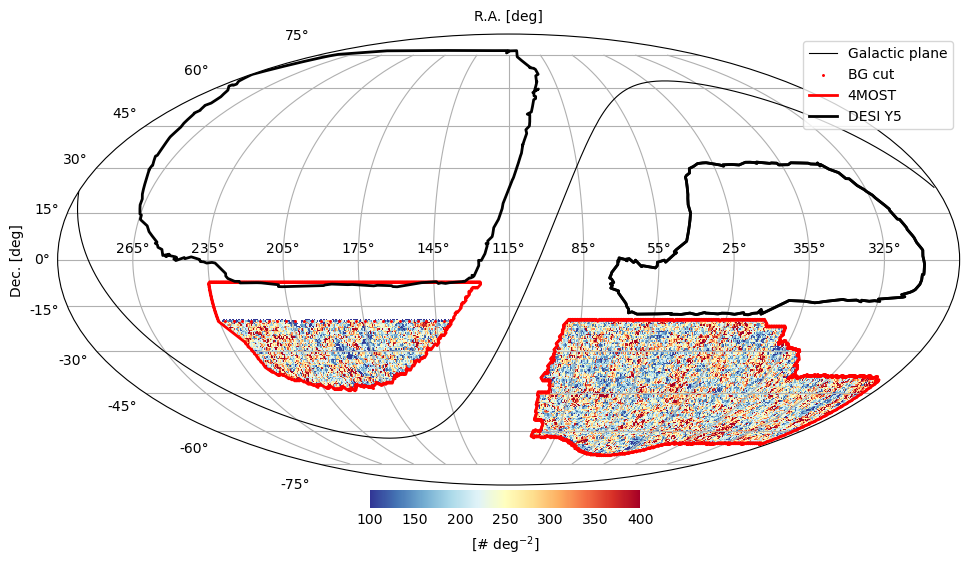

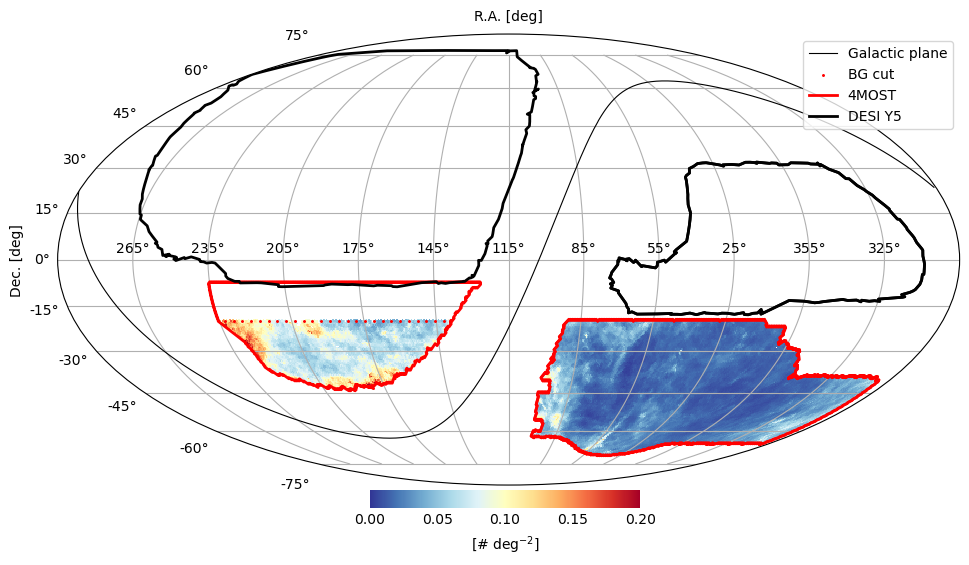

In [ ]:
hpmap = utils.create_hp_map(target_4m_bg['RA'][mask_s8fp], target_4m_bg['DEC'][mask_s8fp], nside=128)
hpmap_ebv = utils.create_hp_map(target_4m_bg['RA'][mask_s8fp], target_4m_bg['DEC'][mask_s8fp], weight=target_4m_bg['EBV'][mask_s8fp], nside=128)
utils.plot_moll(hpmap, rot=115, min=100, max=400, desi_footprint=True, fourmost_footprint=True)
utils.plot_moll(hpmap, hpmap_ebv, rot=115, min=0, max=0.2, desi_footprint=True, fourmost_footprint=True)

In [ ]:
utils.get_4most_skyaera(bg_fp=True)

Area ngc: 1414.2422681448415
Area sgc: 4271.938026295238
Total area: 5686.180294440081


In [ ]:
utils.get_4most_skyaera(bg_fp=True)

Area ngc: 1414.2422681448415
Area sgc: 4271.938026295238
Total area: 5686.180294440081


In [ ]:
tt = Catalog.read('/global/homes/a/arocher/Code/postdoc/4MOST/BG_hp256_syst_file.fits')

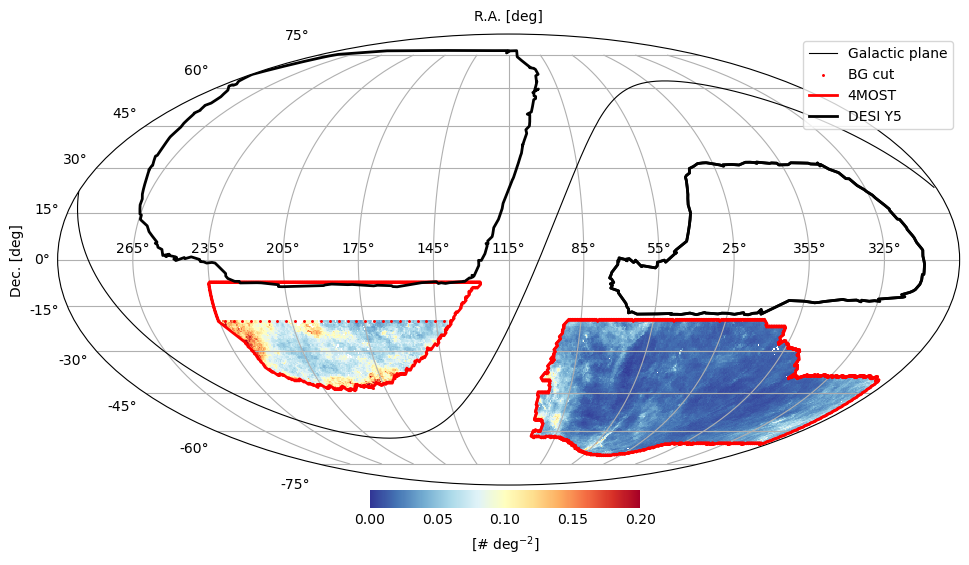

In [ ]:
utils.plot_moll(tt['hp_EBV'], rot=115, min=0, max=0.2, desi_footprint=True, fourmost_footprint=True)

In [ ]:
target_4m_bg = Catalog.read(glob.glob('/pscratch/sd/a/arocher/4MOST/target_bg_mag_r19_4most_v2.fits'))


NameError: name 'Catalog' is not defined

In [ ]:

target_4m_bg = Catalog.read(glob.glob('/pscratch/sd/a/arocher/4MOST/target_bg_mag_r19_4most_v2.fits'))
mask_s8fp = utils.get_4most_s8foot(target_4m_bg['RA'], target_4m_bg['DEC'], bg_fp=True)
hpmap = utils.create_hp_map(target_4m_bg['RA'], target_4m_bg['DEC'], nside=128)


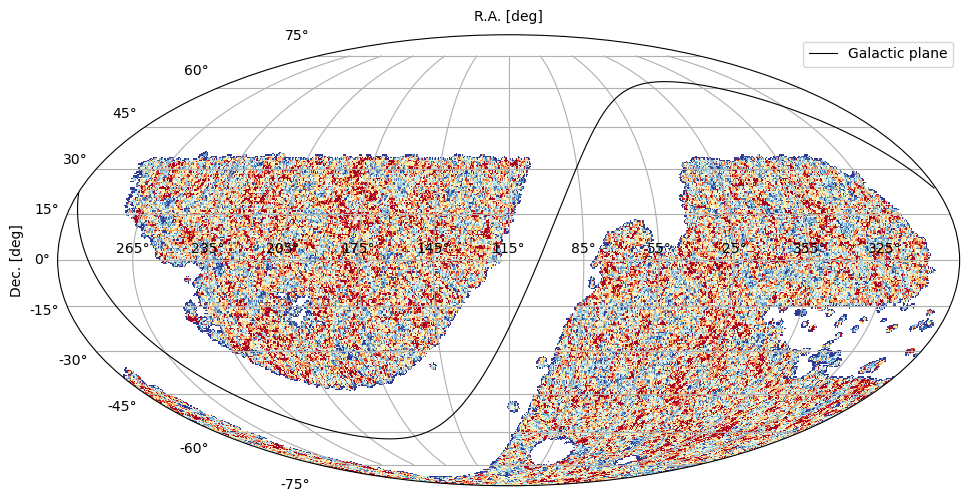

In [ ]:
utils.plot_moll(hpmap, rot=115, min=100, max=350, desi_footprint=False, fourmost_footprint=False, label=None, filename='DR10_fp.png')

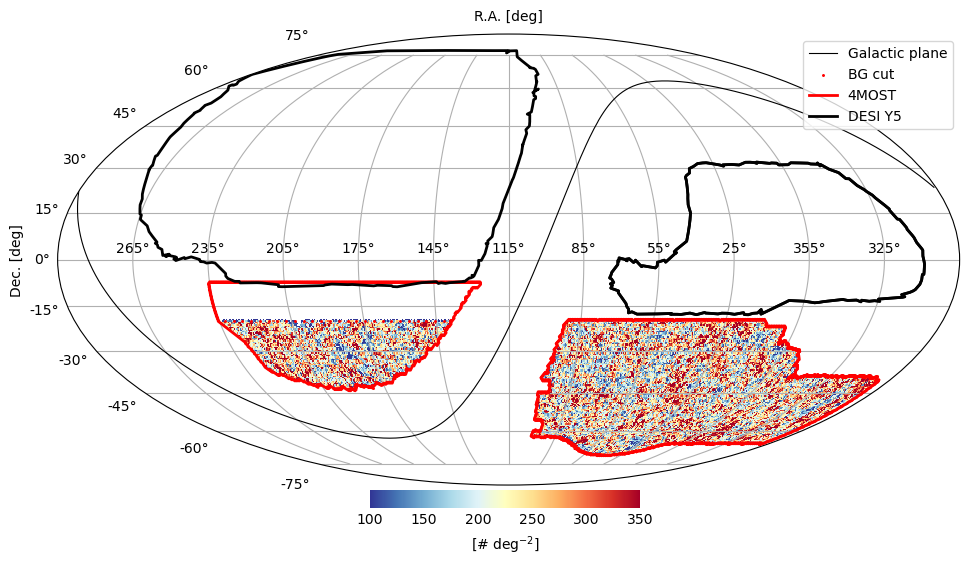

Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']


In [ ]:
hpmap = utils.create_hp_map(target_4m_bg['RA'][mask_s8fp], target_4m_bg['DEC'][mask_s8fp], nside=128)
utils.plot_moll(hpmap, rot=115, min=100, max=350, desi_footprint=True, fourmost_footprint=True)

In [ ]:
utils.plot_moll??


Signature:
utils.plot_moll(
    hmap,
    whmap=None,
    min=None,
    max=None,
    nest=False,
    title='',
    label='[$\\#$ deg$^{-2}$]',
    filename=None,
    show=True,
    mask_dir='/pscratch/sd/a/arocher/4MOST/mask_fp',
    galactic_plane=True,
    ecliptic_plane=False,
    sgr_plane=False,
    stream_plane=False,
    show_legend=True,
    fourmost_footprint=False,
    desi_footprint=False,
    rot=115,
    projection='mollweide',
    figsize=(11.0, 7.0),
    xpad=0.5,
    labelpad=5,
    xlabel_labelpad=10.0,
    ycb_pos=-0.05,
    cmap='RdYlBu_r',
    ticks=None,
    tick_labels=None,
)
Source:   
def plot_moll(hmap, whmap=None, min=None, max=None, nest=False, title='', label=r'[$\#$ deg$^{-2}$]', filename=None, show=True, mask_dir='/pscratch/sd/a/arocher/4MOST/mask_fp',
              galactic_plane=True, ecliptic_plane=False, sgr_plane=False, stream_plane=False, show_legend=True, fourmost_footprint=False, desi_footprint=False,
              rot=115, projection='mollweide'

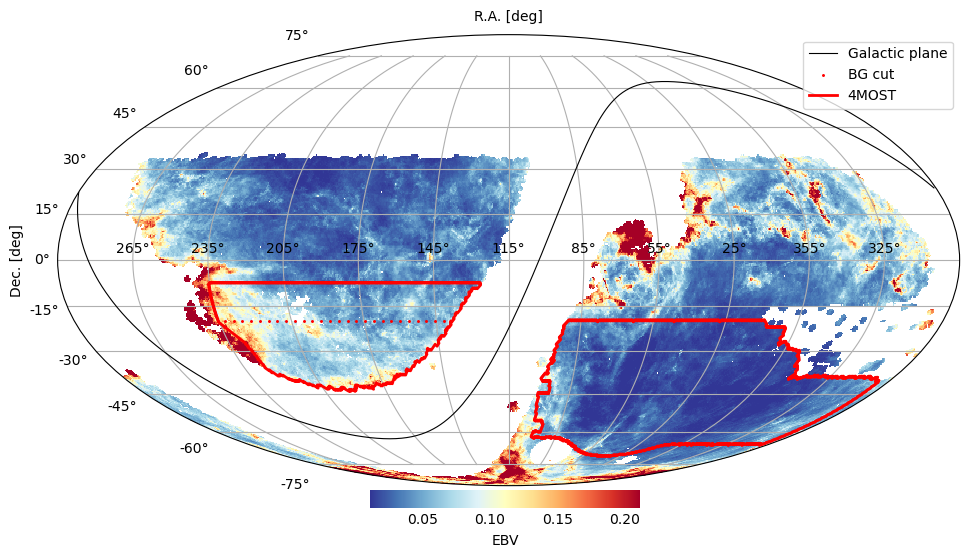

/tmp/ipykernel_1329961/3813408448.py:10: RuntimeWarning: invalid value encountered in divide
  feature_maps[col] = hpmap2/hpmap


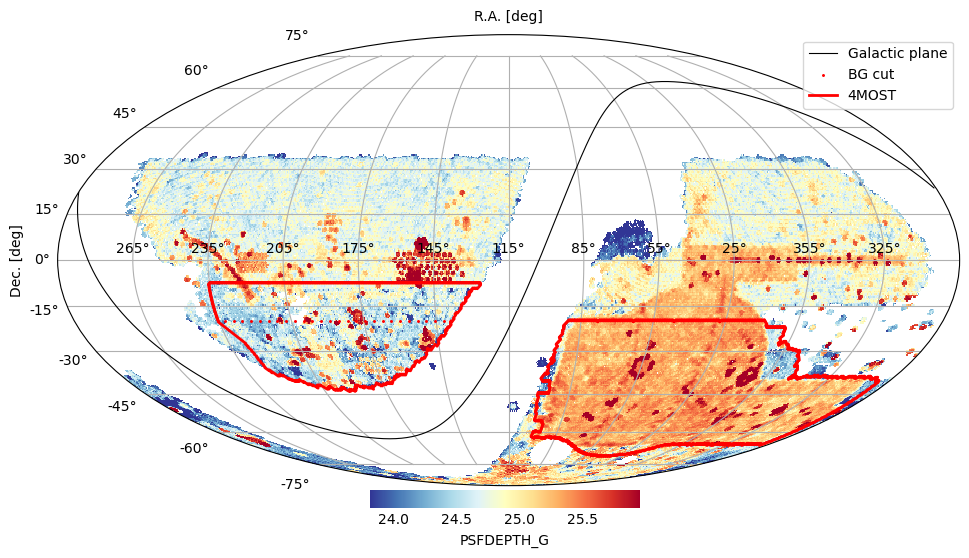

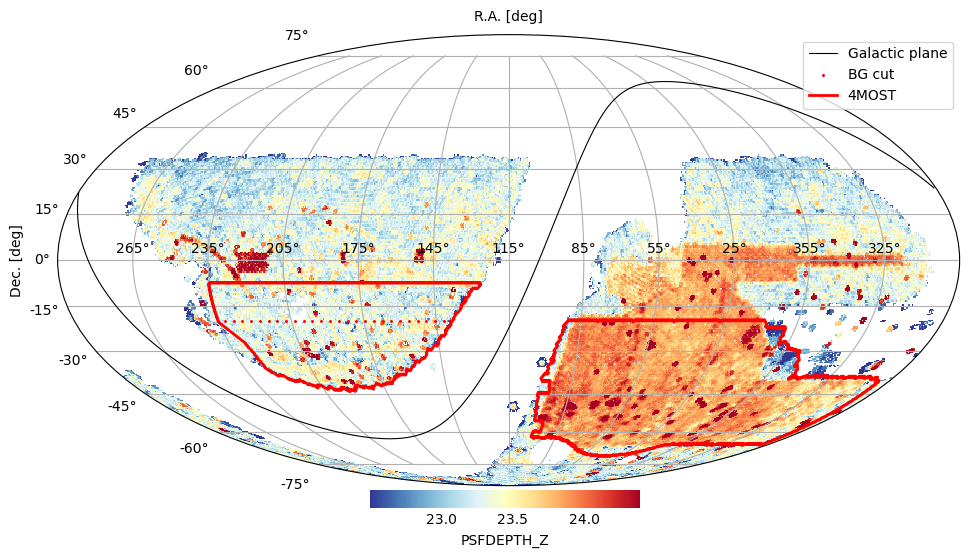

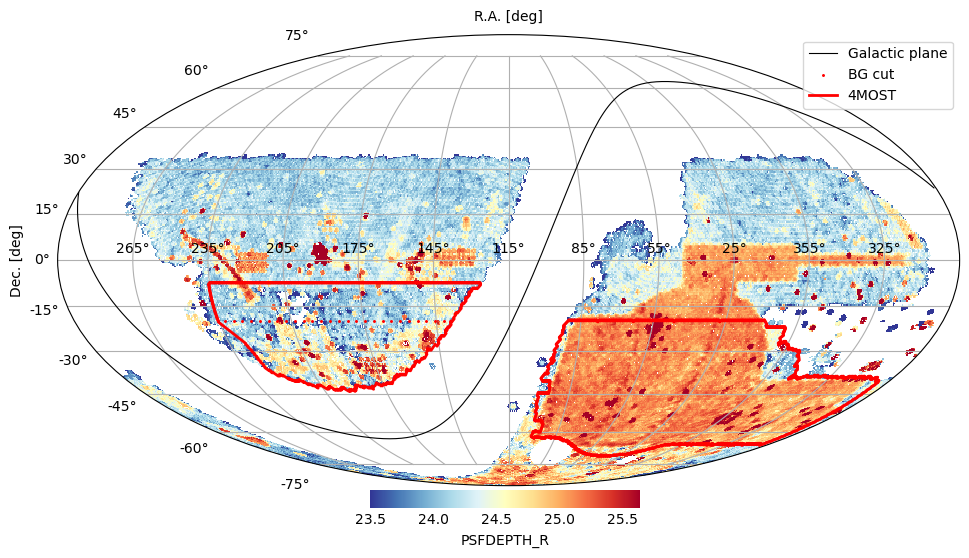

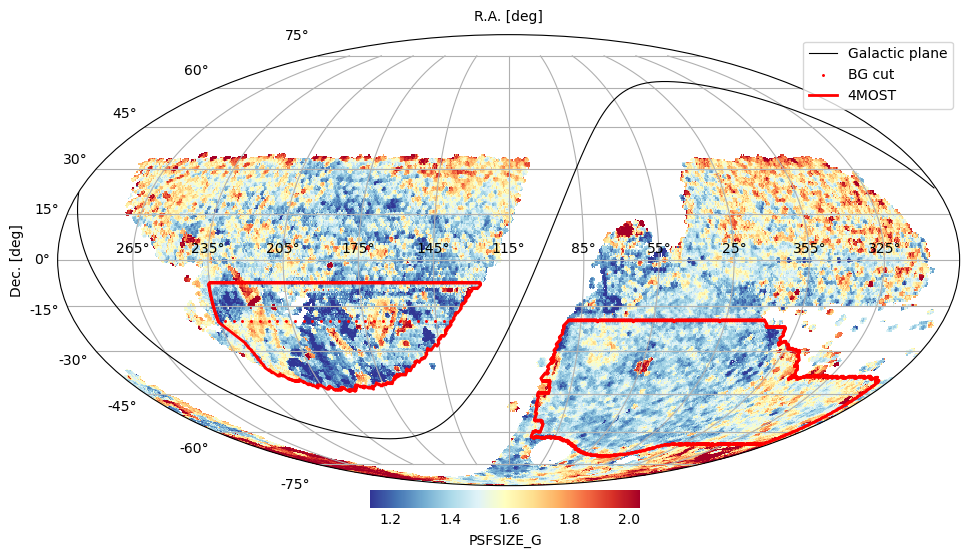

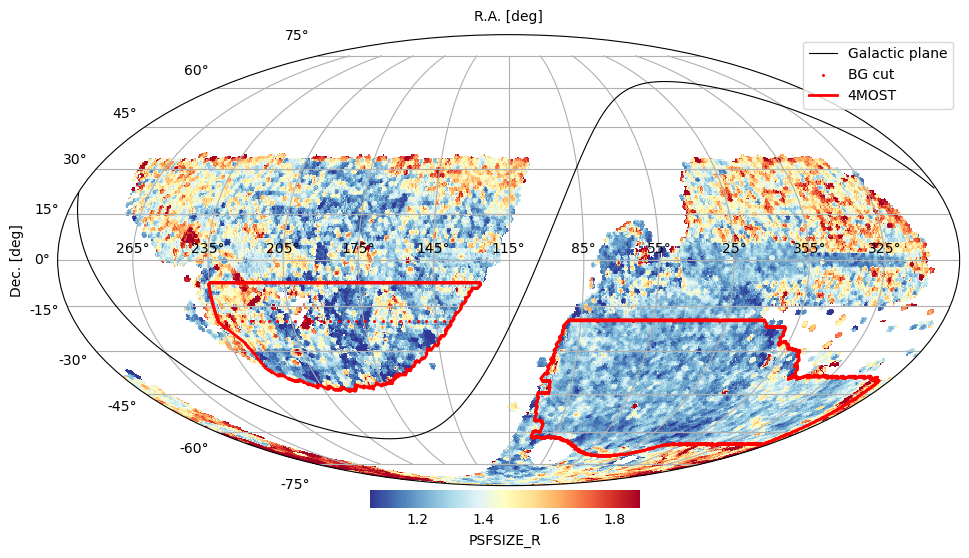

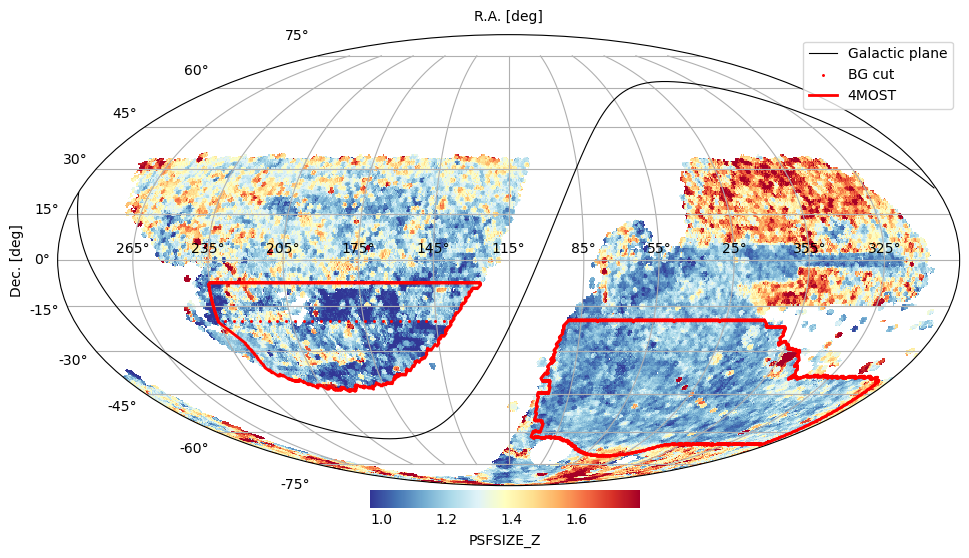

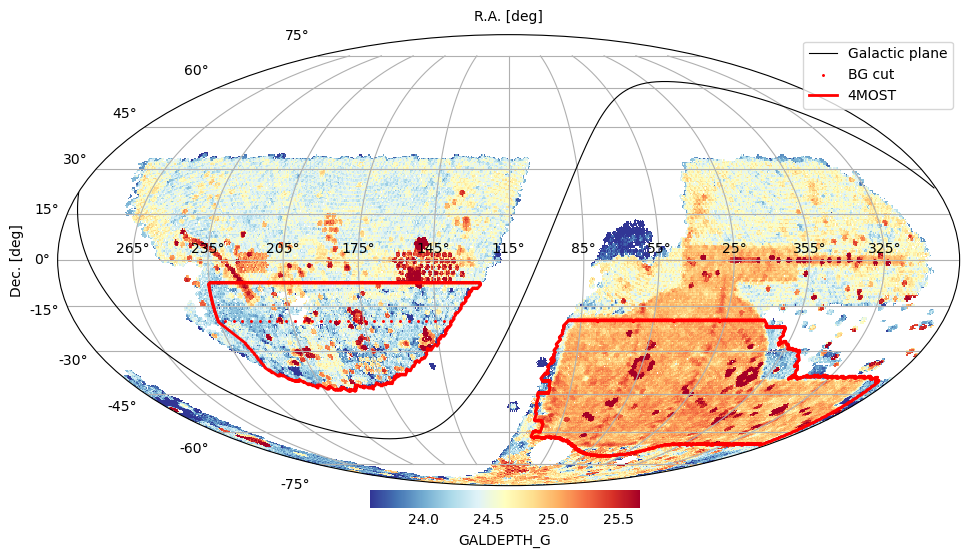

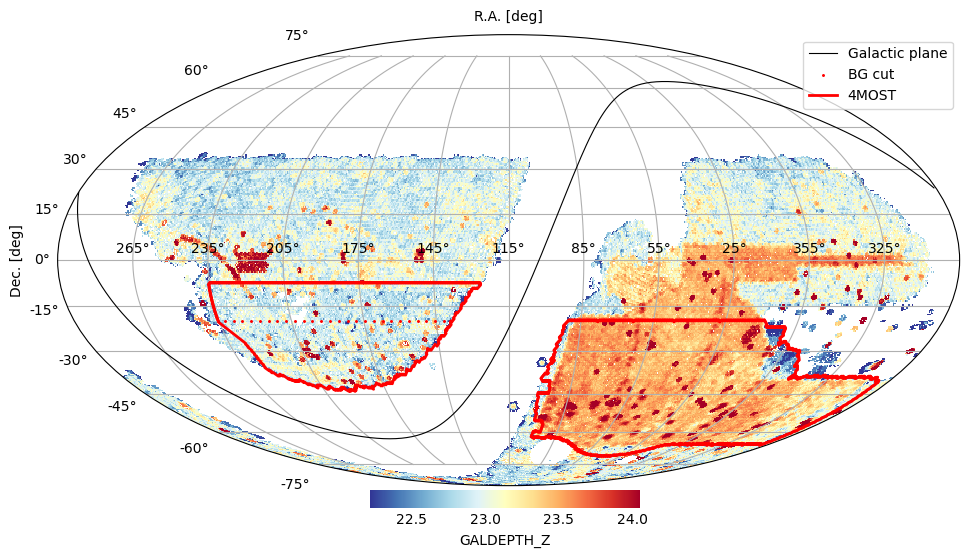

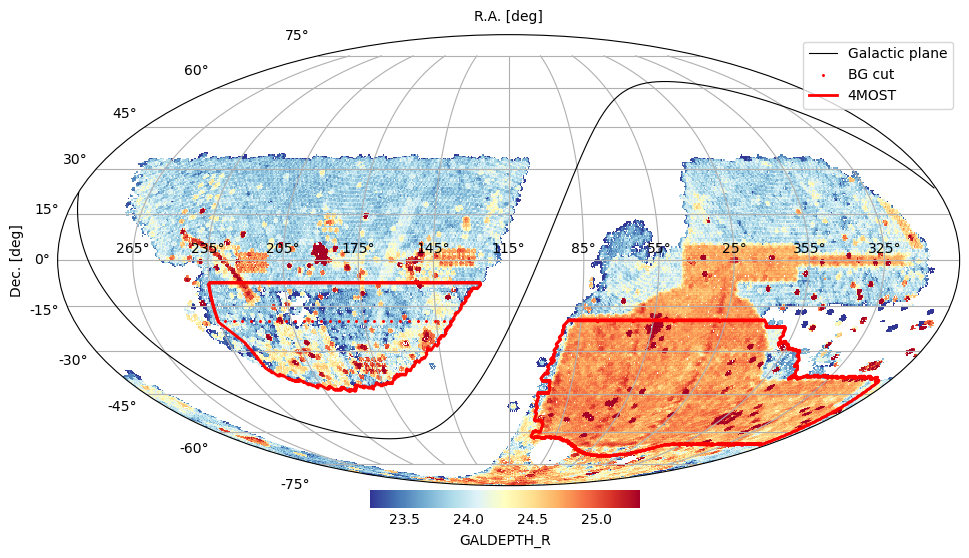

In [ ]:
cols = ['EBV', 'PSFDEPTH_G', 'PSFDEPTH_Z', 'PSFDEPTH_R', 'PSFSIZE_G', 'PSFSIZE_R', 'PSFSIZE_Z', 'GALDEPTH_G', 'GALDEPTH_Z', 'GALDEPTH_R' ]
feature_maps = {}
nside=256
for col in cols:
    val_col = -2.5*(np.log10(5/np.sqrt(target_4m_bg[col]))-9) if 'DEPTH' in col else target_4m_bg[col]
    val_min, val_max = np.quantile(val_col, q=[0.02,0.98])
    hpmap = utils.create_hp_map(target_4m_bg['RA'], target_4m_bg['DEC'], nside=nside)
    hpmap2 = utils.create_hp_map(target_4m_bg['RA'], target_4m_bg['DEC'], weight=val_col, nside=nside)
    utils.plot_moll(hpmap,hpmap2, rot=115, min=val_min, max=val_max, desi_footprint=False, fourmost_footprint=True, label=col)
    feature_maps[col] = hpmap2/hpmap

/tmp/ipykernel_1140589/2223404511.py:21: RuntimeWarning: invalid value encountered in divide
  counts, bins = np.histogram((hpmap_w/hpmap), bins=nbins, range=boundary)
/tmp/ipykernel_1140589/2223404511.py:24: RuntimeWarning: invalid value encountered in divide
  keep_all = [np.all([keep_tot, hpmap_w/hpmap>=bins[i], hpmap_w/hpmap<bins[i+1]], axis=0) for i in range(nbins)]
/tmp/ipykernel_1140589/2223404511.py:43: RuntimeWarning: invalid value encountered in divide
  s.append((hpmap_w/hpmap)[keep_tot])
/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/code/mpytools/main/lib/python3.10/site-packages/mpytools/core.py:542: RuntimeWarning: divide by zero encountered in divide
  results = super().__array_ufunc__(ufunc, method, *args, **kwargs)
/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/conda/lib/python3.10/site-packages/scipy/optimize/_optimize.py:917: RuntimeWarning: invalid value encountered in subtract
  np.max(np.

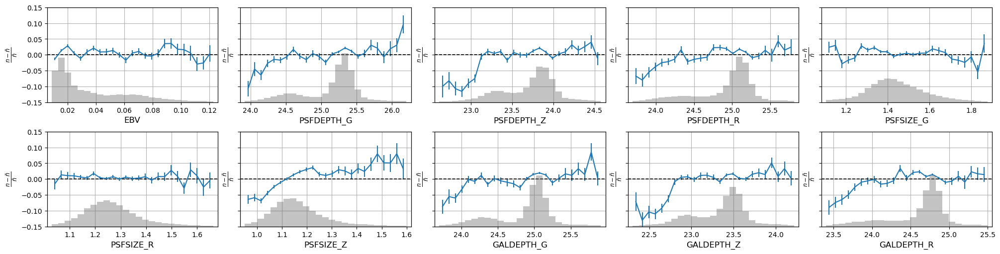

In [ ]:
import healpy as hp 

nside=256
nbins=25
cols = ['EBV', 'PSFDEPTH_G', 'PSFDEPTH_Z', 'PSFDEPTH_R', 'PSFSIZE_G', 'PSFSIZE_R', 'PSFSIZE_Z', 'GALDEPTH_G', 'GALDEPTH_Z', 'GALDEPTH_R' ]
fig, axx = plt.subplots(2,5, figsize=(20,5), sharey=True, constrained_layout = True)
axs=axx.flatten()
s, a_guess = [], [1.0]
hpmap = utils.create_hp_map(target_4m_bg['RA'][mask_s8fp], target_4m_bg['DEC'][mask_s8fp] ,nside=nside)
pixarea = hp.nside2pixarea(nside, degrees=True)
keep_tot = hpmap != 0.0
n_bar = np.mean(hpmap[keep_tot])
for col, ax in zip(cols, axs):
    val_col = -2.5*(np.log10(5/np.sqrt(target_4m_bg[col][mask_s8fp]))-9) if 'DEPTH' in col else target_4m_bg[col][mask_s8fp]
    boundary = np.nanquantile(val_col, q=[0.02,0.98])

    
    hpmap_w = utils.create_hp_map(target_4m_bg['RA'][mask_s8fp], target_4m_bg['DEC'][mask_s8fp], weight=val_col, nside=nside)

    counts, bins = np.histogram((hpmap_w/hpmap), bins=nbins, range=boundary)
    sizebin= np.diff(bins)[0]
    cbin = 0.5*(bins[1:]+bins[:-1])
    keep_all = [np.all([keep_tot, hpmap_w/hpmap>=bins[i], hpmap_w/hpmap<bins[i+1]], axis=0) for i in range(nbins)]
    mean, std = np.array([np.mean((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1]) for mm in keep_all]), [np.std((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1])/np.sqrt(mm.sum()) for mm in keep_all]

    ax.errorbar(cbin, mean -1, [np.std(hpmap[mm]/n_bar)/np.sqrt(mm.sum()) for mm in keep_all])
    ax.axhline(0, ls='--', lw=1.2, c='k')
    ax.grid()
    ax.set_xlabel(col, fontsize=12)
    ax.set_ylabel(r'$\frac{n-\bar n}{\bar n}$', fontsize=12)
    ax.set_ylim(-0.15,0.15)

    ax_hist = ax.twinx()
    ax_hist.set_xlim(ax.get_xlim())
    ax_hist.set_ylim(0,0.4)
    normalisation = counts.sum()
    ax_hist.bar(cbin, counts/normalisation, alpha=0.4, color='dimgray', align='center', width=sizebin, label='Fraction of no. objects\nby bin')
    ax_hist.grid(False)
    ax_hist.set_yticks([])


    s.append((hpmap_w/hpmap)[keep_tot])
    a_guess.append(1.0)

from scipy.optimize import minimize
def n_pred(a):
    n = a[0]
    for s_c, a_i in zip(s, a[1:]):
        n += a_i*s_c
    return n*n_bar
def chi2(a):
    n = n_pred(a)
    chi2 = np.sum((hpmap[keep_tot]*pixarea - n)**2/(n_bar*pixarea)) # Sum (Obs-Pred)**2/sigma**2, sigma=sqrt(N)
    return chi2

res = minimize(chi2, a_guess, method='Nelder-Mead', tol=1e-6)

w = np.zeros(len(hpmap))
w[keep_tot] = n_bar*pixarea/n_pred(res.x)





In [ ]:
w[keep_tot]

array([0.00035337, 0.0003464 , 0.00034624, ..., 0.00034312, 0.00034406,
       0.00034388])

In [ ]:
def n_pred(mean_exp = 1):
    n = 1
    for mean_bin in zip(mean):
        n += mean_bin*mean_exp
    return n*n_bar

def chi2(a):
    n = n_pred(a)
    chi2 = np.sum((cat_hp['hp_density'][keep_tot]*pixarea - n)**2/(n_bar*pixarea)) # Sum (Obs-Pred)**2/sigma**2, sigma=sqrt(N)
    return chi2

array([0., 0., 0., ..., 0., 0., 0.])

In [ ]:
def n_pred(mean_expected):
    n = 1
    for mean_bin, m in (mean, mean_expected):
        n += mean_bin*m
    return n*n_bar

In [ ]:
n = (1+np.sum(mean))*n_bar

In [ ]:
np.sum((hpmap[keep_tot]*pixarea - n)**2/(n_bar*pixarea))

267257582.09726778

In [ ]:
def chi2(a):
    n = (1+np.sum(mean))*n_bar
    chi2 = np.sum((hpmap[keep_tot]*pixarea - n)**2/(n_bar*pixarea)) # Sum (Obs-Pred)**2/sigma**2, sigma=sqrt(N)
    return chi2

In [ ]:
s, a_guess = [], [1.0]
cols_name = list(cols.keys())
for c in cols_name:
    s.append(cat_hp[c][keep_tot])
    a_guess.append(1.0)
def n_pred(a):
    n = a[0]
    for s_c, a_i in zip(s, a[1:]):
        n += a_i*s_c
    return n*n_bar
def chi2(a):
    n = n_pred(a)
    chi2 = np.sum((cat_hp['hp_density'][keep_tot]*pixarea - n)**2/(n_bar*pixarea)) # Sum (Obs-Pred)**2/sigma**2, sigma=sqrt(N)
    return chi2

res = minimize(chi2, a_guess, method='Nelder-Mead', tol=1e-6)

w = np.zeros(len(cat_hp['hp_density']))
w[keep_tot] = n_bar*pixarea/n_pred(res.x)

In [ ]:
import healpy as hp 
pixarea = hp.nside2pixarea(128, degrees=True)
keep_tot = hpmap != 0.0
n_bar = np.mean(hpmap[keep_tot])*pixarea

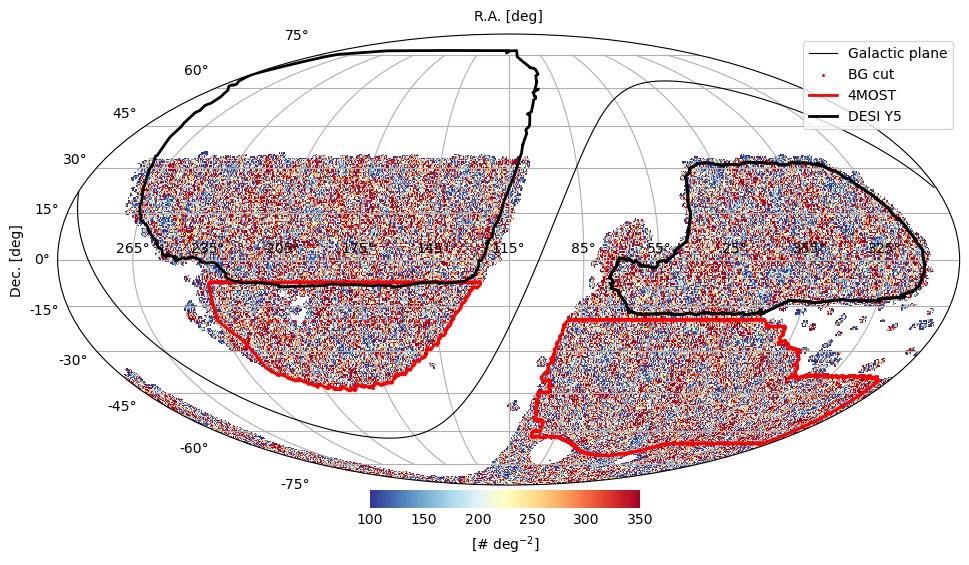

In [ ]:
hpmap = utils.create_hp_map(target_4m_bg['RA'], target_4m_bg['DEC'], nside=256)
utils.plot_moll(hpmap, rot=115, min=100, max=350, desi_footprint=True, fourmost_footprint=True)

In [ ]:
import numpy as np
import fitsio
from fitsio import FITS,FITSHDR
from Functions import *
from astropy.io import fits
from astropy.table import Table
import sys

# LRG new ----------------------------------------------------------------------

galtype = 'LRG'
galtype = 'BG'


#pix, stardens, nside, ra, dec = stellar_density_systematic(filename='pixweight-1-dark.fits')

#hdu = fits.open(filename)

data = bg_v1[bg_v1['isfoots8']]
#hdu.close()

RA = data['RA']

north = np.where((RA > 120) & (RA < 270))
south = np.where((RA < 120) | (RA > 270))

NGC_cat = data[north]
SGC_cat = data[south]

data_caps = {'NGC': NGC_cat, 'SGC': SGC_cat, 'ALL': data}

# Weights
hp_s = 256
cap = 'ALL'
filename_hp=f'{galtype}_hp{hp_s}_syst_file.fits'
hp_syst_fits(data_caps[cap], pos=['RA', 'DEC'], cols=['EBV'], nside=hp_s, output_fits=filename_hp)

# Weights per caps
#hp_s = 256
#cap = 'NGC'
#filename_hp=f'{galtype}_hp{hp_s}_syst_file_{cap}.fits'
#hp_syst_fits(data_caps[cap], pos=['sweep_RA', 'sweep_DEC'], cols=['sweep_EBV', 'sweep_GALDEPTH_G', 'sweep_GALDEPTH_R', 'sweep_GALDEPTH_Z', 'sweep_PSFSIZE_G', 'sweep_PSFSIZE_R', 'sweep_PSFSIZE_Z'], nside=hp_s, output_fits=filename_hp)

#hp_s = 256
#cap = 'SGC'
#filename_hp=f'{galtype}_hp{hp_s}_syst_file_{cap}.fits'
#hp_syst_fits(data_caps[cap], pos=['sweep_RA', 'sweep_DEC'], cols=['sweep_EBV', 'sweep_GALDEPTH_G', 'sweep_GALDEPTH_R', 'sweep_GALDEPTH_Z', 'sweep_PSFSIZE_G', 'sweep_PSFSIZE_R', 'sweep_PSFSIZE_Z'], nside=hp_s, output_fits=filename_hp)



hp_file, hp_h = fitsio.read(filename_hp, header=True)
#hp_file, hp_h = Table.read(filename_hp)
keep_tot = hp_file['hp_density']!=0.0

#cols = {'hp_sweep_EBV': [1],
#        'hp_sweep_GALDEPTH_G': [1], 'hp_sweep_GALDEPTH_R': [1], 'hp_sweep_GALDEPTH_Z': [1],
#        'hp_sweep_PSFSIZE_G': [1], 'hp_sweep_PSFSIZE_R': [1], 'hp_sweep_PSFSIZE_Z': [1]}
#w, n_pred, _= compute_weights_Delubac17(hp_file, nside=hp_s, cols=cols)
#print(np.mean(w[keep_tot]), np.min(w[keep_tot]), np.max(w[keep_tot]))
#cols = {'hp_sweep_EBV': [0,0.12,'E_BV'],
#        'hp_sweep_GALDEPTH_G': [24, 26, 'galdepth g'], 'hp_sweep_GALDEPTH_R': [23, 25, 'galdepth r'], 'hp_sweep_GALDEPTH_Z': [22, 24, 'galdepth z'],
#        'hp_sweep_PSFSIZE_G': [1.2, 1.8, 'PSF g-band'], 'hp_sweep_PSFSIZE_R': [1.0, 1.6, 'PSF r-band'], 'hp_sweep_PSFSIZE_Z': [1.0, 1.5, 'PSF z-band']}
#plt_hpsyst(hp_file, cols=cols, nbins=20, Namefig=f'figures/{galtype}_hp{hp_s}_syst_w.png', nbmin_hp_perbins=100, interp=False, deg=1, w=w, weights=True, nb_rows=3, figsize=(8,8))

#cols = {'hp_sweep_EBV': [1],
#        'hp_sweep_GALDEPTH_G': [1], 'hp_sweep_GALDEPTH_R': [1], 'hp_sweep_GALDEPTH_Z': [1],
#        'hp_sweep_PSFSIZE_G': [1], 'hp_sweep_PSFSIZE_R': [1], 'hp_sweep_PSFSIZE_Z': [1]}
#w, n_pred, _= compute_weights_Raichoor20(hp_file, nside=hp_s, cols=cols)
#w[w<0] = 0
#w[w>1000] = 0
#print(np.mean(w[keep_tot]), np.min(w[keep_tot]), np.max(w[keep_tot]))
#cols = {'hp_sweep_EBV': [0,0.12,'E_BV'],
#        'hp_sweep_GALDEPTH_G': [24, 26, 'galdepth g'], 'hp_sweep_GALDEPTH_R': [23, 25, 'galdepth r'], 'hp_sweep_GALDEPTH_Z': [22, 24, 'galdepth z'],
#        'hp_sweep_PSFSIZE_G': [1.2, 1.8, 'PSF g-band'], 'hp_sweep_PSFSIZE_R': [1.0, 1.6, 'PSF r-band'], 'hp_sweep_PSFSIZE_Z': [1.0, 1.5, 'PSF z-band']}
#plt_hpsyst(hp_file, cols=cols, nbins=20, Namefig=f'figures/{galtype}_hp{hp_s}_syst_w_Anand_2.png', nbmin_hp_perbins=100, interp=False, deg=1, w=w, weights=True, nb_rows=3, figsize=(8,8))

    
cols = {'hp_EBV': [1]}
w, n_pred, res= compute_weights_Delubac17(hp_file, nside=hp_s, cols=cols)
print(len(w))
#print(np.mean(w[keep_tot]), np.min(w[keep_tot]), np.max(w[keep_tot]))
cols = {'hp_EBV': [0,0.12,'E_BV']}
plt_hpsyst(hp_file, cols=cols, nbins=20, Namefig=f'{galtype}_hp{hp_s}_syst_w_delubac_new2.png', nbmin_hp_perbins=1, interp=False, deg=1, w=w, weights=True, nb_rows=3, figsize=(8,8))

#plot_cmap(ra[keep_tot], dec[keep_tot], w[keep_tot], vmin=0.8, vmax=1.2,  labelcmap='w', ymin=-70, ymax=10, xmin=0, xmax=360)




pixarea:  0.052455852825697924
Nb tot gal:  1371849 ; Nb tot hp filled:  107568
Filename exists!
hp_EBV 0.03839702 0.27619353 0.27767065 0.0014771175 0
786432
hp_EBV ::  Nb hp for the x-bin ( 0.0 <x< 0.006 ):  321  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.006 <x< 0.012 ):  10602  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.012 <x< 0.018000000000000002 ):  25244  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.018000000000000002 <x< 0.024 ):  15221  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.024 <x< 0.03 ):  7913  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.03 <x< 0.036000000000000004 ):  6475  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.036000000000000004 <x< 0.042 ):  5304  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.042 <x< 0.048 ):  4090  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.048 <x< 0.054 ):  4131  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.054 <x< 0.06 ):  4334  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the

(array([   844,  16876, 120353, 227303, 212674, 157467, 126700, 131097,
        128888, 119209, 108559,  94706,  89655,  83549,  75388,  67963,
         62417,  57096,  50459,  44980,  40295,  36958,  31968,  27432,
         23845]),
 array([0.   , 0.004, 0.008, 0.012, 0.016, 0.02 , 0.024, 0.028, 0.032,
        0.036, 0.04 , 0.044, 0.048, 0.052, 0.056, 0.06 , 0.064, 0.068,
        0.072, 0.076, 0.08 , 0.084, 0.088, 0.092, 0.096, 0.1  ],
       dtype=float32))

In [ ]:
plt_hpsyst(hp_file, cols=cols, nbins=20, Namefig=f'{galtype}_hp{hp_s}_syst_w_delubac_new2.png', nbmin_hp_perbins=1, interp=False, deg=1, w=w, weights=True, nb_rows=3, figsize=(8,8))


hp_EBV ::  Nb hp for the x-bin ( 0.0 <x< 0.006 ):  321  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.006 <x< 0.012 ):  10602  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.012 <x< 0.018000000000000002 ):  25244  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.018000000000000002 <x< 0.024 ):  15221  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.024 <x< 0.03 ):  7913  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.03 <x< 0.036000000000000004 ):  6475  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.036000000000000004 <x< 0.042 ):  5304  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.042 <x< 0.048 ):  4090  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.048 <x< 0.054 ):  4131  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.054 <x< 0.06 ):  4334  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.06 <x< 0.066 ):  4294  (nb hp min= 1 ) 
hp_EBV ::  Nb hp for the x-bin ( 0.066 <x< 0.07200000000000001 ):  4117  (nb hp min= 1 ) 
hp_EBV ::  Nb hp f

In [ ]:
import healpy as hp 
hpmap = utils.create_hp_map(target_4m_bg['RA'], target_4m_bg['DEC'] ,nside=128)

pixarea = hp.nside2pixarea(128, degrees=True)
keep_tot = hpmap != 0.0
n_bar = np.mean(hpmap[keep_tot])*pixarea

hpmap_ebv = utils.create_hp_map(target_4m_bg['RA'], target_4m_bg['DEC'], weight=target_4m_bg['EBV'] ,nside=128)

keep = hpmap_ebv[keep_tot]!=0.0
mean_c = np.mean(hpmap_ebv[keep_tot][keep])

In [ ]:

keep_tot = hpmap!=0.0
mean_density = np.mean(hpmap[keep_tot])

counts, bins = np.histogram((hpmap_ebv[keep_tot]/hpmap[keep_tot]), bins=25, range=(0,0.2))
sizebin= np.diff(bins)[0]

keep = np.all([keep_tot, hpmap_ebv>=cols[cols_name[i]][0]+sizebin*j, hpmap_ebv<=cols[cols_name[i]][0]+sizebin*(j+1)], axis=0)


nx[j] = np.mean(hpmap[keep]/mean_density)
nx_std[j] = np.std(hpmap[keep]/mean_density)
if weights: 
    nx_w[j] = np.mean(hpmap[keep]*w[keep]/mean_density_w)
    nx_std_w[j] = np.std(hpmap[keep]*w[keep]/mean_density_w)
center_bins[j] = cols[cols_name[i]][0]+sizebin*(j+0.5)

ax.set_xlabel(cols[cols_name[i]][2])
ax.set_ylabel(r"$n/\overline{n}$") 

keep_plt = keep_sum >= nbmin_hp_perbins
ax.errorbar(center_bins[keep_plt], nx[keep_plt], yerr=nx_std[keep_plt]/np.sqrt(keep_sum[keep_plt]), label='Data', color=c[0])
if weights: 
ax.errorbar(center_bins[keep_plt], nx_w[keep_plt], yerr=nx_std_w[keep_plt]/np.sqrt(keep_sum[keep_plt]), ls='--', label='Corrected', color=c[1])
ax.plot([center_bins[keep_plt][0]-0.5*sizebin, center_bins[keep_plt][-1]+0.5*sizebin], [1,1], 'k:')

In [ ]:

keep_tot = hpmap!= 0.0
mean_density = np.mean(hpmap[keep_tot])

/tmp/ipykernel_22871/2634277499.py:10: RuntimeWarning: invalid value encountered in divide
  counts, bins = np.histogram((hpmap_ebv/hpmap), bins=nbins, range=(0,0.2))
/tmp/ipykernel_22871/2634277499.py:13: RuntimeWarning: invalid value encountered in divide
  keep_all = [np.all([keep_tot, hpmap_ebv/hpmap>=bins[i], hpmap_ebv/hpmap<bins[i+1]], axis=0) for i in range(nbins)]


<ErrorbarContainer object of 3 artists>

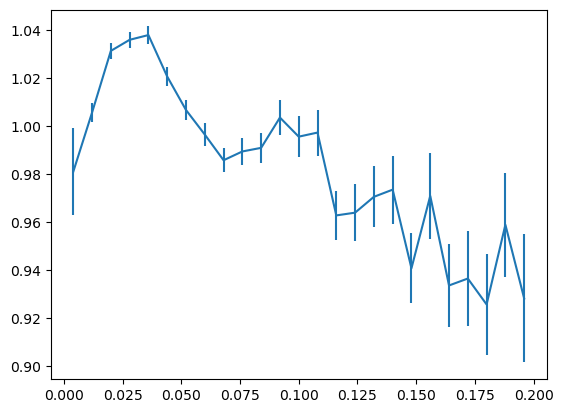

In [ ]:
nside=128
nbins=25
hpmap = utils.create_hp_map(target_4m_bg['RA'], target_4m_bg['DEC'] ,nside=nside)

pixarea = hp.nside2pixarea(nside, degrees=True)
keep_tot = hpmap != 0.0
n_bar = np.mean(hpmap[keep_tot])
hpmap_ebv = utils.create_hp_map(target_4m_bg['RA'], target_4m_bg['DEC'], weight=target_4m_bg['EBV'] ,nside=nside)

counts, bins = np.histogram((hpmap_ebv/hpmap), bins=nbins, range=(0,0.2))
sizebin= np.diff(bins)[0]
cbin = 0.5*(bins[1:]+bins[:-1])
keep_all = [np.all([keep_tot, hpmap_ebv/hpmap>=bins[i], hpmap_ebv/hpmap<bins[i+1]], axis=0) for i in range(nbins)]
mean, std = [np.mean((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.2]) for mm in keep_all], [np.std((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.2])/np.sqrt(mm.sum()) for mm in keep_all]

plt.errorbar(cbin,mean, [np.std(hpmap[mm]/n_bar)/np.sqrt(mm.sum()) for mm in keep_all])

In [ ]:
[(np.mean((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1]), np.std(hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1]/np.sqrt(mm.sum())) for mm in keep_all]

IndexError: invalid index to scalar variable.

In [ ]:
(hpmap[keep_all[2]]/n_bar >0.1).sum()

3236

In [ ]:
hpmap_ebv[keep_tot]/hpmap[keep_tot]

array([0.01600219, 0.01545325, 0.00932735, ..., 0.16118485, 0.14974448,
       0.14792821])

(array([1.7257e+04, 2.6884e+04, 1.8480e+04, 1.2235e+04, 7.6920e+03,
        4.4650e+03, 2.6680e+03, 1.8180e+03, 1.2080e+03, 8.4600e+02,
        5.5600e+02, 3.7500e+02, 3.2200e+02, 2.9700e+02, 1.8900e+02,
        1.7100e+02, 1.3600e+02, 1.1200e+02, 9.4000e+01, 6.6000e+01,
        5.8000e+01, 3.9000e+01, 4.4000e+01, 4.2000e+01, 2.3000e+01,
        1.8000e+01, 1.0000e+01, 1.6000e+01, 1.3000e+01, 7.0000e+00,
        9.0000e+00, 1.2000e+01, 1.4000e+01, 1.2000e+01, 8.0000e+00,
        1.1000e+01, 4.0000e+00, 5.0000e+00, 1.0000e+00, 3.0000e+00,
        1.0000e+00, 3.0000e+00, 2.0000e+00, 3.0000e+00, 3.0000e+00,
        1.0000e+00, 1.0000e+00, 2.0000e+00, 2.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 2.0000e+00, 0.0000e+00, 2.0000e+00,
        1.0000e+00, 0.0000e+00, 1.0000e+00, 3.0000e+00, 0.0000e+00,
        0.0000e+00, 2.0000e+00, 0.0000e+00, 2.0000e+00, 1.0000e+00,
        0.0000e+00, 1.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
        0.0000e+00, 2.0000e+00, 0.0000e+00, 1.00

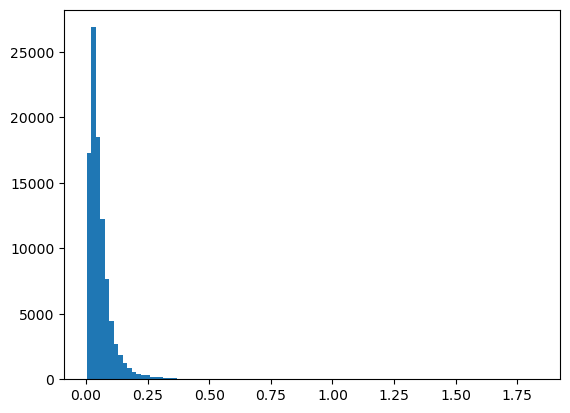

In [ ]:
plt.hist((hpmap_ebv[keep_tot]/hpmap[keep_tot]), bins=100)

In [ ]:
hpmap_ebv<=0+sizebin*(j+1)

array([ True,  True,  True, ..., False, False, False])

In [ ]:
nbins=25

In [ ]:
keep_all = [np.all([hpmap_ebv/hpmap>=bins[i], hpmap_ebv/hpmap<bins[i+1]], axis=0) for i in range(nbins)]
keep_all

/tmp/ipykernel_287984/628932296.py:1: RuntimeWarning: invalid value encountered in divide
  keep_all = [np.all([hpmap_ebv/hpmap>=bins[i], hpmap_ebv/hpmap<bins[i+1]], axis=0) for i in range(nbins)]


[array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..

In [ ]:
hpmap[keep].sum()

1975241.9304722536

In [ ]:
rd = Catalog.read(f'/global/cfs/cdirs/cosmo/data/legacysurvey/dr10/randoms/randoms-1-0.fits')

In [ ]:
rd

Catalog(csize=56454183, size=56454183, columns=['RELEASE', 'BRICKID', 'BRICKNAME', 'BRICK_OBJID', 'RA', 'DEC', 'NOBS_G', 'NOBS_R', 'NOBS_I', 'NOBS_Z', 'PSFDEPTH_G', 'PSFDEPTH_R', 'PSFDEPTH_I', 'PSFDEPTH_Z', 'GALDEPTH_G', 'GALDEPTH_R', 'GALDEPTH_I', 'GALDEPTH_Z', 'PSFDEPTH_W1', 'PSFDEPTH_W2', 'PSFSIZE_G', 'PSFSIZE_R', 'PSFSIZE_I', 'PSFSIZE_Z', 'APFLUX_G', 'APFLUX_R', 'APFLUX_I', 'APFLUX_Z', 'APFLUX_IVAR_G', 'APFLUX_IVAR_R', 'APFLUX_IVAR_I', 'APFLUX_IVAR_Z', 'MASKBITS', 'WISEMASK_W1', 'WISEMASK_W2', 'EBV', 'PHOTSYS', 'HPXPIXEL', 'TARGETID', 'DESI_TARGET', 'BGS_TARGET', 'MWS_TARGET', 'SUBPRIORITY', 'OBSCONDITIONS', 'PRIORITY_INIT', 'NUMOBS_INIT', 'SCND_TARGET', 'NUMOBS_MORE', 'NUMOBS', 'Z', 'ZWARN', 'ZTILEID', 'Z_QN', 'IS_QSO_QN', 'DELTACHI2', 'TARGET_STATE', 'TIMESTAMP', 'VERSION', 'PRIORITY'])

In [ ]:
hpmap_rd = utils.create_hp_map(rd['RA'], rd['DEC'], nside=256)
#hpmap_rd_w = utils.create_hp_map(rd['RA'], rd['DEC'],weight=rd['EBV'], nside=256)

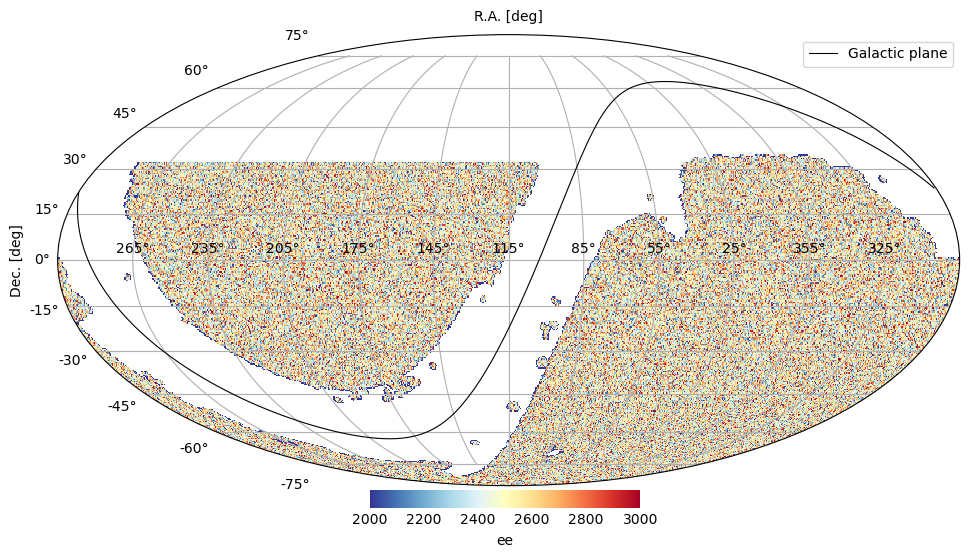

In [ ]:
utils.plot_moll(hpmap_rd, rot=115, min=2000, max=3000, desi_footprint=False, fourmost_footprint=False, label='ee')

In [ ]:
hpmap_rd_maskfp = hpmap_rd.copy()
hpmap_rd_w_maskfp = hpmap_rd_w.copy()
hpmap_rd_maskfp[hpmap==0] = 0 
hpmap_rd_w_maskfp[hpmap==0] =0
utils.plot_moll(hpmap_rd_maskfp, hpmap_rd_w_maskfp, rot=115, min=0, max=0.2, desi_footprint=False, fourmost_footprint=True)

IndexError: boolean index did not match indexed array along dimension 0; dimension is 786432 but corresponding boolean dimension is 196608

Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']


In [ ]:
import healpy as hp 
from time import time
def pixweight(randoms, density, nobsgrz=[0, 0, 0], nside=256,
              outarea=True, maskbits=None):
    """Fraction of area covered in HEALPixels by a random catalog.

    Parameters
    ----------
    randoms : :class:`~numpy.ndarray` or `str`
        A random catalog as made by, e.g., :func:`select_randoms()` or
        :func:`quantities_at_positions_in_a_brick()`, or a file that
        contains such a catalog. Must contain the columns RA, DEC,
        NOBS_G, NOBS_R, NOBS_Z, MASKBITS.
    density : :class:`int`
        The number of random points per sq. deg. At which the random
        catalog was generated (see also :func:`select_randoms()`).
    nobsgrz : :class:`list`, optional, defaults to [0,0,0]
        The number of observations in each of g AND r AND z that must
        be EXCEEDED to include a random point in the count. The default
        is to include areas that have at least one observation in each
        band ([0,0,0]). `nobsgrz = [0,-1,-1]` would count areas with at
        least one (more than zero) observations in g-band but any number
        of observations (more than -1) in r-band and z-band.
    nside : :class:`int`, optional, defaults to nside=256
        The resolution (HEALPixel NESTED nside number) at which to build
        the map (default nside=256 is ~0.0525 sq. deg. or "brick-sized")
    outarea : :class:`boolean`, optional, defaults to True
        Print the total area of the survey for passed values to screen.
    maskbits : :class:`int`, optional, defaults to ``None``
        If not ``None`` then restrict to only locations with these
        values of maskbits NOT set (bit inclusive, so for, e.g., 7,
        restrict to random points with none of 2**0, 2**1 or 2**2 set).

    Returns
    -------
    :class:`~numpy.ndarray`
        The weight for EACH pixel in the sky at the passed nside.

    Notes
    -----
    - `WEIGHT=1` means >=1 pointings across the entire pixel.
    - `WEIGHT=0` means zero observations within it (e.g., perhaps
      the pixel is completely outside of the LS DR footprint).
    - `0 < WEIGHT < 1` for pixels that partially cover the LS DR
      area with one or more observations.
    - The index of the returned array is the HEALPixel integer.
    """
    # ADM if a file name was passed for the random catalog, read it in.
    start=time()
    if isinstance(randoms, str):
        randoms = fitsio.read(randoms)

    # ADM extract the columns of interest
    ras, decs = randoms["RA"], randoms["DEC"]
    nobs_g = randoms["NOBS_G"]
    nobs_r = randoms["NOBS_R"]
    nobs_z = randoms["NOBS_Z"]

    # ADM only retain points with one or more observations in all bands
    # ADM and appropriate maskbits values.
    ii = (nobs_g > nobsgrz[0])
    ii &= (nobs_r > nobsgrz[1])
    ii &= (nobs_z > nobsgrz[2])

    # ADM also restrict to appropriate maskbits values, if passed.
    if maskbits is not None:
        mb = randoms["MASKBITS"]
        for mb_num in maskbits:
            ii &= (mb & mb_num) == 0

    # ADM the counts in each HEALPixel in the survey.
    if np.sum(ii) > 0:
        pixnums = hp.ang2pix(nside, np.radians(90.-decs[ii]),
                             np.radians(ras[ii]), nest=True)
        pixnum, pixcnt = np.unique(pixnums, return_counts=True)
    else:
        msg = "zero area based on randoms with passed constraints"
        log.error(msg)
        raise ValueError

    # ADM whole-sky-counts to retain zeros for zero survey coverage.
    npix = hp.nside2npix(nside)
    pix_cnt = np.bincount(pixnum, weights=pixcnt, minlength=npix)

    # ADM expected area based on the HEALPixels at this nside.
    expected_cnt = hp.nside2pixarea(nside, degrees=True)*density
    # ADM weight map based on (actual counts)/(expected counts).
    pix_weight = pix_cnt/expected_cnt

    # ADM if requested, print the total area of the survey to screen.
    if outarea:
        area = np.sum(pix_weight*hp.nside2pixarea(nside, degrees=True))
        if maskbits is None:
            print('Area of survey with NOBS > {} in [g,r,z] = {:.2f} sq. deg.'
                     .format(nobsgrz, area))
        else:
            print(
                'Area, NOBS > {} in [g,r,z], maskbits of {} = {:.2f} sq. deg.'
                .format(nobsgrz, maskbits, area))

    print('Done...t = {:.1f}s'.format(time()-start))

    return pix_weight

In [ ]:
piw_weight = pixweight(rd, 2500, nobsgrz=[0, 0, 0], nside=256, outarea=True, maskbits=[1,12,13])

Area, NOBS > [0, 0, 0] in [g,r,z], maskbits of [1, 12, 13] = 19315.67 sq. deg.
Done...t = 7.7s


In [ ]:
vmin, vmax = np.quantile(piw_weight[piw_weight!=0], q=[0.02,0.98])

In [ ]:
(hpmap > 0).sum()

379764

In [ ]:
keep_to_train = (piw_weight > 0) & (hpmap > 0) & (hpmap_mask!=0)


Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']
Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']


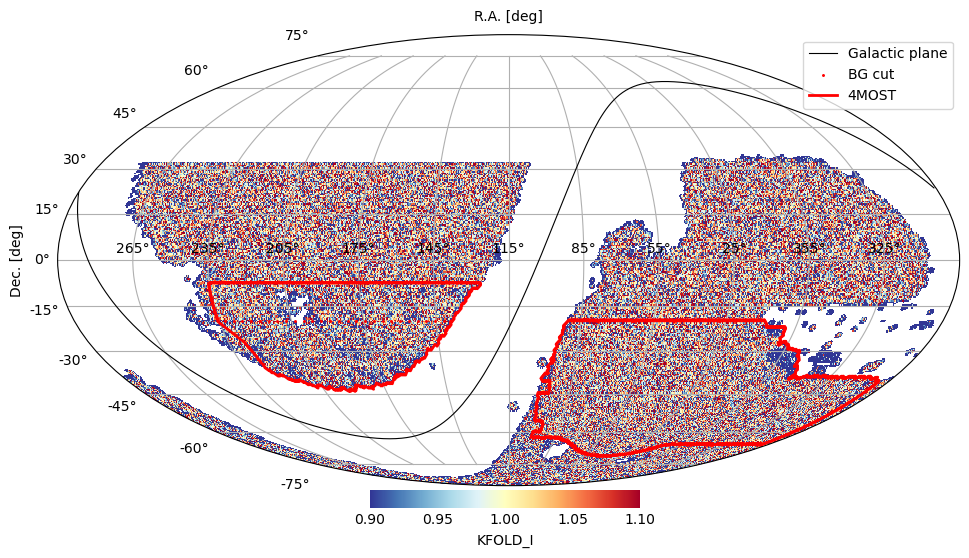

Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']


In [ ]:
utils.plot_moll(piw_weight, rot=115, min=0.9, max=1.1, desi_footprint=False, fourmost_footprint=True, label=col, nest=True)

In [ ]:
EBV

/global/u1/a/arocher/Code/postdoc/4MOST/utils.py:632: RuntimeWarning: invalid value encountered in divide
  m = hp.ma(hmap) if whmap is None else hp.ma(whmap/hmap)


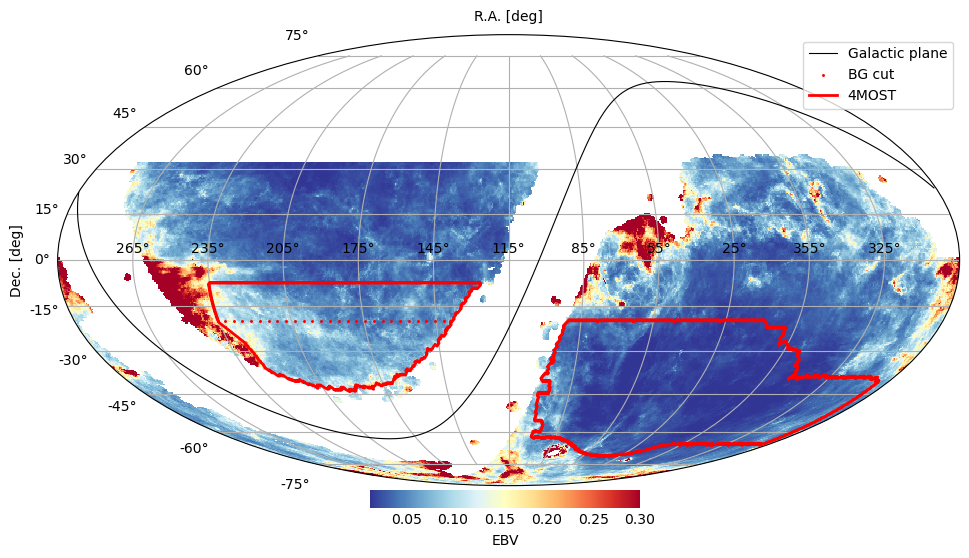

/tmp/ipykernel_1379345/1904221562.py:10: RuntimeWarning: invalid value encountered in divide
  feature_maps[col] = hpmap2/hpmap


EBV


/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/code/mpytools/main/lib/python3.10/site-packages/mpytools/core.py:542: RuntimeWarning: divide by zero encountered in divide
  results = super().__array_ufunc__(ufunc, method, *args, **kwargs)
/global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/code/mpytools/main/lib/python3.10/site-packages/mpytools/core.py:542: RuntimeWarning: invalid value encountered in subtract
  results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


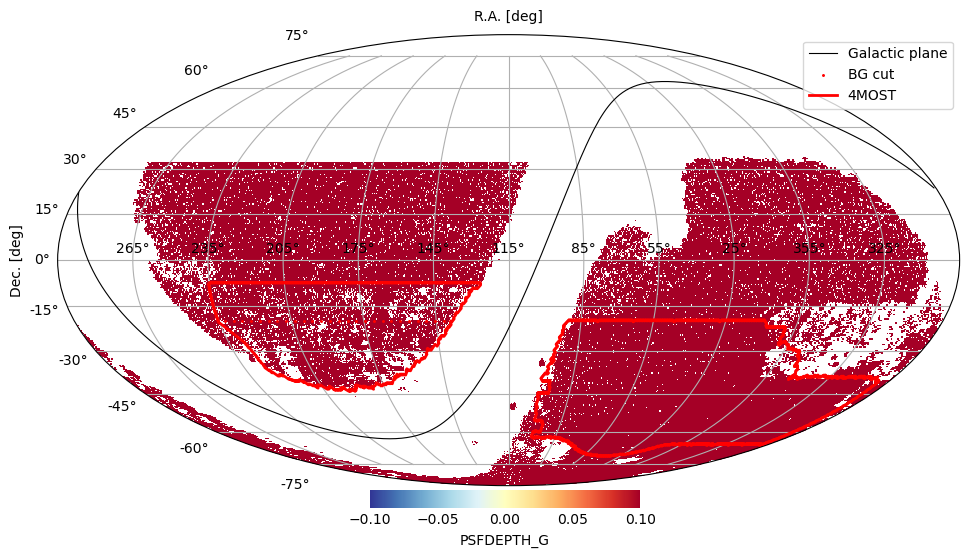

PSFDEPTH_G


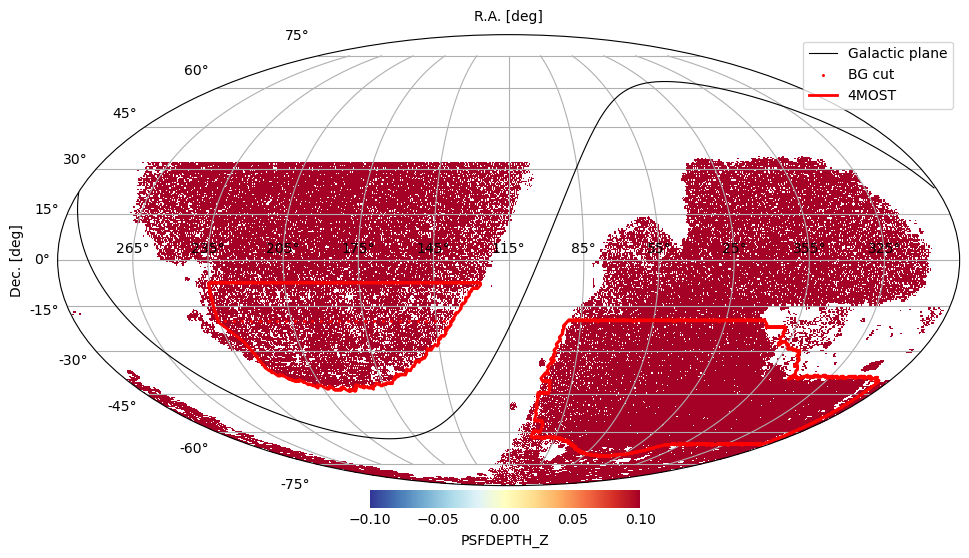

PSFDEPTH_Z


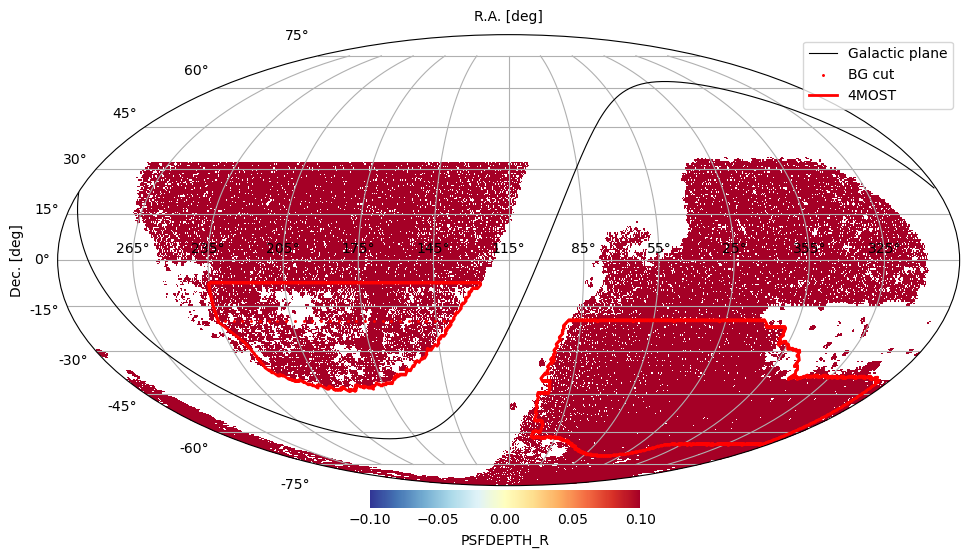

PSFDEPTH_R


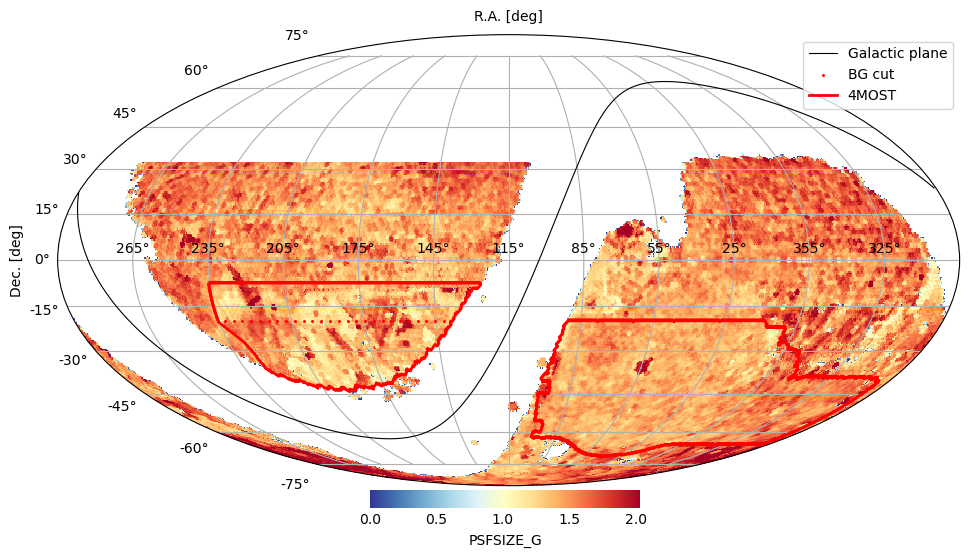

PSFSIZE_G


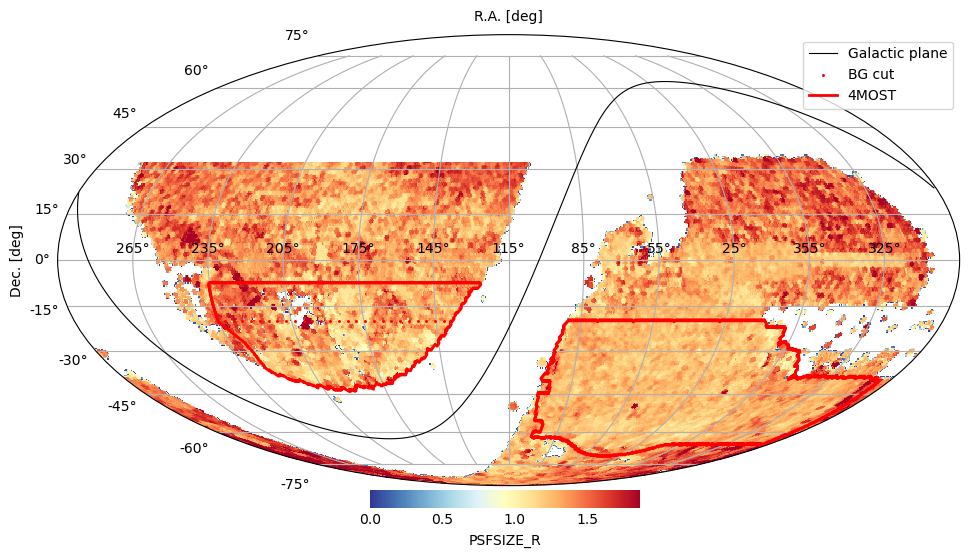

PSFSIZE_R


KeyboardInterrupt: 

In [ ]:
cols = ['EBV', 'PSFDEPTH_G', 'PSFDEPTH_Z', 'PSFDEPTH_R', 'PSFSIZE_G', 'PSFSIZE_R', 'PSFSIZE_Z', 'GALDEPTH_G', 'GALDEPTH_Z', 'GALDEPTH_R' ]
feature_maps = {}
nside=256
for col in cols:
    val_col = rd[col]
    val_min, val_max = np.quantile(val_col, q=[0.02,0.98])
    hpmap = utils.create_hp_map(rd['RA'], rd['DEC'], nside=nside)
    hpmap2 = utils.create_hp_map(rd['RA'], rd['DEC'], weight=val_col, nside=nside)
    utils.plot_moll(hpmap, hpmap2, rot=115, min=val_min, max=val_max, desi_footprint=False, fourmost_footprint=True, label=col)
    feature_maps[col] = hpmap2/hpmap
    print(col)

Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']


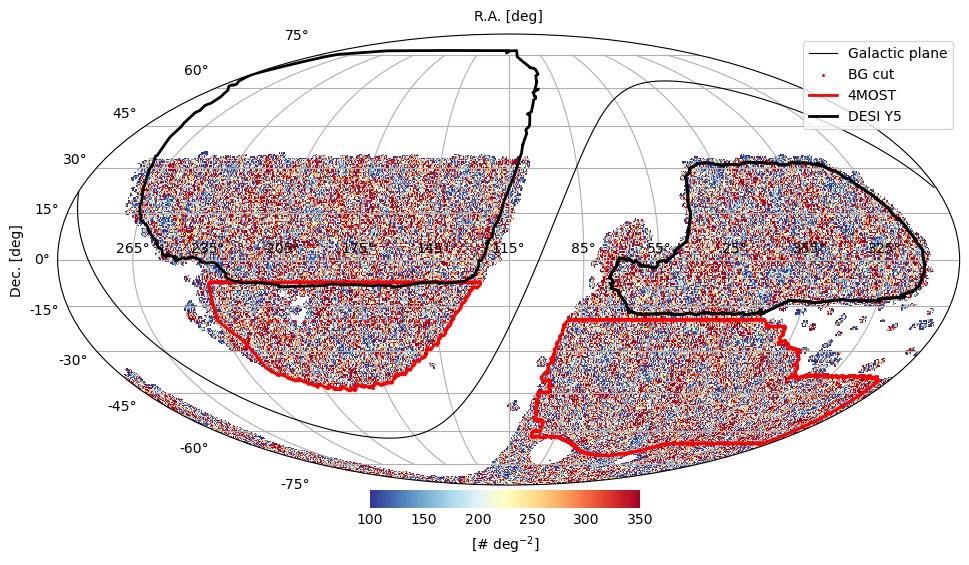

In [ ]:
hpmap = utils.create_hp_map(target_4m_bg['RA'], target_4m_bg['DEC'], nside=256)
utils.plot_moll(hpmap, rot=115, min=100, max=350, desi_footprint=True, fourmost_footprint=True)

/global/u1/a/arocher/Code/postdoc/4MOST/utils.py:632: RuntimeWarning: invalid value encountered in divide
  m = hp.ma(hmap) if whmap is None else hp.ma(whmap/hmap)


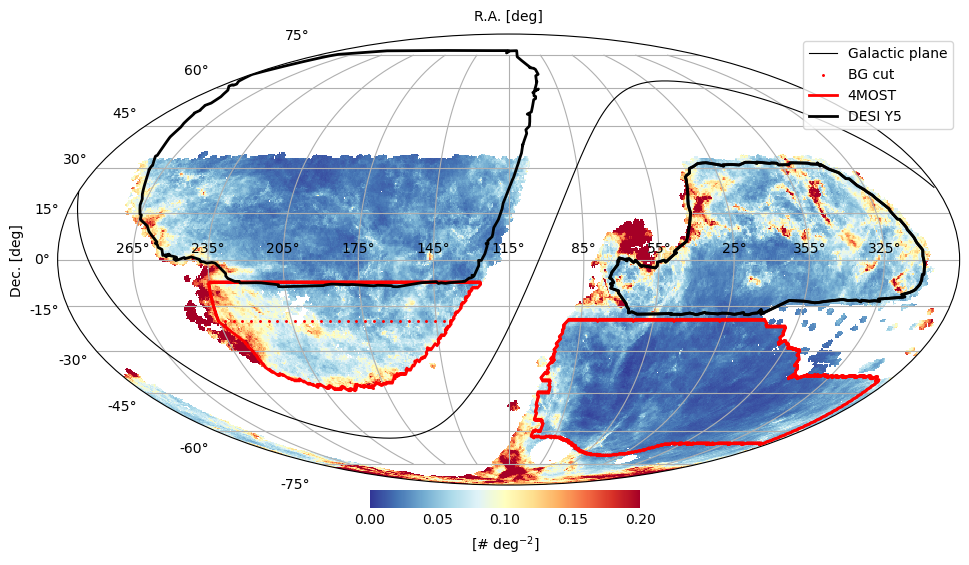

Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']
Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']
Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']
Bad pipe message: %s [b'2\r\nAccept: application/openme

In [ ]:
hpmap_ebv = utils.create_hp_map(target_4m_bg['RA'], target_4m_bg['DEC'], weight=target_4m_bg['EBV'], nside=256)
utils.plot_moll(hpmap, hpmap_ebv, rot=115, min=0, max=0.2, desi_footprint=True, fourmost_footprint=True)

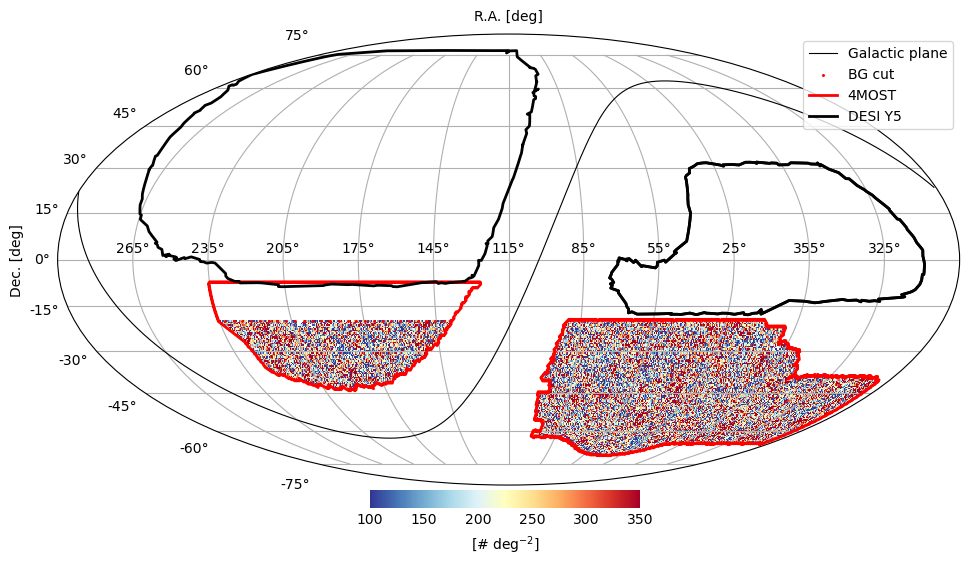

In [ ]:
hpmap_mask = utils.create_hp_map(target_4m_bg['RA'][mask_s8fp], target_4m_bg['DEC'][mask_s8fp], nside=256)
utils.plot_moll(hpmap_mask, rot=115, min=100, max=350, desi_footprint=True, fourmost_footprint=True)

In [ ]:
np.nan_to_num(hpmap_ebv/hpmap)

array([0., 0., 0., ..., 0., 0., 0.])

In [ ]:
from sklearn.linear_model import LinearRegression

keep_to_train = (piw_weight > 0) & (hpmap > 0) & (hpmap_mask!=0)

regressor = LinearRegression()
X_train = (hpmap_ebv/hpmap)[keep_to_train]
X_train = X_train.reshape(X_train.size,1)
Y_train = hpmap[keep_to_train]
params={}
regressor.set_params(**params)
regressor.fit(X_train, Y_train)
X = (hpmap_ebv/hpmap)[hpmap>0]
X = X.reshape(X.size,1)
Y_pred = regressor.predict(X)


/tmp/ipykernel_1426015/2194818613.py:6: RuntimeWarning: invalid value encountered in divide
  X_train = (hpmap_ebv/hpmap)[keep_to_train]
/tmp/ipykernel_1426015/2194818613.py:12: RuntimeWarning: invalid value encountered in divide
  X = (hpmap_ebv/hpmap)[hpmap>0]


In [ ]:
Y_pred

array([243.56070128, 243.56589811, 243.5631533 , ..., 242.8529842 ,
       242.78487889, 242.89103104])

Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']


In [ ]:
LinearRegression._validate_params??

Signature: LinearRegression._validate_params(self)
Source:   
    def _validate_params(self):
        """Validate types and values of constructor parameters

        The expected type and values must be defined in the `_parameter_constraints`
        class attribute, which is a dictionary `param_name: list of constraints`. See
        the docstring of `validate_parameter_constraints` for a description of the
        accepted constraints.
        """
        validate_parameter_constraints(
            self._parameter_constraints,
            self.get_params(deep=False),
            caller_name=self.__class__.__name__,
        )
File:      /global/common/software/desi/users/adematti/perlmutter/cosmodesiconda/20240118-1.0.0/conda/lib/python3.10/site-packages/sklearn/base.py
Type:      function

Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']
Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']
Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']
Bad pipe message: %s [b'2\r\nAccept: application/openme

array([[0.02444255],
       [0.02221227],
       [0.01960293],
       ...,
       [0.02740715],
       [0.03195303],
       [0.03961511]])

Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']


In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression

X = np.array([[1, 1], [1, 2], [2, 2], [2, 3]])
# y = 1 * x_0 + 2 * x_1 + 3
y = np.dot(X, np.array([1, 2])) + 3
reg = LinearRegression().fit(X, y)
reg.score(X, y)
reg.coef_
reg.predict(np.array([[3, 5]]))


array([16.])

Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']


In [ ]:
y

array([ 6,  8,  9, 11])

Bad pipe message: %s [b'2\r\nAccept: application/openmetrics-text;version=']
Bad pipe message: %s [b'0.0;q=0.5,application/openmetrics-text;version=0']
Bad pipe message: %s [b'.1;q=0.4,text/plain;version=0.0.4;q=0.3,*/*;q']
Bad pipe message: %s [b'.2\r\nAccept-Encoding: gzip\r\nX-Prometheus-Scrape-Timeout-Secon']


In [ ]:
class Regression(object):

    """Implementation of template fitting regression."""

    def __init__(self, dataframe, regressor='RF', suffix_regressor='', feature_names=None, use_kfold=True,
                 regressor_params=None, nfold_params=None, compute_permutation_importance=True,
                 overwrite=False, save_regressor=False, n_jobs=6, seed=123):
        """
        Initialize :class:`Regression`, i.e. train input ``regressor`` on input ``dataframe``.

        Parameters
        ----------
        dataframe : DataFrame
            Data frame containing all the information to fit/train the regressor.
        regressor : str, scikit-learn Regressor
            Either "RF" (random forest), "NN" (multi layer perceptron), "Linear", or scikit-learn Regressor class or instance.
        suffix_regressor: str
            Additional suffix for regressor. Used only for output directory / names. Useful to compare same regressor with different hyperparameters or features.
        feature_names : list of str, default=None
            Names of features used during the regression. By default get feature names from :func:`_get_feature_names`.
        use_kfold : bool, default=True
            If ``True`` use k-fold to fit/predict target density. It is mandatory with RF and NN to avoid strong overfitting.
        regressor_params : dict, default=None
            Dictionary specific hyperparameters to update the default values loaded in _get_rf_params / _get_mlp_params / _get_linear_params.
            Can be provided as a single dictionary, applicable to all regions, or as a dictionary containing parameters for each region of :attr:`dataframe.regions`.
        compute_permutation_importance : bool, default=True
            Compute and plot the permutation importance for inspection. It has to be compared with giny importance from RF regressor.
        overwrite : bool, default=False
            If ``True`` and the output directory :attr:`dataframe.output_dir` is set, overwrite files (if they exist).
            If ``False``, and :attr:`dataframe.output_dir` exists, an error is raised.
        save_regressor : bool, default=False
            If ``True`` regressor for each region and each fold is saved. Warning: it is space consuming. Can be useful to make some more advanced plots.
        n_jobs : int, default=6
            To parallelize the RF training.
        seed : int, default=123
            Fix the random state of RF and NN for reproducibility.
        """
        if getattr(dataframe, 'density', None) is None: dataframe.build()
        self.dataframe = dataframe

        if feature_names is None:
            self.feature_names = _get_feature_names(dataframe.tracer)
        else:
            self.feature_names = utils.unique_list(feature_names)
        logger.info(f"We use the set of features: {self.feature_names}")

        # set up the parameter for the considered regressor
        self.use_kfold = use_kfold
        if not self.use_kfold:
            logger.warning("k-fold training not used")

        self.regressor_params = _format_regressor_params(regressor_params or {}, regions=self.dataframe.regions)
        self.regressor = regressor
        self.suffix_regressor = suffix_regressor

        if isinstance(regressor, str):
            self.regressor_name = regressor
            if self.regressor_name.upper() == 'RF':
                self.regressor = RandomForestRegressor()
                self.regressor_params = _get_rf_params(self.regressor_params, n_jobs, seed, regions=self.dataframe.regions)
                self.normalized_feature, self.use_sample_weight = False, True
            elif self.regressor_name.upper() == 'NN':
                self.regressor = MLPRegressor()
                self.regressor_params = _get_mlp_params(self.regressor_params, seed, regions=self.dataframe.regions)
                self.normalized_feature, self.use_sample_weight = True, False
            elif self.regressor_name.upper() == 'LINEAR':
                self.regressor = LinearRegression()
                self.regressor_params = _get_linear_params(self.regressor_params, regions=self.dataframe.regions)
                self.normalized_feature, self.use_sample_weight = True, True
            else:
                raise ValueError(f'Unknown regressor {regressor}. Choices are ["RF", "NN", "LINEAR"].')
        else:
            self.regressor_name = self.regressor.__class__.__name__

        # in NN and Linear case, we normalize and standardize the data
        # STREAM is already normalized remove it from the list
        if self.regressor_name.upper() != 'RF':
            self.feature_names_to_normalize = self.feature_names.copy()
            if 'STREAM' in self.feature_names_to_normalize: self.feature_names_to_normalize.remove('STREAM')
        else:
            self.feature_names_to_normalize = None

        self.compute_permutation_importance = compute_permutation_importance
        self.save_regressor = save_regressor
        self.nfold = _get_nfold_params(nfold_params, regions=self.dataframe.regions)

        # If not self.dataframe.output is None --> save figure and info !!
        if self.dataframe.output_dir is not None:
            # create the corresponding output folder --> put here since self.regressor_name can be update with use_kfold = False
            if os.path.isdir(os.path.join(self.dataframe.output_dir, self.regressor_name + self.suffix_regressor)):
                if not overwrite:
                    raise ValueError(f"{os.path.join(self.dataframe.output_dir, self.regressor_name+self.suffix_regressor)} already exists and overwrite is set as {overwrite}")
                logger.warning(f"Overwriting {os.path.join(self.dataframe.output_dir, self.regressor_name+self.suffix_regressor)}")
                logger.warning(f"Please remove the output folder to have a clean output: rm -rf {os.path.join(self.dataframe.output_dir, self.regressor_name+self.suffix_regressor)}")
            else:
                logger.info(f"The output folder {os.path.join(self.dataframe.output_dir, self.regressor_name+self.suffix_regressor)} is created")
            utils.mkdir(os.path.join(self.dataframe.output_dir, self.regressor_name + self.suffix_regressor))
        self.run()

    def run(self):
        """
        Predict the density with the provided engine and hyperparameters.
        If :attr:`use_kfold`, k-fold training is performed, based on patches of 52 deg^2.
        Some plots for inspection and the k-fold indices (if relevant) are saved the output directory of :attr:`dataframe` if provided.
        """
        # To store the result of the regression i.e. Y_pred
        Y_pred = np.zeros(self.dataframe.pixels.size)
        fold_index = dict()

        for region in self.dataframe.regions:
            if self.dataframe.output_dir is not None:
                save_info = True
                save_dir = os.path.join(self.dataframe.output_dir, self.regressor_name + self.suffix_regressor, region)
                utils.mkdir(save_dir)
            else:
                save_info = False
                save_dir = None

            zone = self.dataframe.footprint(region)  # mask array

            logger.info(f"  ** {region} :")
            X = self.dataframe.features[region][self.feature_names][zone]
            Y = self.dataframe.density[zone]
            keep_to_train_zone = self.dataframe.keep_to_train[zone]
            pixels_zone = self.dataframe.pixels[zone]

            logger.info(f"    --> Sample size {region}: {keep_to_train_zone.sum()} -- Total sample size: {self.dataframe.keep_to_train.sum()} -- Training fraction: {keep_to_train_zone.sum()/self.dataframe.keep_to_train.sum():.2%}")
            logger.info(f"    --> Use k-fold training ? {self.use_kfold}")
            params = self.regressor_params[region]
            logger.info(f"    --> Engine: {self.regressor_name} with params: {params}")
            if params:
                self.regressor.set_params(**params)

            if self.use_kfold:
                size_group = 1000 * (self.dataframe.nside / 256)**2  # define to have ~ 52 deg**2 for each patch (ie) group
                Y_pred[zone], fold_index[region] = self.fit_and_predict_on_kfold(self.regressor, self.nfold[region], size_group, X, Y, pixels_zone, self.dataframe.nside, keep_to_train_zone,
                                                                                 use_sample_weight=self.use_sample_weight, feature_names=self.feature_names, feature_names_to_normalize=self.feature_names_to_normalize,
                                                                                 compute_permutation_importance=self.compute_permutation_importance,
                                                                                 save_regressor=self.save_regressor, save_info=save_info, save_dir=save_dir)
            else:
                Y_pred[zone] = self.fit_and_predict(self.regressor, X[keep_to_train_zone], Y[keep_to_train_zone], X, Y_eval=Y, use_sample_weight=self.use_sample_weight,
                                                    feature_names=self.feature_names, feature_names_to_normalize=self.feature_names_to_normalize,
                                                    compute_permutation_importance=self.compute_permutation_importance,
                                                    save_regressor=self.save_regressor, save_info=save_info, save_dir=save_dir)
                fold_index = None

        # save evalutaion and fold_index
        self.Y_pred = Y_pred  # Y_pred for every entry in each zone
        self.fold_index = fold_index  # fold_index --> useful to save if we want to reapply the regressor

        if save_info and fold_index is not None:
            logger.info(f"    --> Save k-fold index in {os.path.join(self.dataframe.output_dir, self.regressor_name+self.suffix_regressor, f'kfold_index.joblib')}")
            dump(self.fold_index, os.path.join(self.dataframe.output_dir, self.regressor_name + self.suffix_regressor, 'kfold_index.joblib'))
            
            
            
    @classmethod
    def fit_and_predict(cls, regressor, X_train, Y_train, X_eval, Y_eval=None, use_sample_weight=False,
                        feature_names=None, feature_names_to_normalize=None, compute_permutation_importance=False,
                        save_regressor=False, save_info=False, save_dir='', suffix=''):

        """
        Perform the training of the regressor with (X_train, Y_train) and evaluate it in ``X_eval``.
        ``Y_eval`` is only used to plot efficiency and permutation importance if required.

        Parameters
        ----------
        regressor : scikit-learn Regressor
            Regressor instance used to perform the regression.
            The regressor will be fitted with ``(X_train, Y_train)`` and will be evaluated at ``X_eval``.
        X_train : array like
            Data frame used for the training.
        Y_train : array like
            Target for ``X_train``.
        X_eval : array like
            Data frame used for the evaluation.
        Y_eval : array like, default=None
            Target for ``X_eval``. Only if ``save_info`` is ``True``.
        use_sample_weight : bool, default=False
            If ``True`` use ``1/np.sqrt(Y_train)`` as weight during the regression. Only available for RF or LINEAR.
        feature_names : array like, default=None
            Names of features used during the regression. It is used for plotting information. Only used if ``save_info`` is ``True``.
        feature_names_to_normalize : array like, default=None
            Names of features to normalize ; mandatory for LINEAR or NN regression. 'STREAM' feature is already normalized; do not normalize it again.
        compute_permutation_importance : bool, default=False
            If ``True`` compute and plot the permutation importance. Only if ``save_info`` is ``True``.
        save_regressor : bool, default=False
            If ``True`` save each regressor. Take care it is memory space consumming especially for RF. Only available if ``save_info`` is ``True``.
        save_info : bool, default=False
            If ``True`` save inspection plots and if it is required in ``save_regressor``, the fitted regressor in ``save_dir``.
        save_dir : str, default=''
            Directory path where the files will be saved if required with ``save_info``.
        suffix : str, default=''
            Suffix used to save output.

        Returns
        -------
        Y_pred: array like
            Returns the evaluation of the regression on ``X_eval`` with fitting done on ``(X_train, Y_train)``. It has the same size of ``X_eval``.
        """
        if feature_names_to_normalize:
            logger.info("          --> All features (except the STREAM) are normalized and centered on the training footprint")
            mean, std = X_train[feature_names_to_normalize].mean(), X_train[feature_names_to_normalize].std()
            X_for_training = X_train.copy()
            X_for_training[feature_names_to_normalize] = (X_train[feature_names_to_normalize] - mean) / std
            X_eval[feature_names_to_normalize] = (X_eval[feature_names_to_normalize] - mean) / std
            logger.info(f"          --> Mean of mean and std on the fold-training features: {X_for_training[feature_names_to_normalize].mean().mean():2.4f} -- {X_for_training[feature_names_to_normalize].std().mean():2.2f}")
        else:
            logger.info("          --> Features are not normalized")
            X_for_training = X_train.copy()

        if use_sample_weight:
            logger.info("          --> The training is done with sample_weight = 1/np.sqrt(Y_train)")
            regressor.fit(X_for_training, Y_train, sample_weight=1 / np.sqrt(Y_train))
        else:
            regressor.fit(X_for_training, Y_train)

        Y_pred = regressor.predict(X_eval)

        if save_info:
            # Save regressor
            if save_regressor:
                dump(regressor, os.path.join(save_dir, f'regressor{suffix}.joblib'))

            cls.plot_efficiency(Y_eval, Y_pred, os.path.join(save_dir, f"kfold_efficiency{suffix}.png"))

            # for more complex plot as importance feature ect ..--> save regressor and
            if hasattr(regressor, 'feature_importances_'):
                cls.plot_importance_feature(regressor, feature_names, os.path.join(save_dir, f"feature_importance{suffix}.png"))

            if compute_permutation_importance:
                cls.plot_permutation_importance(regressor, X_eval, Y_eval, feature_names, os.path.join(save_dir, f"permutation_importance{suffix}.png"))

        return Y_pred

In [2]:
target_4m_lrg = Catalog.read(glob.glob('/pscratch/sd/a/arocher/4MOST/target_lrg_4most_v2.fits'))
mask_pixmap = Catalog.read('/pscratch/sd/e/edmondc/antoine/Legacy_Imaging_DR10_footprint_128.fits')
features_pixmap = Catalog.read('/pscratch/sd/e/edmondc/antoine/pixweight-dr10-128-new.fits')

In [ ]:
euclid_fp = Catalog.read('../rsd2024a-footprint-equ-13.fits')

In [ ]:
import healpy as hp 
hp.npix2nside(euclid_fp['M'].size)

8192

In [ ]:
hp.pix2ang(8192, np.arange(8192), lonlat=True)

(array([ 45.      , 135.      , 225.      , ..., 176.484375, 177.890625,
        179.296875]),
 array([89.99428933, 89.99428933, 89.99428933, ..., 89.6345165 ,
        89.6345165 , 89.6345165 ]))

In [ ]:
tt = np.ones(euclid_fp['M'].size)
tt[euclid_fp['M'] == 0] = 0

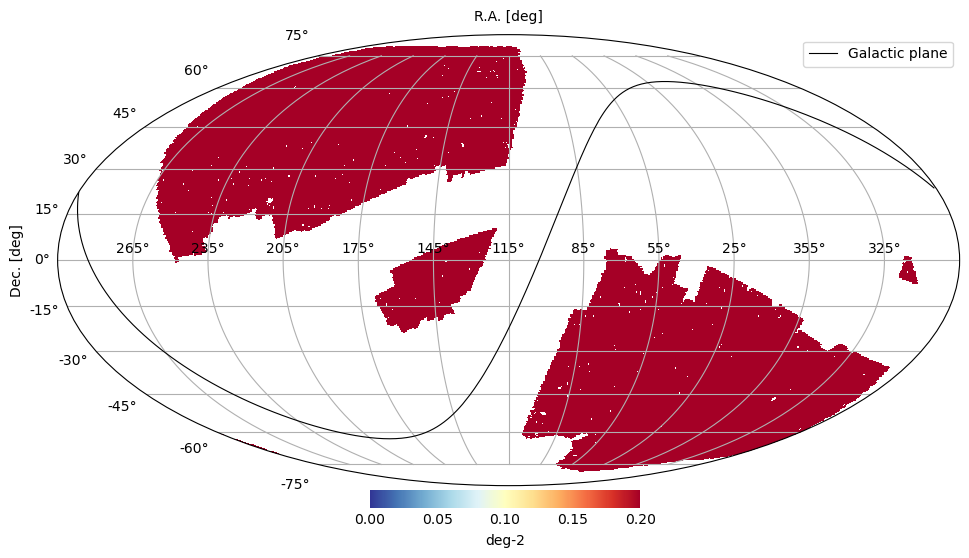

In [ ]:
utils.plot_moll(tt, rot=115, min=0., max=0.2, desi_footprint=False, fourmost_footprint=False, label='deg-2', nest=False, euclid_fp=False)


In [3]:
def apply_mask_hp(hpmap, mask):
    hpmap_mask = hpmap.copy()
    hpmap_mask[~mask] = 0
    return hpmap_mask


dr10_obs = apply_mask_hp(features_pixmap['EBV'], mask_pixmap['ISDR10'] & mask_pixmap['IS4MOST_LRG'] )

In [18]:
dr10_obs = apply_mask_hp(features_pixmap['PSFDEPTH_R'], mask_pixmap['ISDR10'] & ~mask_pixmap['ISDES'] )

In [21]:
features_pixmap['PSFDEPTH_R']

array([2181.3005 1697.542  1962.1351 ... 1356.7255 1354.9602 1239.4882])

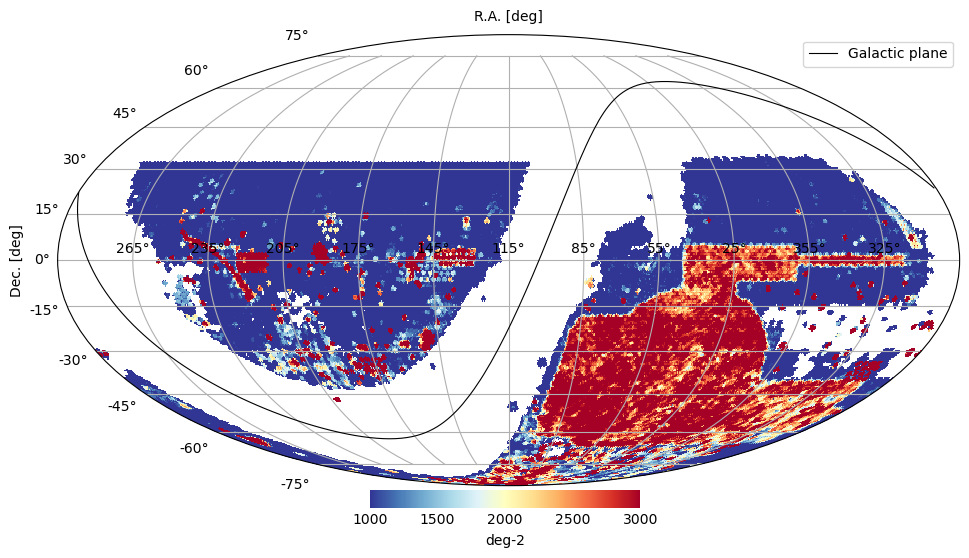

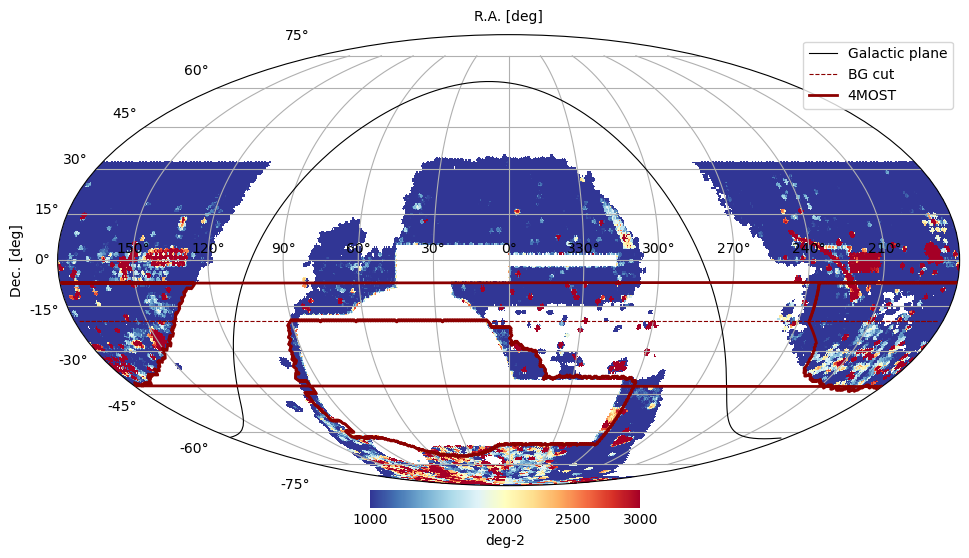

In [23]:
utils.plot_moll(features_pixmap['PSFDEPTH_R'], rot=115, min=1000, max=3000, desi_footprint=False, fourmost_footprint=False, label='deg-2', nest=True, euclid_fp=False)
utils.plot_moll(dr10_obs, rot=0, min=1000, max=3000, desi_footprint=False, fourmost_footprint=True, label='deg-2', nest=True)


In [5]:
import healpy as hp

array([     0      1      2 ... 196605 196606 196607])

array([97600 97088 97087 ... 99520 99519 99008])

/tmp/ipykernel_396446/4168936055.py:1: RuntimeWarning: invalid value encountered in divide
  utils.plot_moll((hpmap2/hpmap)[hp.nest2ring(128, features_pixmap['HPXPIXEL'])], dr10_obs, rot=115, min=0.95, max=1.05, desi_footprint=False, fourmost_footprint=True, label='EBV', nest=True)


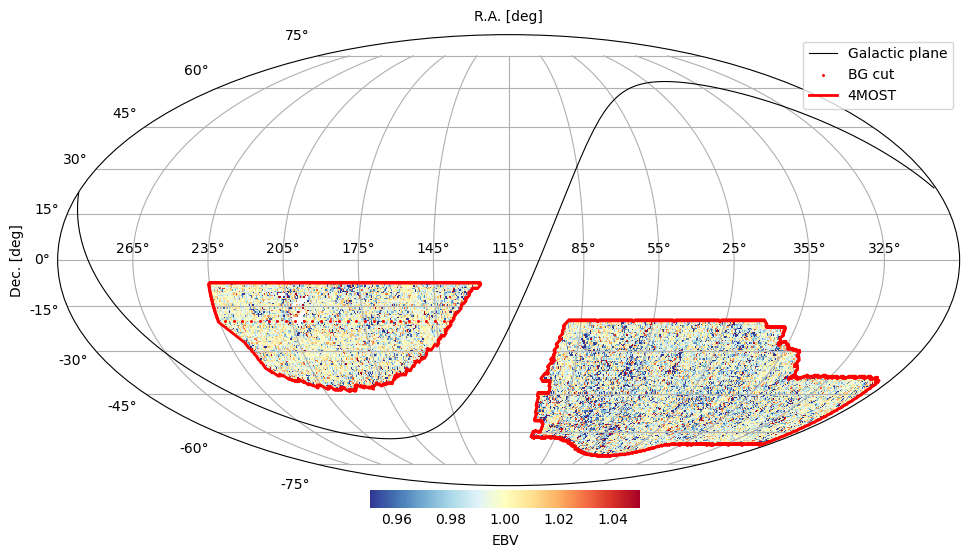

In [ ]:
utils.plot_moll((hpmap2/hpmap)[hp.nest2ring(128, features_pixmap['HPXPIXEL'])], dr10_obs, rot=115, min=0.95, max=1.05, desi_footprint=False, fourmost_footprint=True, label='EBV', nest=True)


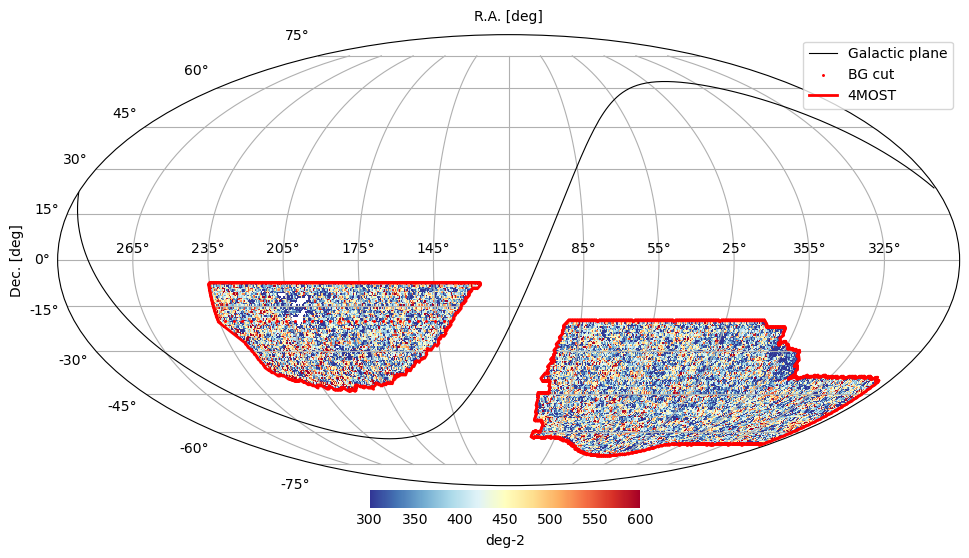

/global/u1/a/arocher/Code/postdoc/4MOST/4MOST_CRS_tools/utils.py:633: RuntimeWarning: invalid value encountered in divide
  m = hp.ma(hmap) if whmap is None else hp.ma(whmap/hmap)


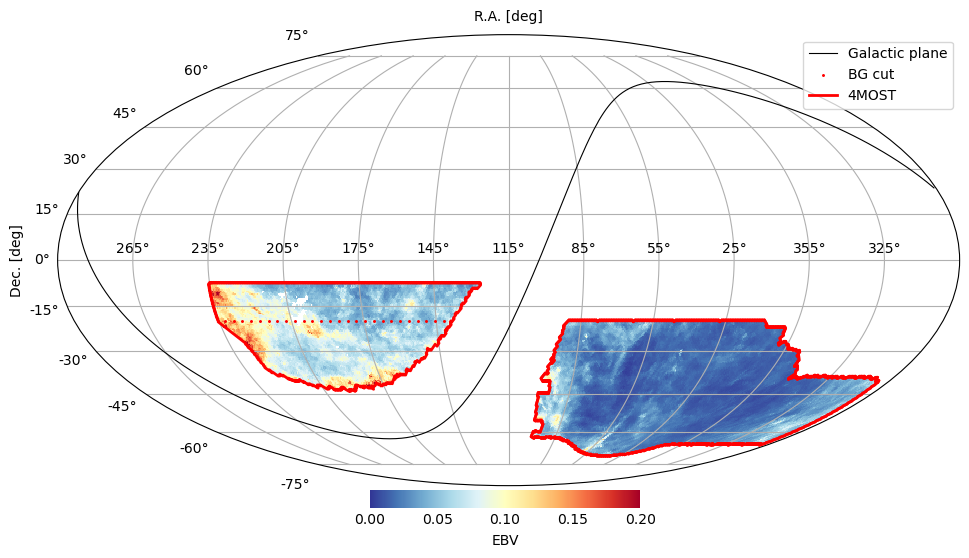

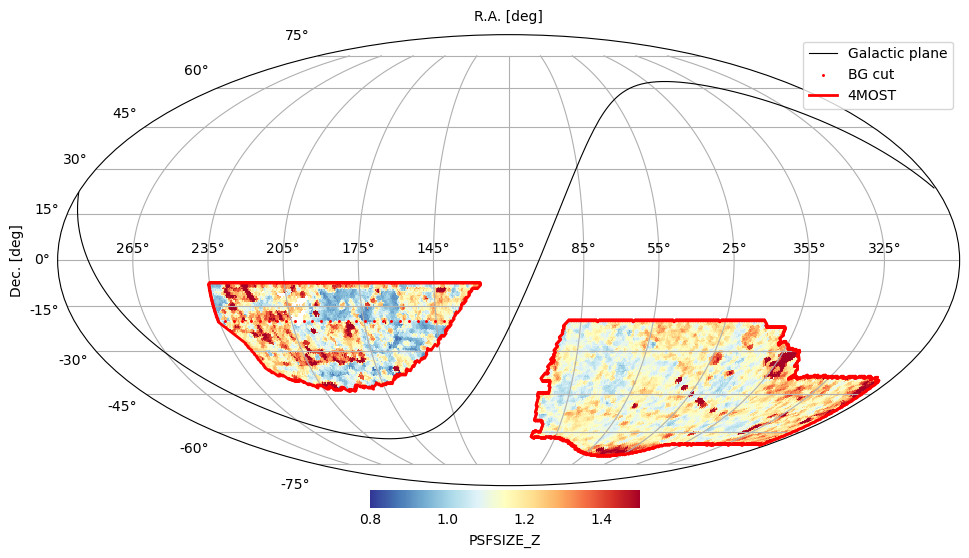

In [ ]:
nside=128 
hpmap = utils.create_hp_map(target_4m_lrg['RA'][target_4m_lrg['isfoots8']], target_4m_lrg['DEC'][target_4m_lrg['isfoots8']], nside=nside)
hpmap2 = utils.create_hp_map(target_4m_lrg['RA'][target_4m_lrg['isfoots8']], target_4m_lrg['DEC'][target_4m_lrg['isfoots8']], weight=target_4m_lrg['EBV'][target_4m_lrg['isfoots8']], nside=nside)

hpmap3 = utils.create_hp_map(target_4m_lrg['RA'][target_4m_lrg['isfoots8']], target_4m_lrg['DEC'][target_4m_lrg['isfoots8']], weight=target_4m_lrg['PSFSIZE_Z'][target_4m_lrg['isfoots8']], nside=nside)

utils.plot_moll(hpmap, rot=115, min=300, max=600, desi_footprint=False, fourmost_footprint=True, label='deg-2')
utils.plot_moll(hpmap,hpmap2, rot=115, min=0, max=0.2, desi_footprint=False, fourmost_footprint=True, label='EBV')
utils.plot_moll(hpmap,hpmap3, rot=115, min=0.8, max=1.5, desi_footprint=False, fourmost_footprint=True, label='PSFSIZE_Z')

#utils.plot_moll(Y_pred,hpmap, rot=115, min=0, max=2, desi_footprint=False, fourmost_footprint=True, label='EBV')
#feature_maps[col] = hpmap2/hpmap

In [ ]:
np.quantile(fracarea[fracarea>0], q=0.05)

0.7776539176702499

In [5]:
#Linear reg
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GroupKFold
from sklearn.ensemble import RandomForestRegressor
import healpy as hp

def run_regression(regressor, X_train, Y_train, X_eval, normalize=True):
    X_for_training = X_train.copy()
    if normalize:
        mean, std = X_train.mean(axis=0), X_train.std(axis=0)
        X_for_training = (X_train - mean) / std
        X_eval = (X_eval - mean) / std
    regressor.fit(X_for_training, Y_train)
    Y_pred = regressor.predict(X_eval)
    return Y_pred


def build_kfold(kfold, pixels, groups):
        """
        Build the folding of pixels with scikit-learn's :class:`~sklearn.model_selection.GroupKfold` using a specific grouping given by group.
        All pixels in the same group will be in the same fold.

        Parameters
        ----------
        kfold : GroupKfold
            scikit-learn class with split method to build the group k-fold.
        pixels : array like
            List of pixels which must be splitted in k-fold.
        groups : array like
            Same size as pixels. It contains the group label for each pixel in pixels.
            All pixels in the same group will be in the same fold.

        Returns
        -------
        index : list of list
            For each fold, the index list of pixels belonging to that fold.
        """
        index = []
        for index_train, index_test in kfold.split(pixels, groups=groups):
            index += [index_test]
        return index


def run_rf_regression(nfold, X_train, Y_train, keep_to_train, nside = 128):

    size_group = 1000 * (nside / 256)**2  # define to have ~ 52 deg**2 for each patch (ie) group   

    kfold = GroupKFold(n_splits=nfold)
    pixels = np.arange(hp.nside2npix(nside))[keep_to_train]
    groups = [i // size_group for i in range(pixels.size)]
    index = build_kfold(kfold, pixels, groups)
    Y_predkfolf = np.zeros(pixels.size)

    for i in range(nfold):
        fold_index = index[i]
        # select row for the training i.e. remove fold index
        X_fold, Y_fold = np.delete(X_train, fold_index, axis=0), np.delete(Y_train, fold_index)
        # select row for the evaluation
        X_eval_fold = X_train[fold_index]
        print(f'nflod {i} is running')
        Y_predkfolf[fold_index] = run_regression(regressor, X_fold, Y_fold, X_eval_fold, normalize=None)
        print(f'nflod {i} done')
    return Y_predkfolf

reg = 'RF'

all_feature_names = ['STARDENS', 'EBV', 'PSFDEPTH_G', 'PSFDEPTH_R', 'PSFDEPTH_Z', 'PSFDEPTH_W1', 'PSFSIZE_G', 'PSFSIZE_R', 'PSFSIZE_Z']
nfold = 6
nside=128 
targets = utils.create_hp_map(target_4m_lrg['RA'], target_4m_lrg['DEC'], nside=nside, nest=True)
#targets = apply_mask_hp(hpmap, mask=mask_pixmap['ISNGC'])
#utils.plot_moll(targets, rot=115, min=300, max=600, desi_footprint=False, fourmost_footprint=True, label='deg-2', nest=True)
region = mask_pixmap['ISNGC'] #& mask_pixmap['IS4MOST_LRG']
pix_to_use_norm = region & (targets >0)
fracarea = features_pixmap['FRACAREA_12290']

keep_to_train = (fracarea > np.quantile(fracarea[fracarea>0], q=0.05)) & (targets > 0) & region 
#utils.plot_moll(apply_mask_hp(targets, mask=keep_to_train), rot=115, min=300, max=600, desi_footprint=False, fourmost_footprint=True, label='deg-2', nest=True)

normalized_targets = np.zeros_like(targets)
mean_targets_density_estimators = np.mean(targets[keep_to_train] / fracarea[keep_to_train])
normalized_targets[keep_to_train] = targets[keep_to_train] / (fracarea[keep_to_train] * mean_targets_density_estimators)

#utils.plot_moll(normalized_targets, rot=115, min=0.5, max=1.5, desi_footprint=False, fourmost_footprint=True, label='deg-2', nest=True)




region_to_pred = mask_pixmap['ISNGC'] & mask_pixmap['IS4MOST_LRG']  # mask array
feature_names = all_feature_names

regressor = LinearRegression() if reg.upper() == 'LINEAR' else RandomForestRegressor()
X = np.vstack([features_pixmap[v] for v in feature_names]).T
Y = normalized_targets
X_train, Y_train, X_eval, Y_eval = X[keep_to_train], Y[keep_to_train], X[region_to_pred], Y[region_to_pred]
Y_pred = np.zeros_like(targets)

Y_pred[keep_to_train] = run_regression(regressor, X_train, Y_train, X_eval) if reg.upper() == 'LINEAR' else run_rf_regression(nfold, X_train, Y_train, keep_to_train, nside = 128)

w = np.zeros(hp.nside2npix(nside))
w[Y_pred > 0] = 1.0 / Y_pred[Y_pred > 0]



nflod 0 is running
nflod 0 done
nflod 1 is running
nflod 1 done
nflod 2 is running
nflod 2 done
nflod 3 is running
nflod 3 done
nflod 4 is running
nflod 4 done
nflod 5 is running
nflod 5 done


In [6]:
w[Y_pred > 0].mean()

0.9925712251157511

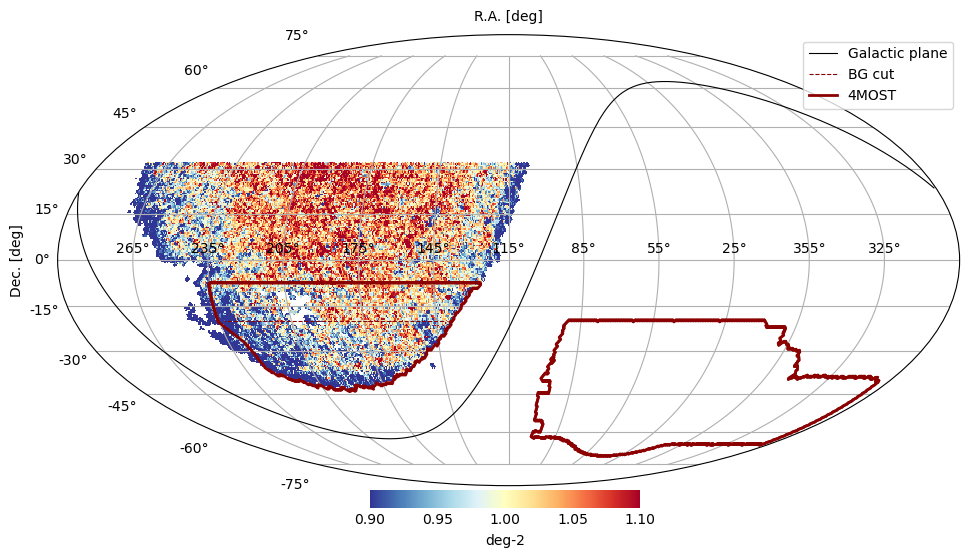

In [13]:
utils.plot_moll(w, rot=115, min=0.9, max=1.1, desi_footprint=False, fourmost_footprint=True, label='deg-2', nest=True)

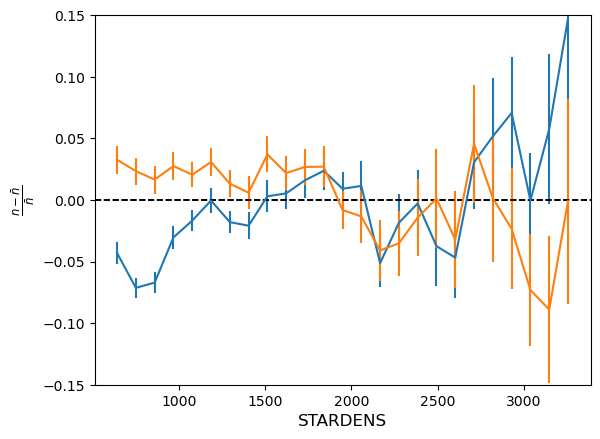

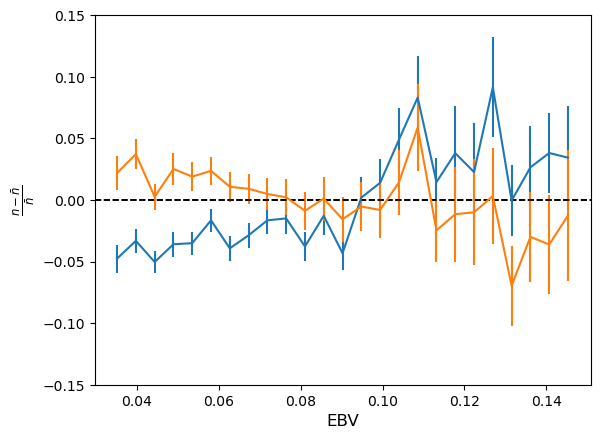

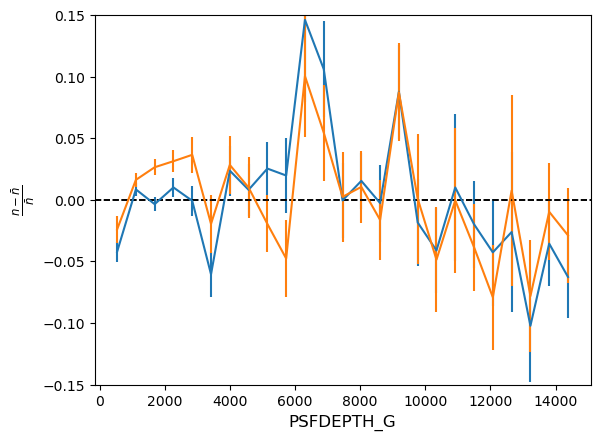

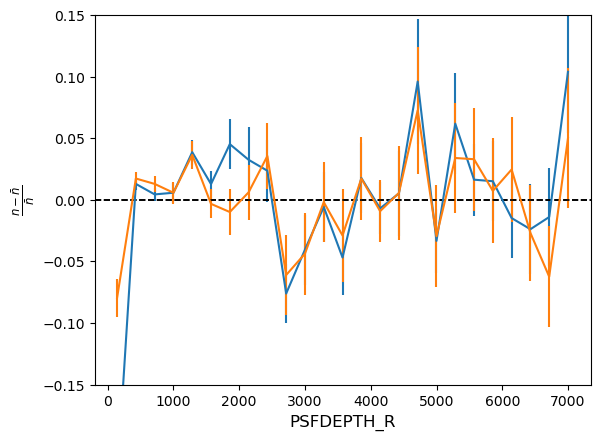

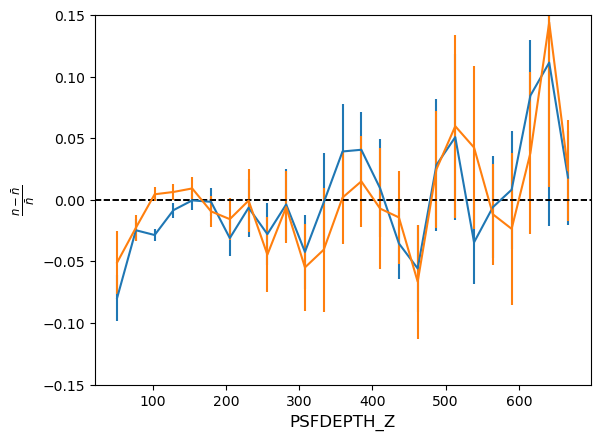

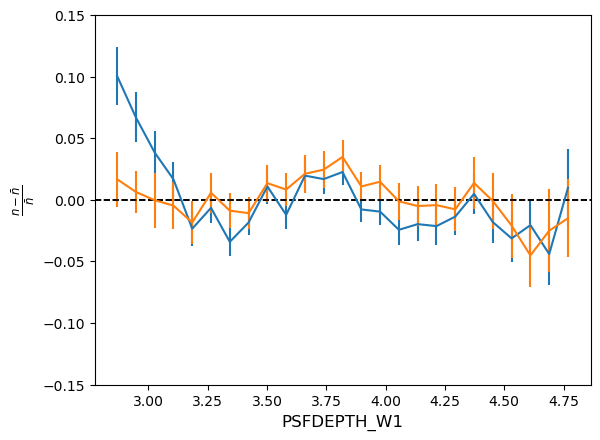

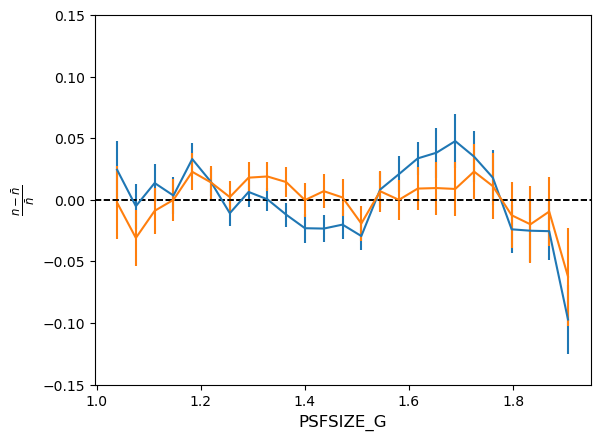

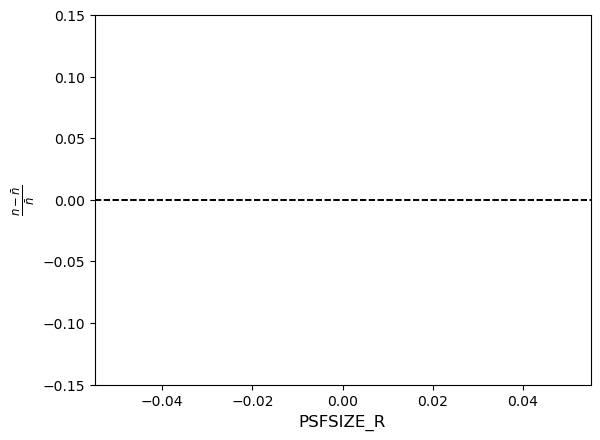

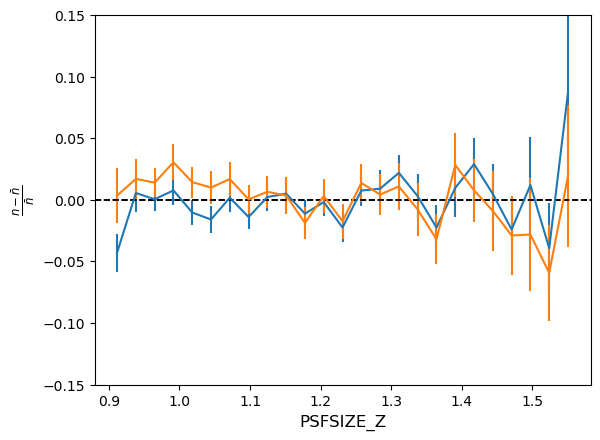

'keep_all = [np.all([keep_tot, weights*hpmap2/hpmap>=bins[i], weights*hpmap2/hpmap<bins[i+1]], axis=0) for i in range(nbins)]\nmean, std = np.array([np.mean((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1]) for mm in keep_all]), [np.std((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1])/np.sqrt(mm.sum()) for mm in keep_all]\n\nplt.errorbar(cbin, mean -1, [np.std(hpmap[mm]/n_bar)/np.sqrt(mm.sum()) for mm in keep_all])'

In [11]:
for feature in feature_names:
    for tar in [targets, targets*w]:
        nbins=25
        #keep_tot = hpmap != 0.0
        keep_tot = region_to_pred
        #n_bar = np.mean(hpmap[keep_tot])
        n_bar =np.mean(tar[keep_tot])

        boundary = np.quantile(features_pixmap[feature][keep_tot], q=[0.02,0.98])
        counts, bins = np.histogram(features_pixmap[feature][keep_tot], bins=nbins, range=boundary)
        sizebin= np.diff(bins)[0]
        cbin = 0.5*(bins[1:]+bins[:-1])
        keep_all = [np.all([features_pixmap[feature][keep_tot]>=bins[i], features_pixmap[feature][keep_tot]<bins[i+1]], axis=0) for i in range(nbins)]
        mean, std = np.array([np.mean((tar[keep_tot][mm]/n_bar)[tar[keep_tot][mm]/n_bar>0.1]) for mm in keep_all]), [np.std(tar[keep_tot][mm]/n_bar)/np.sqrt(mm.sum()) for mm in keep_all]

        #plt.errorbar(cbin, mean -1, [np.std(features_pixmap[feature_names][keep_tot][mm]/n_bar)/np.sqrt(mm.sum()) for mm in keep_all])
        plt.errorbar(cbin, mean/mean.mean() -1, np.hstack(std))

        plt.axhline(0, ls='--', lw=1.2, c='k')
        plt.grid()
        plt.xlabel(feature, fontsize=12)
        plt.ylabel(r'$\frac{n-\bar n}{\bar n}$', fontsize=12)
        plt.ylim(-0.15,0.15)
    plt.show()

'''wtargets = targets * w
n_bar =np.mean(wtargets[keep_tot])

keep_all = [np.all([features_pixmap[feature][keep_tot]>=bins[i], features_pixmap[feature][keep_tot]<bins[i+1]], axis=0) for i in range(nbins)]
mean, std = np.array([np.mean((wtargets[keep_tot][mm]/n_bar)[wtargets[keep_tot][mm]/n_bar>0.1]) for mm in keep_all]), [np.std(wtargets[keep_tot][mm]/n_bar)/np.sqrt(mm.sum()) for mm in keep_all]

#plt.errorbar(cbin, mean -1, [np.std(features_pixmap[feature_names][keep_tot][mm]/n_bar)/np.sqrt(mm.sum()) for mm in keep_all])
plt.errorbar(cbin, mean/mean.mean() -1, np.hstack(std))
'''


'''keep_all = [np.all([keep_tot, weights*hpmap2/hpmap>=bins[i], weights*hpmap2/hpmap<bins[i+1]], axis=0) for i in range(nbins)]
mean, std = np.array([np.mean((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1]) for mm in keep_all]), [np.std((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1])/np.sqrt(mm.sum()) for mm in keep_all]

plt.errorbar(cbin, mean -1, [np.std(hpmap[mm]/n_bar)/np.sqrt(mm.sum()) for mm in keep_all])'''


In [ ]:
mean.mean()

1.1213833285628327

In [ ]:
n_bar

357.7879462246418

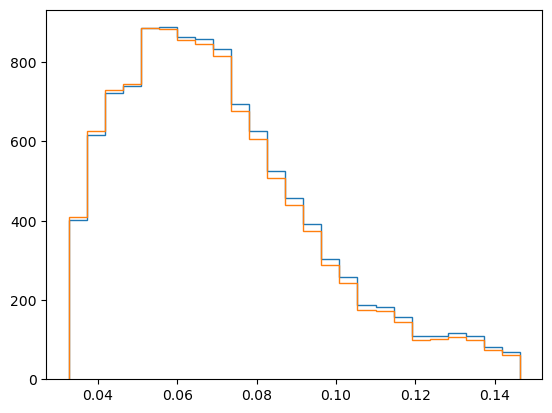

In [ ]:
a,b,_=plt.hist(features_pixmap[feature_names][keep_tot], bins=nbins, range=boundary, histtype='step')
c,d,_=plt.hist(features_pixmap[feature_names][keep_tot], bins=nbins, range=boundary, histtype='step', weights=w[keep_tot])

In [ ]:
a,c

(array([401., 616., 722., 741., 885., 888., 863., 859., 832., 695., 626.,
        526., 457., 391., 304., 257., 187., 183., 156., 108., 110., 117.,
        109.,  81.,  68.]),
 array([410.24352137, 626.80601579, 730.74545618, 745.93029148,
        886.08060223, 884.49384153, 854.95915162, 846.48523328,
        815.65823578, 677.7139    , 607.27751492, 507.63622392,
        438.82422125, 373.51865279, 288.94478682, 243.02272912,
        175.91891912, 171.29777007, 145.31649262, 100.08051772,
        101.40653402, 107.35763503,  99.51442781,  73.60203424,
         61.50592942]))

In [ ]:
from sklearn.linear_model import LinearRegression

regressor = LinearRegression()
X = np.vstack((hpmap2[hpmap2!=0], hpmap3[hpmap3!=0])).T
Y = hpmap[hpmap!=0]

Y_pred = np.zeros_like(hpmap)
mean, std = X.mean(), X.std()
X_for_training = X.copy()
X_for_training = (X - mean) / std
X_eval = (X - mean) / std

regressor.fit(X_for_training, Y)

Y_pred[hpmap!=0] = regressor.predict(X_eval)

In [ ]:
Y_pred[hpmap!=0].mean(), hpmap[hpmap!=0].mean()

(400.62764435855127, 400.62764435855127)

In [ ]:
weights = np.nan_to_num(hpmap/Y_pred)

/tmp/ipykernel_1146319/3306420445.py:1: RuntimeWarning: invalid value encountered in divide
  weights = np.nan_to_num(hpmap/Y_pred)


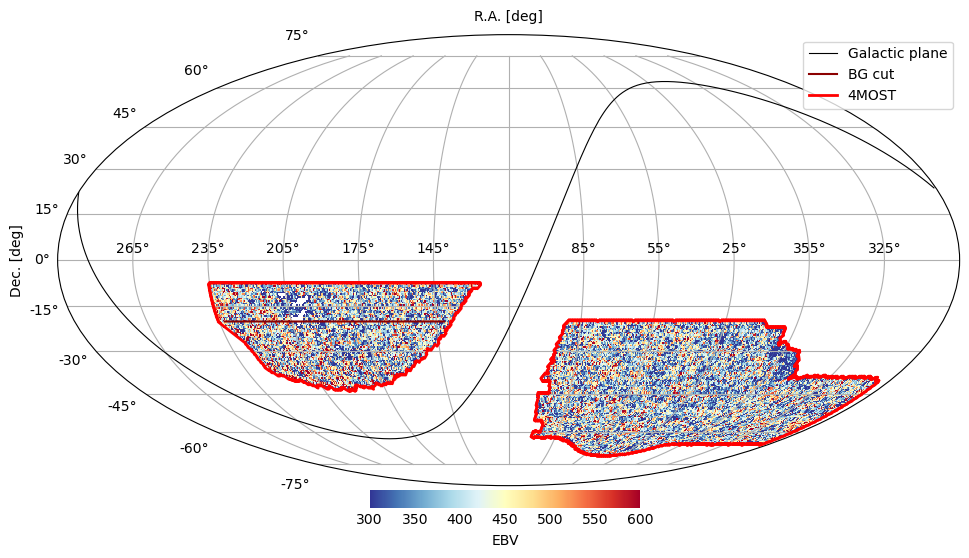

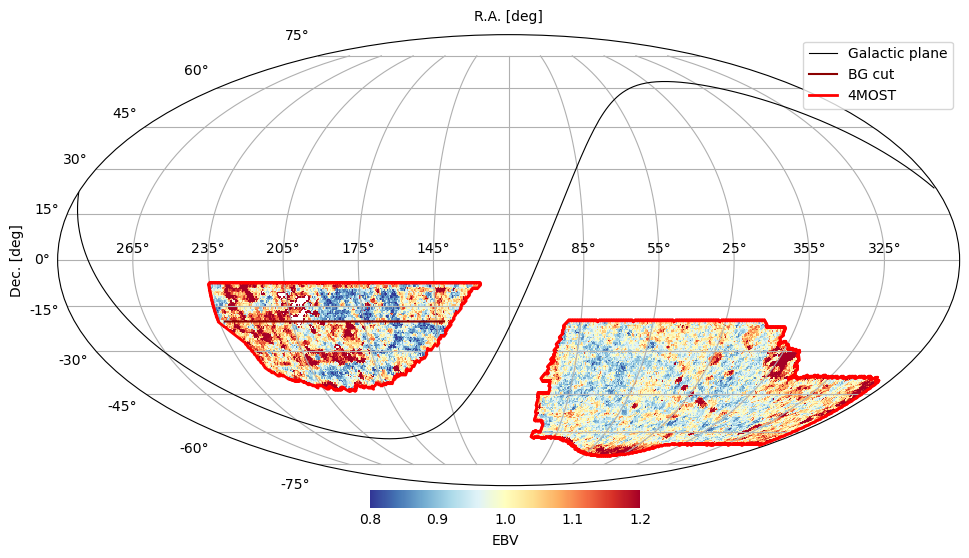

/tmp/ipykernel_1146319/1144275901.py:3: RuntimeWarning: invalid value encountered in divide
  utils.plot_moll(hpmap/weights, rot=115, min=300, max=600, desi_footprint=False, fourmost_footprint=True, label='EBV')


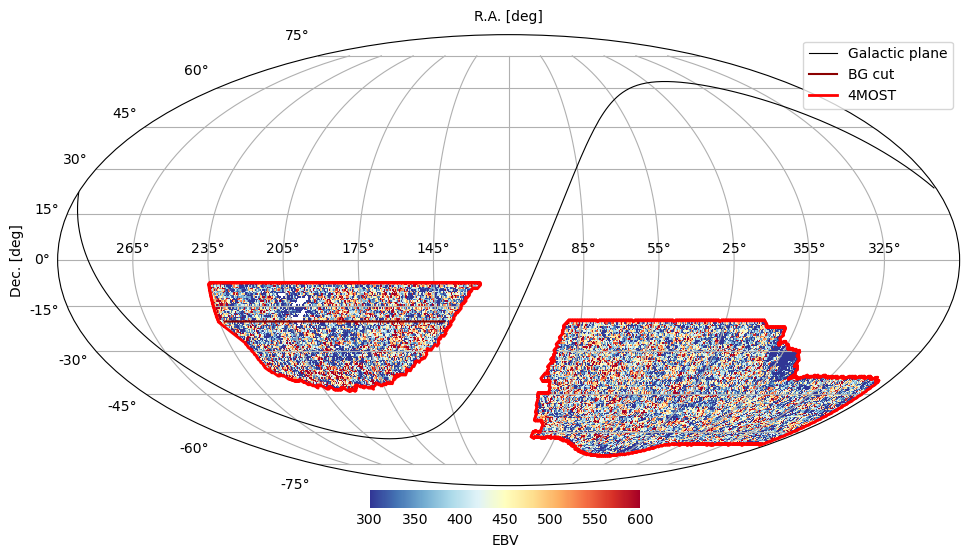

In [ ]:
utils.plot_moll(hpmap, rot=115, min=300, max=600, desi_footprint=False, fourmost_footprint=True, label='EBV')
utils.plot_moll(weights, rot=115, min=0.8, max=1.2, desi_footprint=False, fourmost_footprint=True, label='EBV')
utils.plot_moll(hpmap/weights, rot=115, min=300, max=600, desi_footprint=False, fourmost_footprint=True, label='EBV')


/tmp/ipykernel_1146319/2950994109.py:1: RuntimeWarning: invalid value encountered in divide
  weights = np.nan_to_num(Y_pred/hpmap)


In [ ]:
weights[weights!=0]

array([ 7.91448628,  1.05033485,  2.04597942, ...,  0.7051997 ,
        0.95164546, 54.63132599])

In [ ]:
w = np.zeros(hp.nside2npix(128)) * np.nan
w[Y_pred > 0] = 1.0 / Y_pred[Y_pred > 0]

In [ ]:
w.size

196608

In [ ]:
nbins=25
keep_tot = hpmap != 0.0
n_bar = np.mean(hpmap[keep_tot])

boundary = np.nanquantile(target_4m_lrg['EBV'][target_4m_lrg['isfoots8']], q=[0.02,0.98])
counts, bins = np.histogram((hpmap2/hpmap), bins=nbins, range=boundary)
sizebin= np.diff(bins)[0]
cbin = 0.5*(bins[1:]+bins[:-1])
keep_all = [np.all([keep_tot, hpmap2/hpmap>=bins[i], hpmap2/hpmap<bins[i+1]], axis=0) for i in range(nbins)]
mean, std = np.array([np.mean((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1]) for mm in keep_all]), [np.std((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1])/np.sqrt(mm.sum()) for mm in keep_all]


/tmp/ipykernel_1146319/2550681406.py:6: RuntimeWarning: invalid value encountered in divide
  counts, bins = np.histogram((hpmap2/hpmap), bins=nbins, range=boundary)
/tmp/ipykernel_1146319/2550681406.py:9: RuntimeWarning: invalid value encountered in divide
  keep_all = [np.all([keep_tot, hpmap2/hpmap>=bins[i], hpmap2/hpmap<bins[i+1]], axis=0) for i in range(nbins)]


In [ ]:
Y_pred[keep_tot] - hpmap[keep_tot]

array([310.51882084, 101.70798968, 222.14131054, ..., -34.98217644,
        71.88390643, 334.33436985])

In [ ]:
weights[weights!=0].mean()

1.0

In [ ]:
weights = np.nan_to_num(Y_pred/hpmap)
weights = np.nan_to_num(weights/weights[weights!=0].mean())
pix = hp.ang2pix(128, target_4m_lrg['RA'][target_4m_lrg['isfoots8']], target_4m_lrg['DEC'][target_4m_lrg['isfoots8']], lonlat=True, nest=False)

/tmp/ipykernel_1146319/265515960.py:1: RuntimeWarning: invalid value encountered in divide
  weights = np.nan_to_num(Y_pred/hpmap)


/tmp/ipykernel_1146319/3214029574.py:6: RuntimeWarning: invalid value encountered in divide
  counts, bins = np.histogram((hpmap2/hpmap), bins=nbins, range=boundary)
/tmp/ipykernel_1146319/3214029574.py:9: RuntimeWarning: invalid value encountered in divide
  keep_all = [np.all([keep_tot, hpmap2/hpmap>=bins[i], hpmap2/hpmap<bins[i+1]], axis=0) for i in range(nbins)]
/tmp/ipykernel_1146319/3214029574.py:20: RuntimeWarning: invalid value encountered in divide
  keep_all = [np.all([keep_tot, weights*hpmap2/hpmap>=bins[i], weights*hpmap2/hpmap<bins[i+1]], axis=0) for i in range(nbins)]


<ErrorbarContainer object of 3 artists>

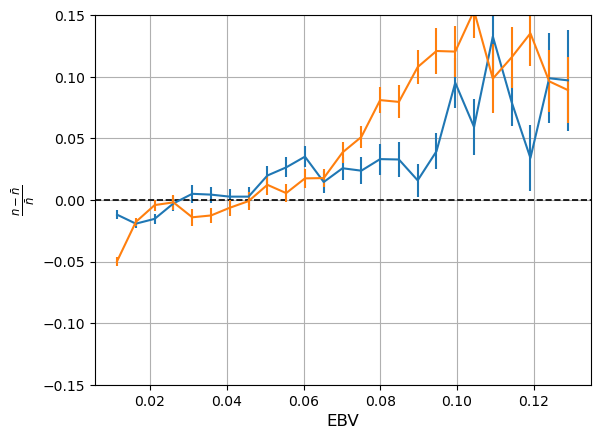

In [ ]:
nbins=25
keep_tot = hpmap != 0.0
n_bar = np.mean(hpmap[keep_tot])

boundary = np.nanquantile(target_4m_lrg['EBV'][target_4m_lrg['isfoots8']], q=[0.02,0.98])
counts, bins = np.histogram((hpmap2/hpmap), bins=nbins, range=boundary)
sizebin= np.diff(bins)[0]
cbin = 0.5*(bins[1:]+bins[:-1])
keep_all = [np.all([keep_tot, hpmap2/hpmap>=bins[i], hpmap2/hpmap<bins[i+1]], axis=0) for i in range(nbins)]
mean, std = np.array([np.mean((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1]) for mm in keep_all]), [np.std((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1])/np.sqrt(mm.sum()) for mm in keep_all]

plt.errorbar(cbin, mean -1, [np.std(hpmap[mm]/n_bar)/np.sqrt(mm.sum()) for mm in keep_all])
plt.axhline(0, ls='--', lw=1.2, c='k')
plt.grid()
plt.xlabel('EBV', fontsize=12)
plt.ylabel(r'$\frac{n-\bar n}{\bar n}$', fontsize=12)
plt.ylim(-0.15,0.15)


keep_all = [np.all([keep_tot, weights*hpmap2/hpmap>=bins[i], weights*hpmap2/hpmap<bins[i+1]], axis=0) for i in range(nbins)]
mean, std = np.array([np.mean((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1]) for mm in keep_all]), [np.std((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1])/np.sqrt(mm.sum()) for mm in keep_all]

plt.errorbar(cbin, mean -1, [np.std(hpmap[mm]/n_bar)/np.sqrt(mm.sum()) for mm in keep_all])


/tmp/ipykernel_1146319/3731383316.py:6: RuntimeWarning: invalid value encountered in divide
  counts, bins = np.histogram((hpmap2/hpmap), bins=nbins, range=boundary)
/tmp/ipykernel_1146319/3731383316.py:9: RuntimeWarning: invalid value encountered in divide
  keep_all = [np.all([keep_tot, hpmap3/hpmap>=bins[i], hpmap3/hpmap<bins[i+1]], axis=0) for i in range(nbins)]
/tmp/ipykernel_1146319/3731383316.py:20: RuntimeWarning: invalid value encountered in divide
  keep_all = [np.all([keep_tot, hpmap3/hpmap>=bins[i], hpmap3/hpmap<bins[i+1]], axis=0) for i in range(nbins)]


<ErrorbarContainer object of 3 artists>

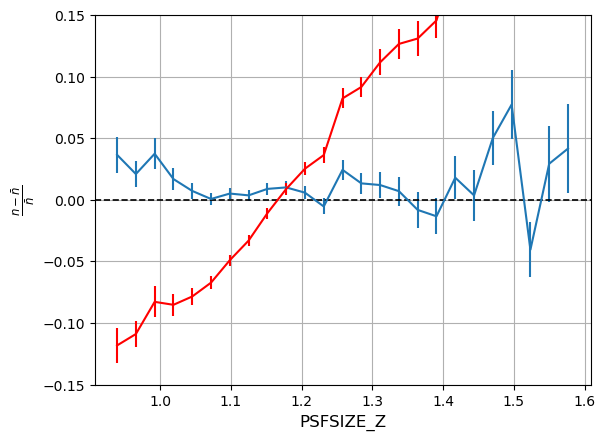

In [ ]:
nbins=25
keep_tot = hpmap != 0.0
n_bar = np.mean(hpmap[keep_tot])
feature = 'PSFSIZE_Z'
boundary = np.nanquantile(target_4m_lrg[feature][target_4m_lrg['isfoots8']], q=[0.02,0.98])
counts, bins = np.histogram((hpmap2/hpmap), bins=nbins, range=boundary)
sizebin= np.diff(bins)[0]
cbin = 0.5*(bins[1:]+bins[:-1])
keep_all = [np.all([keep_tot, hpmap3/hpmap>=bins[i], hpmap3/hpmap<bins[i+1]], axis=0) for i in range(nbins)]
mean, std = np.array([np.mean((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1]) for mm in keep_all]),  [np.std((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1])/np.sqrt(mm.sum()) for mm in keep_all]

plt.errorbar(cbin, mean -1, [np.std(hpmap[mm]/n_bar)/np.sqrt(mm.sum()) for mm in keep_all])
plt.axhline(0, ls='--', lw=1.2, c='k')
plt.grid()
plt.xlabel(feature, fontsize=12)
plt.ylabel(r'$\frac{n-\bar n}{\bar n}$', fontsize=12)
plt.ylim(-0.15,0.15)


keep_all = [np.all([keep_tot, hpmap3/hpmap>=bins[i], hpmap3/hpmap<bins[i+1]], axis=0) for i in range(nbins)]
mean, std = np.array([np.mean((weights[mm]/hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1]) for mm in keep_all]), [np.std((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1])/np.sqrt(mm.sum()) for mm in keep_all]

plt.errorbar(cbin, mean -1, [np.std(hpmap[mm]/n_bar)/np.sqrt(mm.sum()) for mm in keep_all], c='r')


In [ ]:
counts, bins = np.histogram((hpmap2/hpmap), bins=nbins, range=boundary)


/tmp/ipykernel_1146319/2835886418.py:1: RuntimeWarning: invalid value encountered in divide
  counts, bins = np.histogram((hpmap2/hpmap), bins=nbins, range=boundary)


In [ ]:
counts

array([3994, 5164, 3066, 1753, 1606, 1681, 1715, 1504, 1378, 1448, 1241,
       1120, 1146,  888,  822,  704,  603,  488,  381,  287,  222,  225,
        156,  141,  151])

In [ ]:
counts

array([4435.90044598, 5568.04768104, 3258.42227366, 1844.05071529,
       1657.74435793, 1712.9729393 , 1708.52388124, 1463.59122436,
       1345.85334592, 1390.27029326, 1179.80192272, 1031.68117067,
       1047.59693666,  789.50319232,  723.17239602,  607.20378295,
        509.73378713,  409.96511894,  327.62590245,  236.93853138,
        188.86533921,  185.79621362,  121.74340259,  112.47781024,
        118.8380768 ])

In [ ]:
import healpy as hp 

nside=256
nbins=25
cols = ['EBV']#, 'PSFDEPTH_G', 'PSFDEPTH_Z', 'PSFDEPTH_R', 'PSFSIZE_G', 'PSFSIZE_R', 'PSFSIZE_Z', 'GALDEPTH_G', 'GALDEPTH_Z', 'GALDEPTH_R' ]
fig, axx = plt.subplots(2,5, figsize=(20,5), sharey=True, constrained_layout = True)
axs=axx.flatten()
s, a_guess = [], [1.0]
hpmap = utils.create_hp_map(target_4m_lrg['RA'][mask_s8fp], target_4m_lrg['DEC'][mask_s8fp] ,nside=nside)
pixarea = hp.nside2pixarea(nside, degrees=True)
keep_tot = hpmap != 0.0
n_bar = np.mean(hpmap[keep_tot])
for col, ax in zip(cols, axs):
    val_col = -2.5*(np.log10(5/np.sqrt(target_4m_bg[col][mask_s8fp]))-9) if 'DEPTH' in col else target_4m_bg[col][mask_s8fp]
    boundary = np.nanquantile(val_col, q=[0.02,0.98])

    
    hpmap_w = utils.create_hp_map(target_4m_bg['RA'][mask_s8fp], target_4m_bg['DEC'][mask_s8fp], weight=val_col, nside=nside)

    counts, bins = np.histogram((hpmap_w/hpmap), bins=nbins, range=boundary)
    sizebin= np.diff(bins)[0]
    cbin = 0.5*(bins[1:]+bins[:-1])
    keep_all = [np.all([keep_tot, hpmap_w/hpmap>=bins[i], hpmap_w/hpmap<bins[i+1]], axis=0) for i in range(nbins)]
    mean, std = np.array([np.mean((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1]) for mm in keep_all]), [np.std((hpmap[mm]/n_bar)[hpmap[mm]/n_bar>0.1])/np.sqrt(mm.sum()) for mm in keep_all]

    ax.errorbar(cbin, mean -1, [np.std(hpmap[mm]/n_bar)/np.sqrt(mm.sum()) for mm in keep_all])
    ax.axhline(0, ls='--', lw=1.2, c='k')
    ax.grid()
    ax.set_xlabel(col, fontsize=12)
    ax.set_ylabel(r'$\frac{n-\bar n}{\bar n}$', fontsize=12)
    ax.set_ylim(-0.15,0.15)

    ax_hist = ax.twinx()
    ax_hist.set_xlim(ax.get_xlim())
    ax_hist.set_ylim(0,0.4)
    normalisation = counts.sum()
    ax_hist.bar(cbin, counts/normalisation, alpha=0.4, color='dimgray', align='center', width=sizebin, label='Fraction of no. objects\nby bin')
    ax_hist.grid(False)
    ax_hist.set_yticks([])


array([ 0.        ,  0.        ,  0.        , ..., 33.830895  ,
        5.73421726,  7.886482  ])

In [ ]:
cols = ['EBV', 'PSFDEPTH_G', 'PSFDEPTH_Z', 'PSFDEPTH_R', 'PSFSIZE_G', 'PSFSIZE_R', 'PSFSIZE_Z', 'GALDEPTH_G', 'GALDEPTH_Z', 'GALDEPTH_R' ]
feature_maps = {}
nside=256
for col in cols:
    val_col = -2.5*(np.log10(5/np.sqrt(target_4m_bg[col]))-9) if 'DEPTH' in col else target_4m_bg[col]
    val_min, val_max = np.quantile(val_col, q=[0.02,0.98])
    hpmap = utils.create_hp_map(target_4m_bg['RA'], target_4m_bg['DEC'], nside=nside)
    hpmap2 = utils.create_hp_map(target_4m_bg['RA'], target_4m_bg['DEC'], weight=val_col, nside=nside)
    utils.plot_moll(hpmap,hpmap2, rot=115, min=val_min, max=val_max, desi_footprint=False, fourmost_footprint=True, label=col)
    feature_maps[col] = hpmap2/hpmap

Catalog(csize=8228439, size=8228439, columns=['RELEASE', 'BRICKID', 'BRICKNAME', 'OBJID', 'TYPE', 'RA', 'DEC', 'RA_IVAR', 'DEC_IVAR', 'DCHISQ', 'EBV', 'FLUX_G', 'FLUX_R', 'FLUX_I', 'FLUX_Z', 'FLUX_W1', 'FLUX_W2', 'FLUX_W3', 'FLUX_W4', 'FLUX_IVAR_G', 'FLUX_IVAR_R', 'FLUX_IVAR_I', 'FLUX_IVAR_Z', 'FLUX_IVAR_W1', 'FLUX_IVAR_W2', 'FLUX_IVAR_W3', 'FLUX_IVAR_W4', 'MW_TRANSMISSION_G', 'MW_TRANSMISSION_R', 'MW_TRANSMISSION_I', 'MW_TRANSMISSION_Z', 'MW_TRANSMISSION_W1', 'MW_TRANSMISSION_W2', 'MW_TRANSMISSION_W3', 'MW_TRANSMISSION_W4', 'NOBS_G', 'NOBS_R', 'NOBS_I', 'NOBS_Z', 'NOBS_W1', 'NOBS_W2', 'NOBS_W3', 'NOBS_W4', 'RCHISQ_G', 'RCHISQ_R', 'RCHISQ_I', 'RCHISQ_Z', 'RCHISQ_W1', 'RCHISQ_W2', 'RCHISQ_W3', 'RCHISQ_W4', 'FRACFLUX_G', 'FRACFLUX_R', 'FRACFLUX_I', 'FRACFLUX_Z', 'FRACFLUX_W1', 'FRACFLUX_W2', 'FRACFLUX_W3', 'FRACFLUX_W4', 'FRACMASKED_G', 'FRACMASKED_R', 'FRACMASKED_I', 'FRACMASKED_Z', 'FRACIN_G', 'FRACIN_R', 'FRACIN_I', 'FRACIN_Z', 'ANYMASK_G', 'ANYMASK_R', 'ANYMASK_I', 'ANYMASK_Z', 'ALLM

In [ ]:
target_4m_bg = Catalog.read(glob.glob('/pscratch/sd/a/arocher/4MOST/target_bg_mag_r19_4most_v2.fits'))
target_4m_lrg = Catalog.read(glob.glob('/pscratch/sd/a/arocher/4MOST/target_lrg_4most_v2.fits'))
target_qso = Catalog.read(['/pscratch/sd/a/arocher/4MOST/QSO_DR10_Apr2024.fits', '/pscratch/sd/a/arocher/4MOST/QSO_ATLAS_Apr2024.fits'])


In [ ]:
target_4m_bg[target_4m_bg['isfoots8']]

Catalog(csize=1364062, size=1364062, columns=['RELEASE', 'BRICKID', 'BRICKNAME', 'OBJID', 'TYPE', 'RA', 'DEC', 'RA_IVAR', 'DEC_IVAR', 'DCHISQ', 'EBV', 'FLUX_G', 'FLUX_R', 'FLUX_I', 'FLUX_Z', 'FLUX_W1', 'FLUX_W2', 'FLUX_W3', 'FLUX_W4', 'FLUX_IVAR_G', 'FLUX_IVAR_R', 'FLUX_IVAR_I', 'FLUX_IVAR_Z', 'FLUX_IVAR_W1', 'FLUX_IVAR_W2', 'FLUX_IVAR_W3', 'FLUX_IVAR_W4', 'MW_TRANSMISSION_G', 'MW_TRANSMISSION_R', 'MW_TRANSMISSION_I', 'MW_TRANSMISSION_Z', 'MW_TRANSMISSION_W1', 'MW_TRANSMISSION_W2', 'MW_TRANSMISSION_W3', 'MW_TRANSMISSION_W4', 'NOBS_G', 'NOBS_R', 'NOBS_I', 'NOBS_Z', 'NOBS_W1', 'NOBS_W2', 'NOBS_W3', 'NOBS_W4', 'RCHISQ_G', 'RCHISQ_R', 'RCHISQ_I', 'RCHISQ_Z', 'RCHISQ_W1', 'RCHISQ_W2', 'RCHISQ_W3', 'RCHISQ_W4', 'FRACFLUX_G', 'FRACFLUX_R', 'FRACFLUX_I', 'FRACFLUX_Z', 'FRACFLUX_W1', 'FRACFLUX_W2', 'FRACFLUX_W3', 'FRACFLUX_W4', 'FRACMASKED_G', 'FRACMASKED_R', 'FRACMASKED_I', 'FRACMASKED_Z', 'FRACIN_G', 'FRACIN_R', 'FRACIN_I', 'FRACIN_Z', 'ANYMASK_G', 'ANYMASK_R', 'ANYMASK_I', 'ANYMASK_Z', 'ALLM

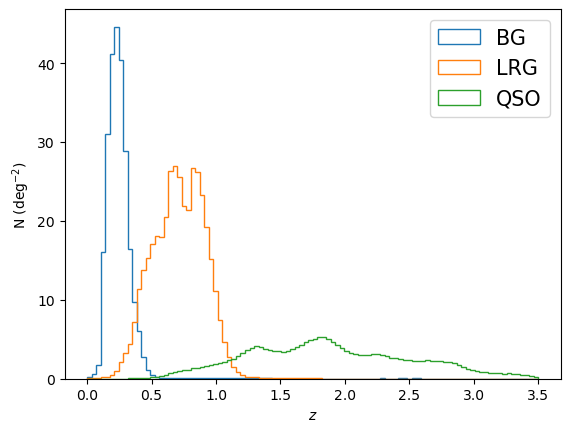

In [ ]:
plt.hist(target_4m_bg['Z_PHOT_MEAN'][target_4m_bg['isfoots8']], bins=100, range=(0, 3.5), 
         weights=np.ones(target_4m_bg['isfoots8'].sum())*1/5600, histtype='step', label='BG')
plt.hist(target_4m_lrg['Z_PHOT_MEAN'][target_4m_lrg['isfoots8']], bins=100, range=(0, 3.5), 
         histtype='step', weights=np.ones(target_4m_lrg['isfoots8'].sum())*1/7000, label='LRG')
plt.hist(target_qso['REDSHIFT_ESTIMATE'], bins=100, range=(0, 3.5), histtype='step', label='QSO', 
         weights=np.ones(target_qso.size)*1/7000)
#plt.xscale('symlog')
plt.xlabel('$z$')
plt.ylabel('N (deg$^{-2}$)')
plt.legend(fontsize=15)
plt.show()



In [ ]:
a.sum()

196.68285714285736